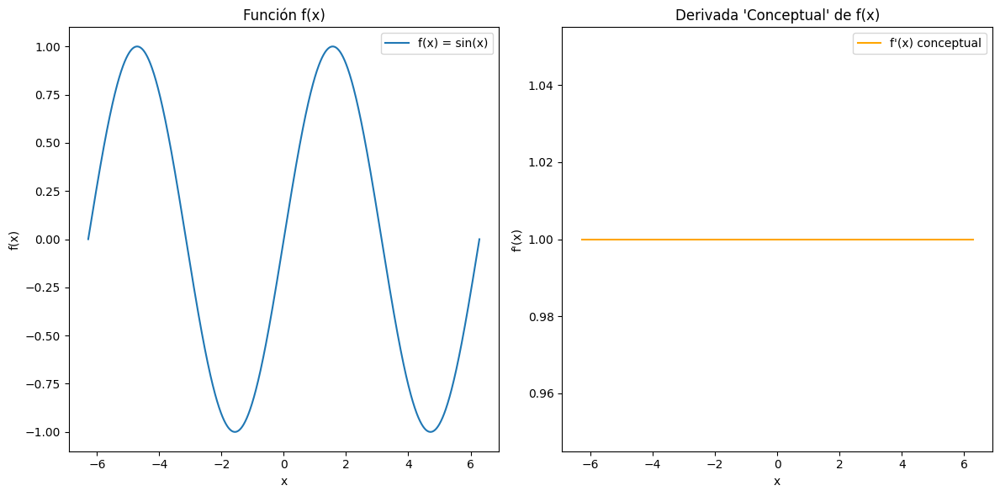

In [ ]:
def is_rational(x):
    """Determina si un número es racional para la simulación.
    En este caso, consideramos 'racionales' a los números que tienen una representación decimal finita o periódica.
    Esta es una simplificación y no refleja la definición matemática real de un número racional.
    """
    return x == np.round(x, 2)

def f_prime_simulated_conceptual(x):
    """'Derivada' conceptual de f que depende de si x es 'racional' o no."""
    return 0 if is_rational(x) else 1

# Utilizamos la misma función f(x) = sin(x)
y_prime_conceptual = np.array([f_prime_simulated_conceptual(xi) for xi in x])

# Graficamos la función f(x) y su 'derivada' f'(x) conceptual
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(x, y, label='f(x) = sin(x)')
plt.title('Función f(x)')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(x, y_prime_conceptual, label="f'(x) conceptual", color='orange')
plt.title("Derivada 'Conceptual' de f(x)")
plt.xlabel('x')
plt.ylabel("f'(x)")
plt.legend()

plt.tight_layout()
plt.show()


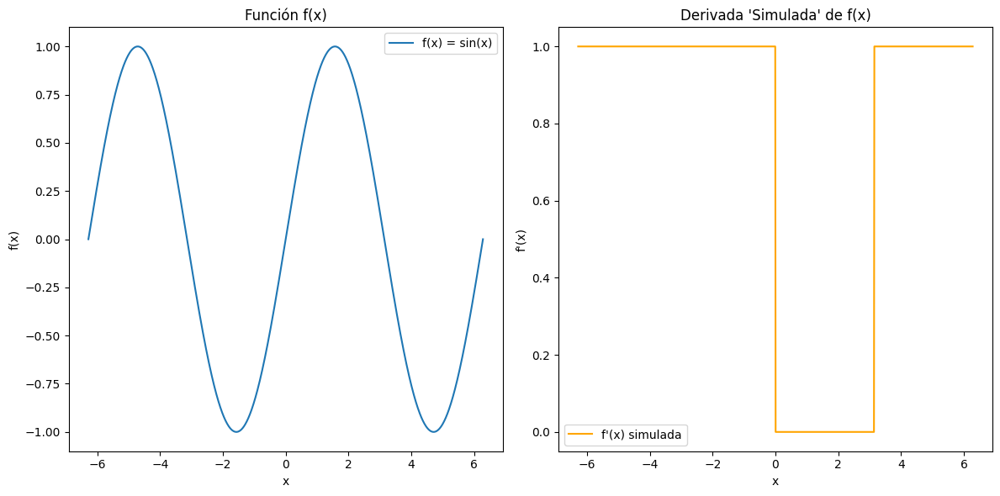

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definimos una función f(x) y su "derivada" f'(x) para la simulación
# En este caso, f'(x) cambia su valor basado en si x está en un rango específico,
# simulando la idea de pertenecer a un conjunto A.

def f(x):
    """Función arbitraria para la simulación."""
    return np.sin(x)

def f_prime_simulated(x):
    """'Derivada' simulada de f que depende de un rango específico de x."""
    # Supongamos que el rango [0, π] representa el conjunto A de manera abstracta
    return 0 if 0 <= x <= np.pi else 1

# Generamos puntos para graficar
x = np.linspace(-2 * np.pi, 2 * np.pi, 1000)
y = f(x)
y_prime_simulated = np.array([f_prime_simulated(xi) for xi in x])

# Graficamos la función f(x) y su 'derivada' f'(x) simulada
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(x, y, label='f(x) = sin(x)')
plt.title('Función f(x)')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(x, y_prime_simulated, label="f'(x) simulada", color='orange')
plt.title("Derivada 'Simulada' de f(x)")
plt.xlabel('x')
plt.ylabel("f'(x)")
plt.legend()

plt.tight_layout()
plt.show()


<ipython-input-3-7c2ed8899e2e>:38: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(frequencies, np.abs(g_t_fft), use_line_collection=True)


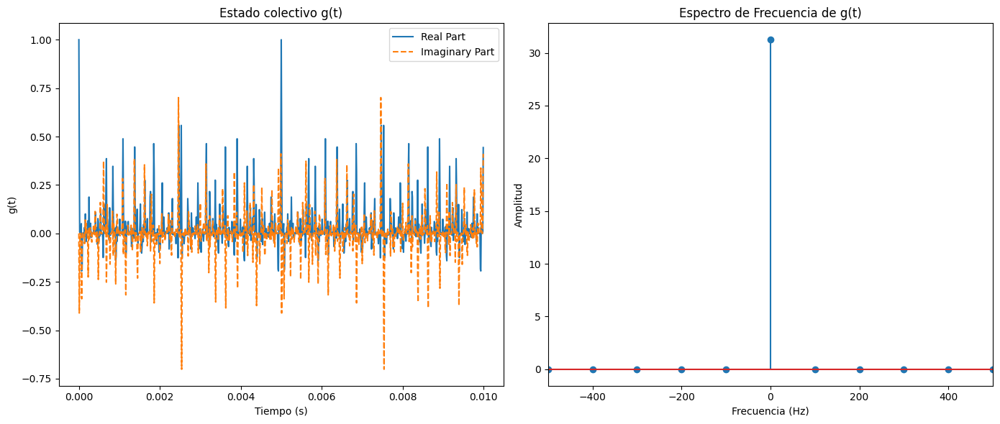

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft

# Definir el conjunto G y la frecuencia fundamental f0
G = [130, -130, -146, -166, -44, 118]
f0 = 100  # Hz

# Número de memprocesadores, igual al tamaño de G
n = len(G)

# Tiempo de muestreo y número de muestras para la simulación
T = 1 / f0  # Periodo mínimo
num_samples = 1000  # Número de muestras
t = np.linspace(0, T, num_samples, endpoint=False)  # Vector de tiempo

# Calcula el estado colectivo g(t)
g_t = 2**(-n) * np.prod([(1 + np.exp(1j * 2 * np.pi * a * f0 * t)) for a in G], axis=0)

# Realizar la Transformada de Fourier Discreta para obtener el espectro
g_t_fft = fft(g_t)
frequencies = np.fft.fftfreq(num_samples, d=T/num_samples)

# Graficar el estado colectivo y su espectro de frecuencia
plt.figure(figsize=(14, 6))

# Estado colectivo g(t)
plt.subplot(1, 2, 1)
plt.plot(t, g_t.real, label='Real Part')
plt.plot(t, g_t.imag, label='Imaginary Part', linestyle='--')
plt.title('Estado colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

# Espectro de frecuencia
plt.subplot(1, 2, 2)
plt.stem(frequencies, np.abs(g_t_fft), use_line_collection=True)
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(-500, 500)  # Limitar el rango de frecuencias para mejor visualización

plt.tight_layout()
plt.show()


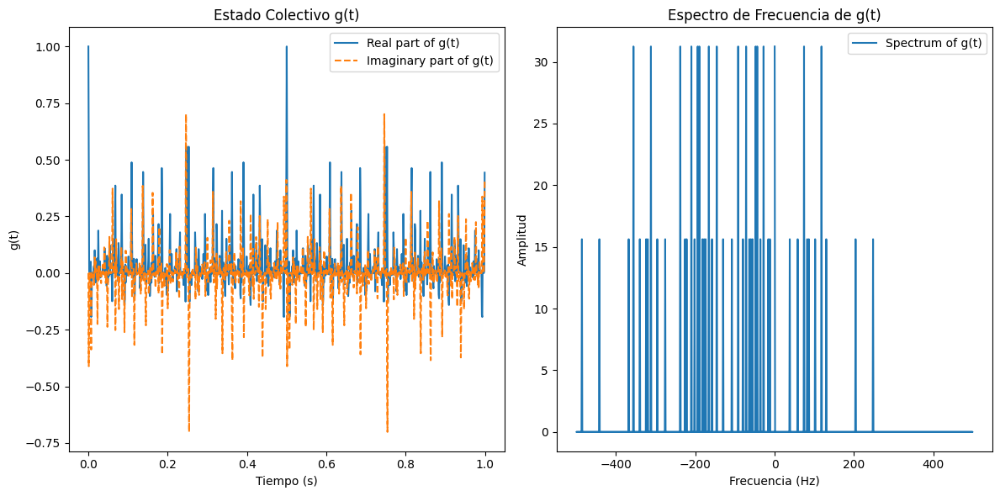

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def calculate_collective_state(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para el conjunto G y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)

    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))

    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

# Definimos el conjunto G y la frecuencia fundamental f0
G = np.array([130, -130, -146, -166, -44, 118])  # Este es un ejemplo, se puede cambiar
f0 = 1.0  # Frecuencia fundamental, se puede ajustar

# Generamos los puntos de tiempo para la simulación
time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación

# Calculamos el estado colectivo g(t)
g_t = calculate_collective_state(G, f0, time_points)

# Calculamos el espectro de frecuencia
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Graficamos el estado colectivo y su espectro de frecuencia
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()



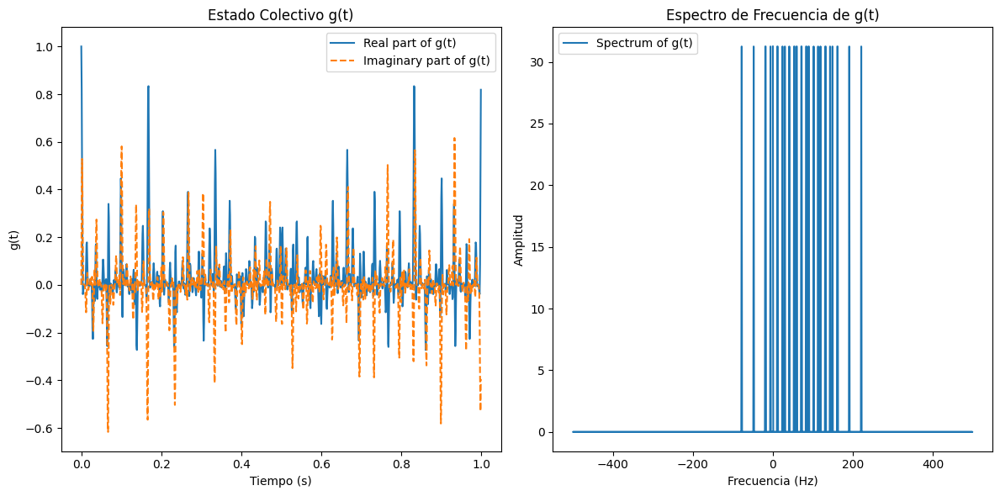

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def analyze_subset_sum(g_set, f0):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 100000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Generar un conjunto aleatorio de elementos
num_elements = 5  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
G_random = generate_random_set(num_elements, element_range)
f0 = 1.0  # Frecuencia fundamental

# Realizar la simulación
analyze_subset_sum(G_random, f0)


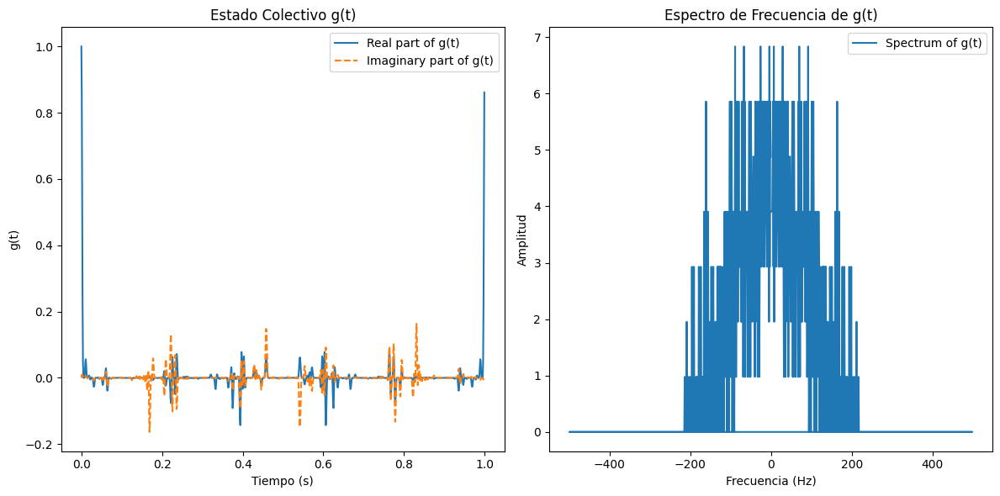

array([  5,  63,  96,  13,   5, -30, -72, -18,  35, -94])

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

# Re-definir las funciones necesarias para la simulación
def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def analyze_subset_sum(g_set, f0):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set = analyze_subset_sum(G_random, f0)
generated_set



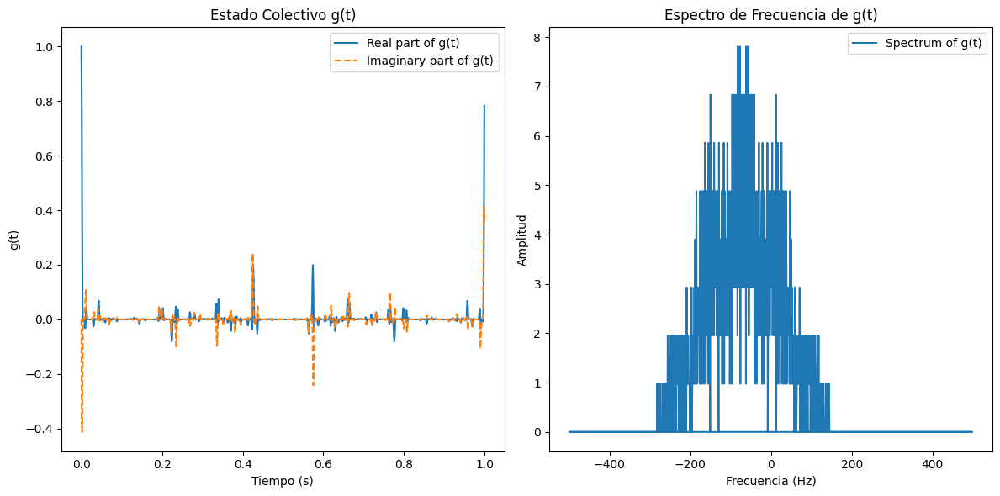

(array([  5, -21,  -3,  14,  99, -89, -71, -30,  26, -68]),
 {0: 4.88281250000001,
  1: 2.929687499999993,
  2: 2.929687499999995,
  3: 5.859375000000023,
  4: 1.9531249999999576,
  5: 4.8828125000000036,
  6: 2.9296874999999862,
  7: 4.8828124999999964,
  8: 3.9062499999999907,
  9: 1.9531249999999523,
  10: 3.9062500000000084,
  11: 2.9296874999999902,
  12: 6.835937499999991,
  14: 2.929687499999983,
  15: 4.882812500000023,
  16: 1.9531250000000122,
  17: 5.859374999999984,
  18: 0.9765624999999767,
  19: 2.9296875000000293,
  20: 3.9062500000000147,
  21: 4.8828125000000036,
  22: 2.929687499999983,
  23: 1.9531249999999951,
  24: 4.882812500000028,
  25: 2.9296874999999893,
  26: 5.859374999999984,
  27: 0.9765624999999829,
  28: 2.929687500000001,
  29: 4.8828125000000036,
  30: 1.953124999999979,
  31: 2.9296874999999827,
  32: 0.976562499999997,
  33: 4.882812500000011,
  34: 0.9765624999999999,
  35: 1.953124999999978,
  36: 2.929687500000009,
  37: 0.9765625000000342,
  38: 

In [ ]:


import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    # Normalizar las frecuencias y buscar frecuencias enteras dentro del rango posible
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}

    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            # Considerar solo frecuencias con amplitud significativa
            if amp > 1e-5:
                possible_sums[freq] = amp

    return possible_sums

def analyze_subset_sum(g_set, f0, element_range):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Interpretar el espectro de frecuencia
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums

# Parámetros para la generación del conjunto
num_elements = 10  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
f0 = 1.0  # Frecuencia fundamental

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums = analyze_subset_sum(G_random, f0, element_range)

generated_set, interpreted_sums



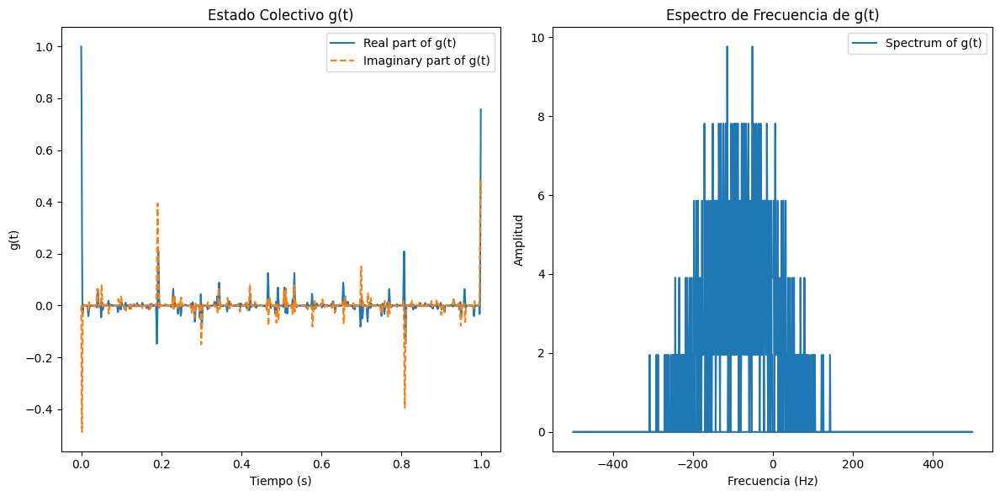

Conjunto Aleatorio Generado: [-57  47 -21  53  43 -73   0 -17 -41 -99]
Sumas Posibles y Amplitudes:
     Suma  Amplitud
0       0  3.906250
1       1  3.906250
2       2  5.859375
3       3  1.953125
4       5  3.906250
..    ...       ...
144    -8  3.906250
145    -5  3.906250
146    -4  5.859375
147    -3  1.953125
148    -2  1.953125

[149 rows x 2 columns]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Importar pandas

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    # Normalizar las frecuencias y buscar frecuencias enteras dentro del rango posible
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}

    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            # Considerar solo frecuencias con amplitud significativa
            if amp > 1e-5:
                possible_sums[freq] = amp

    return possible_sums

def analyze_subset_sum(g_set, f0, element_range):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Interpretar el espectro de frecuencia
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums = analyze_subset_sum(G_random, f0, element_range)

# Crear un DataFrame de pandas para mostrar las sumas y sus amplitudes
sums_df = pd.DataFrame(list(interpreted_sums.items()), columns=['Suma', 'Amplitud'])
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles y Amplitudes:")
print(sums_df)


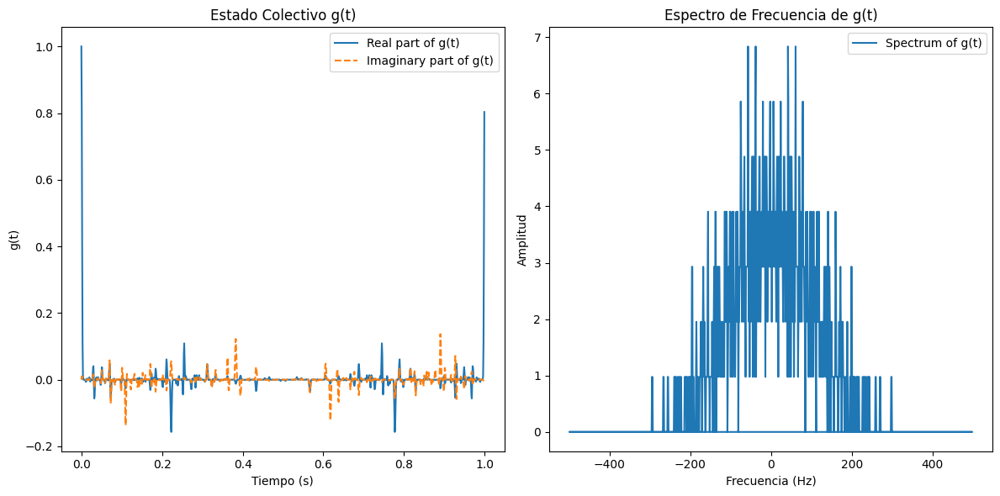

Conjunto Aleatorio Generado: [-39  81 -58  63   1  55 -99 -28  99 -71]
Sumas Posibles Interpretadas: {0: 2.929687499999971, 1: 3.9062499999999956, 2: 1.9531250000000127, 3: 3.906249999999993, 4: 2.9296874999999862, 5: 2.929687499999959, 6: 5.859374999999934, 7: 4.882812499999952, 8: 3.906249999999961, 9: 2.92968749999993, 10: 2.929687499999936, 11: 3.906250000000006, 12: 2.929687500000015, 13: 1.9531249999999745, 14: 3.9062499999999885, 15: 4.882812500000045, 16: 4.882812500000038, 17: 3.906249999999994, 18: 0.9765624999999869, 19: 4.882812500000005, 20: 4.8828125000000195, 21: 2.9296874999999876, 22: 2.9296874999999445, 23: 2.929687499999938, 24: 5.8593749999999805, 25: 3.906249999999968, 26: 2.929687499999928, 27: 3.9062499999999956, 28: 2.9296875000000133, 29: 2.9296874999999707, 30: 1.953124999999993, 31: 1.9531250000000135, 32: 4.882812500000006, 33: 4.882812499999941, 34: 3.9062499999999036, 35: 3.906249999999961, 36: 1.953124999999946, 37: 3.9062499999999263, 38: 3.9062499999999

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    # Modificar para devolver también las frecuencias y amplitudes
    return possible_sums, {freq: amp for freq, amp in zip(normalized_frequencies, np.abs(spectrum)) if -element_range <= freq <= element_range}

def track_contributing_elements(possible_sums, target_sum, f0):
    contributing_elements = []
    for freq, amp in possible_sums.items():
        if round(freq * f0) == target_sum:
            contributing_elements.append((freq, amp))
    return contributing_elements

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    possible_sums, frequency_amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Rastrear elementos contribuyentes
    contributing_elements = track_contributing_elements(frequency_amplitudes, target_sum, f0)

    print("Elementos Contribuyentes a la Suma Objetivo:", contributing_elements)


def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

# Parámetros para la generación del conjunto
num_elements = 10  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
f0 = 1.0  # Frecuencia fundamental
target_sum = 77  # Suma objetivo para el SSP

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("\033[1m" + "¿Se logró la suma objetivo? " + str(success) + "\033[0m")  # Imprimir en negrita


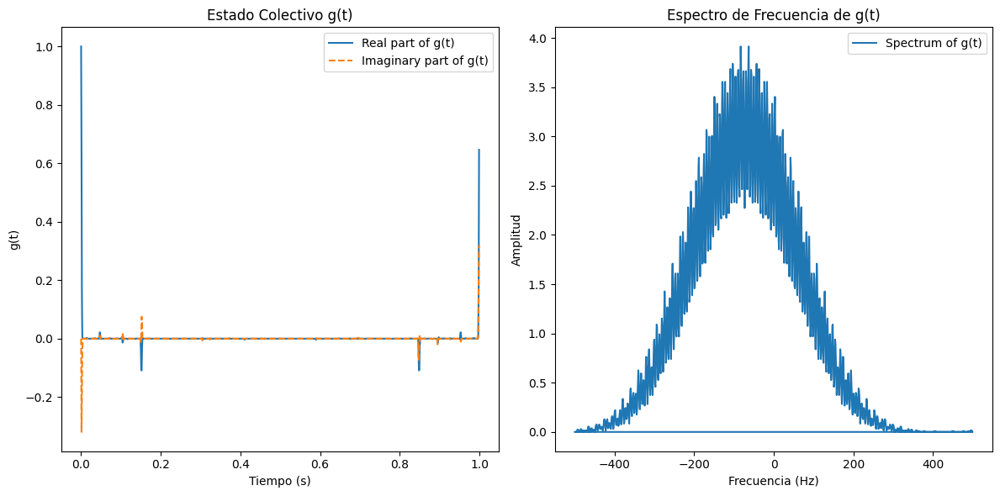

Conjunto Aleatorio Generado: [ 27 -66 -92  59 -78  80  65   1 -86 -40  46   2  68 -85 -59  58 -46]
Sumas Posibles Interpretadas: {0: 2.098083496093716, 1: 2.6168823242187242, 2: 3.227233886718734, 3: 3.4027099609374867, 4: 2.998352050781231, 5: 2.342224121093722, 6: 1.9836425781249658, 7: 2.0217895507812194, 8: 2.5482177734374796, 9: 3.005981445312486, 10: 2.9067993164062362, 11: 2.4871826171874796, 12: 1.9836425781249711, 13: 1.8539428710937198, 14: 2.2277832031249756, 15: 2.7465820312499845, 16: 2.9983520507812402, 17: 2.677917480468736, 18: 2.1514892578124782, 19: 1.8386840820312205, 20: 1.976013183593722, 21: 2.5253295898437313, 22: 3.0212402343749916, 23: 3.0670166015624942, 24: 2.5482177734374893, 25: 1.9760131835937282, 26: 1.7166137695312236, 27: 1.9226074218749771, 28: 2.4871826171874867, 29: 2.8228759765624947, 30: 2.6626586914062447, 31: 2.151489257812487, 32: 1.7318725585937287, 33: 1.7089843749999754, 34: 2.006530761718733, 35: 2.494812011718742, 36: 2.5863647460937456, 37

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True, combo
    return False, None

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

# Parámetros para la generación del conjunto
num_elements = 17
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute, subset_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", success)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}, Combinación: {}".format(time_brute, success_brute, subset_brute))


Conjunto Aleatorio Generado: [-83  59 -48  83 -21  66 -47  91  54  65 -17   4  16   8 -56  -9 -98]
Sumas Posibles Interpretadas: {0: 318.90869140625466, 1: 334.93041992187966, 2: 312.80517578125455, 3: 321.1975097656296, 4: 328.06396484375466, 5: 325.77514648437966, 6: 318.90869140625455, 7: 326.53808593750466, 8: 322.7233886718799, 9: 326.5380859375048, 10: 330.3527832031297, 11: 316.6198730468799, 12: 330.35278320313, 13: 331.1157226562549, 14: 325.01220703125466, 15: 318.9086914062548, 16: 333.40454101563, 17: 321.19750976563, 18: 332.6416015625049, 19: 323.486328125005, 20: 324.24926757813023, 21: 328.06396484375523, 22: 335.693359375005, 23: 317.382812500005, 24: 327.3010253906301, 25: 329.58984375000523, 26: 321.96044921875506, 27: 325.7751464843801, 28: 328.8269042968803, 29: 324.24926757813034, 30: 330.3527832031303, 31: 326.5380859375052, 32: 318.1457519531302, 33: 329.5898437500052, 34: 329.58984375000523, 35: 318.1457519531302, 36: 326.5380859375052, 37: 330.35278320313034, 

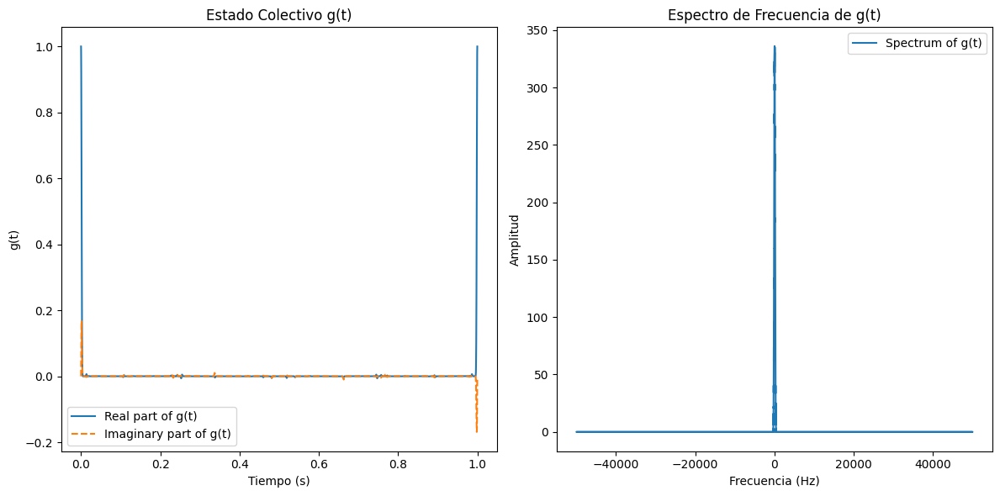

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def deduce_elements_from_spectrum(frequencies, spectrum, f0, element_range, target_sum):
    """Intenta deducir los elementos del conjunto que contribuyen a la suma objetivo."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    deduced_elements = []
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if 0 < freq <= element_range and amp > 1e-5:
            deduced_elements.append(freq)
    if sum(deduced_elements) == target_sum:
        return True, deduced_elements
    return False, []

# Parámetros para la generación del conjunto
num_elements = 17
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 100000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

# Comprobar si se logra la suma objetivo
success = target_sum in possible_sums

# Intentar deducir los elementos
success_deduction, deduced_elements = deduce_elements_from_spectrum(frequencies, spectrum, f0, element_range, target_sum)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Sumas Posibles Interpretadas:", possible_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", success)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))
print("Intento de Deducción: Éxito: {}, Elementos Deducidos: {}".format(success_deduction, deduced_elements))

# Visualización
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()


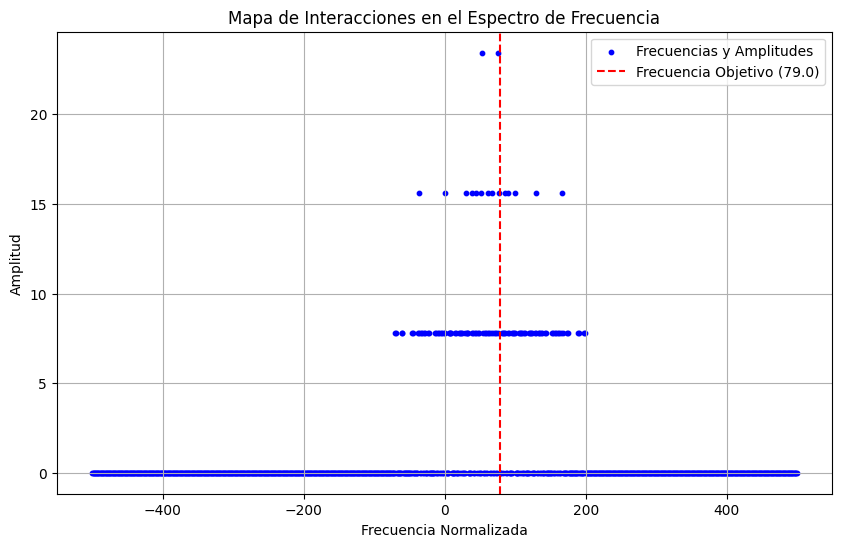

Conjunto Aleatorio Generado: [-98  97  71 -48   7  72 -30]
Sumas Posibles Interpretadas: {0: 23.437499999999876, 1: 7.812499999999825, 4: 7.812499999999986, 6: 7.8124999999999, 7: 7.812499999999853, 15: 7.8124999999998685, 19: 7.812499999999969, 22: 15.62499999999999, 23: 15.624999999999773, 24: 7.812499999999853, 26: 7.812499999999903, 29: 7.812500000000005, 30: 15.62499999999994, 31: 7.812499999999933, 40: 7.81249999999998, 41: 15.624999999999915, 42: 7.812499999999912, 45: 7.812499999999958, 47: 7.812499999999987, 48: 15.624999999999831, 49: 15.624999999999849, 52: 7.812499999999806, 56: 7.812499999999807, 64: 7.812499999999949, 65: 7.8124999999997655, 67: 7.812499999999983, 70: 7.812500000000006, 71: 23.437499999999925, 72: 15.624999999999789, 74: 7.812499999999897, 77: 7.812500000000046, 78: 15.624999999999918, 79: 7.812499999999887, 90: 7.812499999999915, 91: 7.812499999999929, 94: 7.812499999999891, 95: 7.812499999999855, 97: 15.624999999999883, 98: 7.812500000000029, -98: 15.62

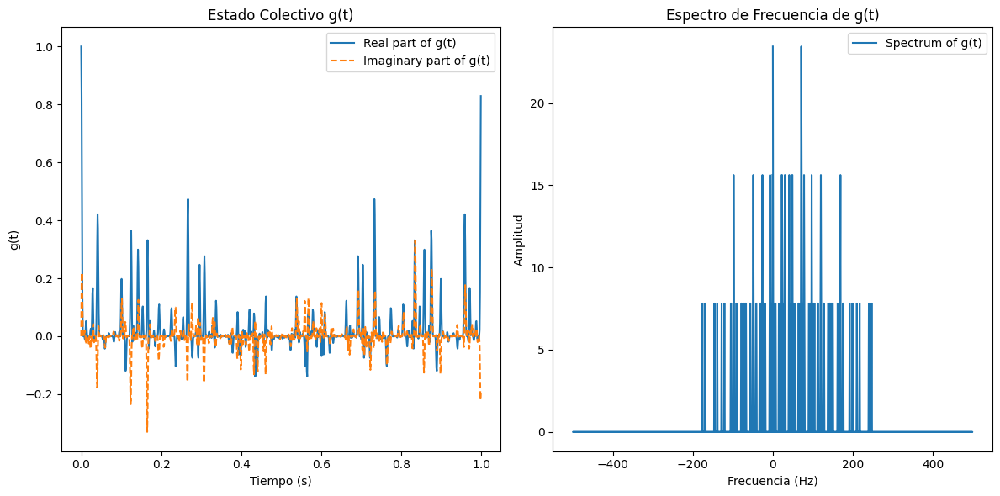

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time


def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def deduce_elements_from_spectrum(frequencies, spectrum, f0, element_range, target_sum):
    """Intenta deducir los elementos del conjunto que contribuyen a la suma objetivo."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    deduced_elements = []
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if 0 < freq <= element_range and amp > 1e-5:
            deduced_elements.append(freq)
    if sum(deduced_elements) == target_sum:
        return True, deduced_elements
    return False, []

def plot_interaction_map(frequencies, amplitudes, target_sum, f0):
    """Dibuja un mapa de interacciones para el espectro de frecuencia."""
    plt.figure(figsize=(10, 6))
    plt.scatter(frequencies, amplitudes, color='blue', s=10, label='Frecuencias y Amplitudes')

    target_freq = target_sum / f0
    plt.axvline(x=target_freq, color='red', linestyle='--', label=f'Frecuencia Objetivo ({target_freq})')

    plt.title('Mapa de Interacciones en el Espectro de Frecuencia')
    plt.xlabel('Frecuencia Normalizada')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.grid(True)
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
amplitudes = np.abs(spectrum)

# Visualización del mapa de interacciones
plot_interaction_map(frequencies / f0, amplitudes, target_sum, f0)

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

# Comprobar si se logra la suma objetivo
success = target_sum in possible_sums

# Intentar deducir los elementos
success_deduction, deduced_elements = deduce_elements_from_spectrum(frequencies, spectrum, f0, element_range, target_sum)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Sumas Posibles Interpretadas:", possible_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", success)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))
print("Intento de Deducción: Éxito: {}, Elementos Deducidos: {}".format(success_deduction, deduced_elements))

# Visualización
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()

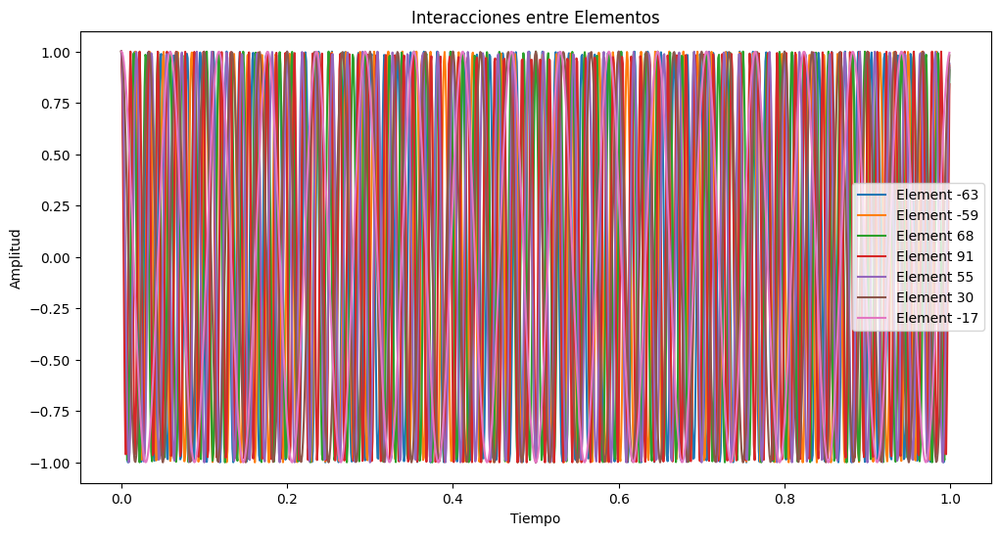

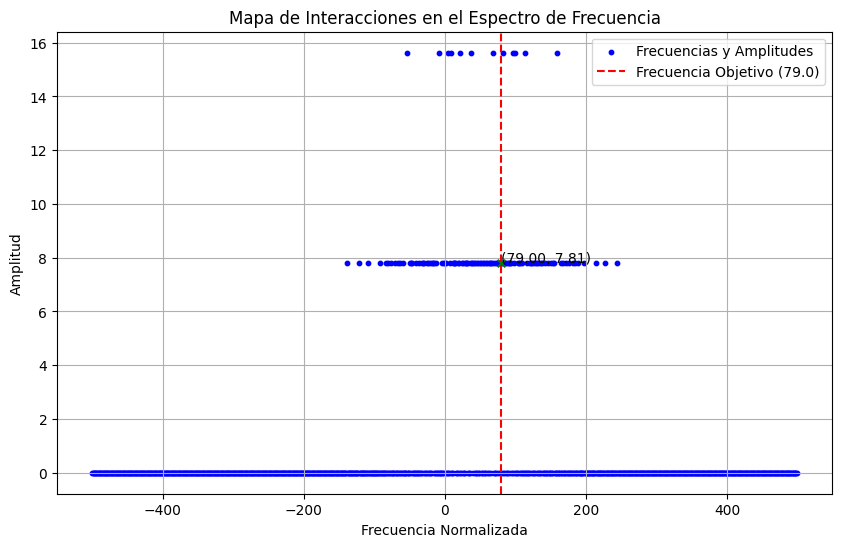

Conjunto Aleatorio Generado: [-63 -59  68  91  55  30 -17]
Sumas Posibles Interpretadas: {0: 7.812500000000069, 1: 7.812499999999936, 5: 15.62500000000007, 7: 7.812499999999924, 9: 15.625000000000028, 11: 7.812500000000033, 13: 7.812500000000016, 14: 7.812499999999943, 15: 7.812499999999975, 18: 7.81250000000003, 20: 7.812500000000006, 22: 15.625000000000039, 24: 7.812499999999976, 26: 7.812500000000048, 28: 7.812500000000027, 30: 7.812500000000038, 31: 7.812499999999941, 32: 7.812499999999969, 35: 7.812500000000002, 37: 15.624999999999963, 38: 7.812500000000035, 39: 7.812499999999933, 41: 7.812500000000087, 43: 7.812500000000069, 45: 7.8125000000000195, 47: 7.812500000000062, 50: 7.812500000000034, 51: 7.812500000000042, 54: 7.812499999999966, 55: 7.812499999999992, 58: 7.812500000000057, 60: 7.812500000000003, 62: 7.812499999999986, 64: 7.812500000000009, 66: 7.812499999999993, 67: 7.812500000000048, 68: 15.624999999999982, 70: 7.812500000000057, 73: 7.812499999999988, 74: 7.81249999

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def plot_interaction_map(frequencies, amplitudes, target_sum, f0):
    target_freq = target_sum / f0
    plt.figure(figsize=(10, 6))
    plt.scatter(frequencies, amplitudes, color='blue', s=10, label='Frecuencias y Amplitudes')

    plt.axvline(x=target_freq, color='red', linestyle='--', label=f'Frecuencia Objetivo ({target_freq})')

    # Identificar puntos cercanos a la línea de frecuencia objetivo
    proximity_threshold = 0.1  # Umbral de proximidad
    close_points = [(freq, amp) for freq, amp in zip(frequencies, amplitudes) if abs(freq - target_freq) < proximity_threshold]
    for point in close_points:
        plt.scatter(*point, color='green', s=30, marker='x')
        plt.text(point[0], point[1], f'({point[0]:.2f}, {point[1]:.2f})')

    plt.title('Mapa de Interacciones en el Espectro de Frecuencia')
    plt.xlabel('Frecuencia Normalizada')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.grid(True)
    plt.show()

    return close_points

def calculate_individual_states(g_set, f0, time_points):
    states = {}
    for element in g_set:
        g_t = np.exp(1j * 2 * np.pi * element * f0 * time_points)
        states[element] = g_t
    return states

def plot_interactions(states, time_points):
    plt.figure(figsize=(12, 6))
    for element, state in states.items():
        plt.plot(time_points, np.real(state), label=f'Element {element}')
    plt.title('Interacciones entre Elementos')
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
amplitudes = np.abs(spectrum)
possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

# Mapa de tiempo y amplitud
individual_states = calculate_individual_states(G_random, f0, time_points)
plot_interactions(individual_states, time_points)

# Visualización del mapa de interacciones y obtención de puntos cercanos
close_points = plot_interaction_map(frequencies / f0, amplitudes, target_sum, f0)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Sumas Posibles Interpretadas:", possible_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", target_sum in possible_sums)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))
print("Puntos Cercanos a la Frecuencia Objetivo:", close_points)


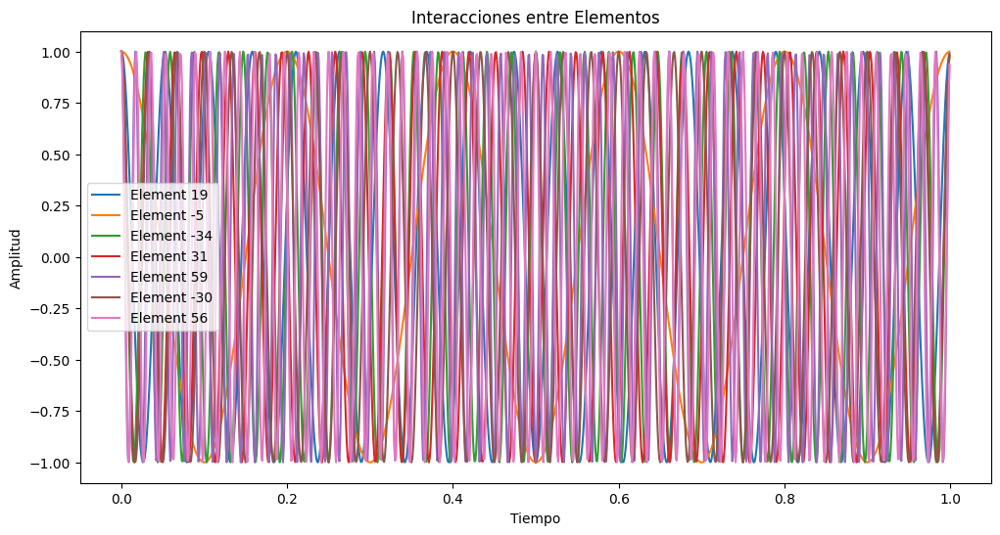

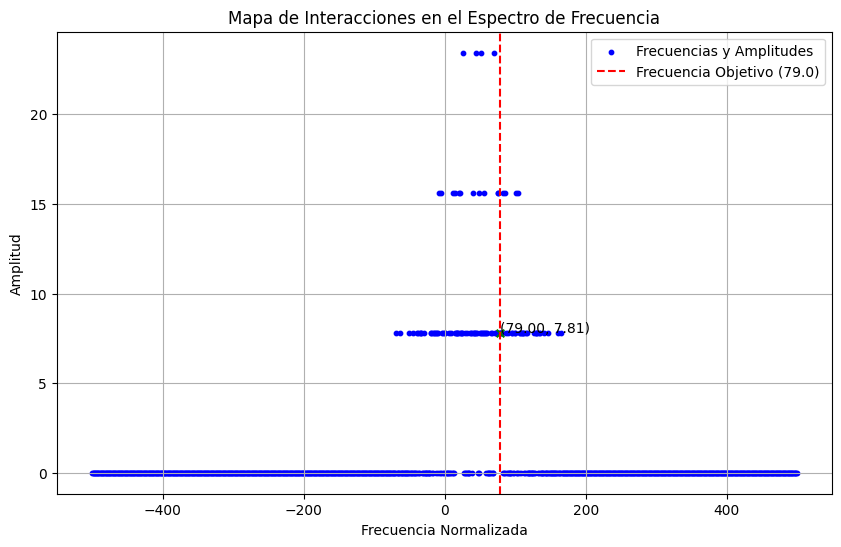

Conjunto Aleatorio Generado: [ 19  -5 -34  31  59 -30  56]
Sumas Posibles Interpretadas: {0: 7.812499999999897, 1: 7.812499999999909, 6: 7.812499999999895, 9: 7.812499999999881, 11: 15.624999999999883, 14: 15.624999999999893, 15: 7.8124999999998845, 16: 7.812499999999925, 17: 7.812499999999963, 18: 7.812499999999906, 19: 7.812499999999915, 20: 15.624999999999934, 21: 15.624999999999972, 22: 7.812499999999972, 23: 7.812499999999947, 24: 7.812499999999908, 25: 7.812499999999933, 26: 23.437499999999964, 29: 7.812499999999931, 31: 7.812499999999907, 36: 7.812499999999867, 37: 7.812499999999918, 39: 7.812499999999904, 40: 15.624999999999867, 41: 7.812499999999927, 42: 7.812499999999924, 43: 7.81249999999981, 44: 7.8124999999999085, 45: 23.437499999999922, 46: 7.81249999999998, 48: 15.62499999999993, 50: 7.8124999999998925, 51: 23.43750000000002, 52: 7.812500000000044, 53: 7.812500000000071, 54: 7.812500000000035, 55: 7.812499999999942, 56: 15.625000000000082, 57: 7.812500000000027, 59: 7.81

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def plot_interaction_map(frequencies, amplitudes, target_sum, f0):
    target_freq = target_sum / f0
    plt.figure(figsize=(10, 6))
    plt.scatter(frequencies, amplitudes, color='blue', s=10, label='Frecuencias y Amplitudes')

    plt.axvline(x=target_freq, color='red', linestyle='--', label=f'Frecuencia Objetivo ({target_freq})')

    close_points = [(freq, amp) for freq, amp in zip(frequencies, amplitudes) if abs(freq - target_freq) < 0.1]
    for point in close_points:
        plt.scatter(*point, color='green', s=30, marker='x')
        plt.text(point[0], point[1], f'({point[0]:.2f}, {point[1]:.2f})')

    plt.title('Mapa de Interacciones en el Espectro de Frecuencia')
    plt.xlabel('Frecuencia Normalizada')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.grid(True)
    plt.show()

    return close_points

def calculate_individual_states(g_set, f0, time_points):
    states = {}
    for element in g_set:
        g_t = np.exp(1j * 2 * np.pi * element * f0 * time_points)
        states[element] = g_t
    return states

def plot_interactions(states, time_points):
    plt.figure(figsize=(12, 6))
    for element, state in states.items():
        plt.plot(time_points, np.real(state), label=f'Element {element}')
    plt.title('Interacciones entre Elementos')
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
amplitudes = np.abs(spectrum)
possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

# Mapa de tiempo y amplitud
individual_states = calculate_individual_states(G_random, f0, time_points)
plot_interactions(individual_states, time_points)

# Visualización del mapa de interacciones y obtención de puntos cercanos
close_points = plot_interaction_map(frequencies / f0, amplitudes, target_sum, f0)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Sumas Posibles Interpretadas:", possible_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", target_sum in possible_sums)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))
print("Puntos Cercanos a la Frecuencia Objetivo:", close_points)


Conjunto Aleatorio Generado: [ 79 -36 -56 -91 -24 -71 -97]
Sumas Posibles Interpretadas: {0: 7.812499999999832, 8: 7.812499999999918, 19: 7.812499999999985, 23: 7.812499999999947, 43: 7.812499999999902, 55: 7.812499999999936, 79: 7.812499999999942, -98: 7.812499999999957, -97: 7.8124999999999165, -95: 7.812499999999842, -92: 15.625000000000012, -91: 7.812499999999845, -89: 7.812499999999906, -84: 7.8125, -83: 7.812499999999909, -80: 7.812500000000033, -78: 7.812499999999833, -74: 7.812500000000039, -72: 15.624999999999908, -71: 7.812499999999874, -68: 7.812499999999895, -60: 7.812499999999924, -56: 7.812499999999889, -54: 7.81249999999993, -52: 7.812499999999931, -48: 15.624999999999911, -42: 7.812499999999865, -37: 7.812500000000096, -36: 15.624999999999819, -28: 7.812499999999873, -24: 7.812499999999903, -18: 7.812499999999959, -16: 7.812499999999889, -13: 7.812500000000016, -12: 7.812499999999812, -1: 7.8124999999999485}
¿Se logró la suma objetivo? (Análisis de Espectro) True
Fuerza

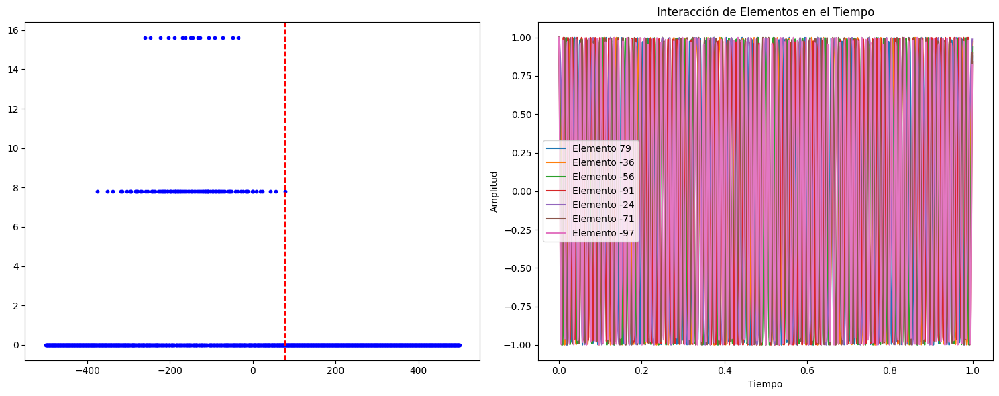

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def plot_interaction_map(frequencies, amplitudes, target_sum, f0, g_set, time_points):
    target_freq = target_sum / f0
    plt.figure(figsize=(15, 6))

    # Plot de frecuencias y amplitudes
    plt.subplot(1, 2, 1)
    plt.scatter(frequencies, amplitudes, color='blue', s=10, label='Frecuencias y Amplitudes')
    plt.axvline(x=target_freq, color='red', linestyle='--', label=f'Frecuencia Objetivo ({target_freq})')

    # Plot de tiempo y amplitud para los elementos del conjunto
    plt.subplot(1, 2, 2)
    for element in g_set:
        signal = np.exp(1j * 2 * np.pi * element * f0 * time_points)
        plt.plot(time_points, np.real(signal), label=f'Elemento {element}')

    plt.title('Interacción de Elementos en el Tiempo')
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
amplitudes = np.abs(spectrum)
possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Sumas Posibles Interpretadas:", possible_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", target_sum in possible_sums)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))

# Visualización del mapa de interacciones
plot_interaction_map(frequencies / f0, amplitudes, target_sum, f0, G_random, time_points)


Conjunto Aleatorio Generado: [35 81 82  3 62 46 33]
¿Se logró la suma objetivo? (Análisis de Espectro) True
Fuerza Bruta: Tiempo: 0.0001 segundos, Éxito: True


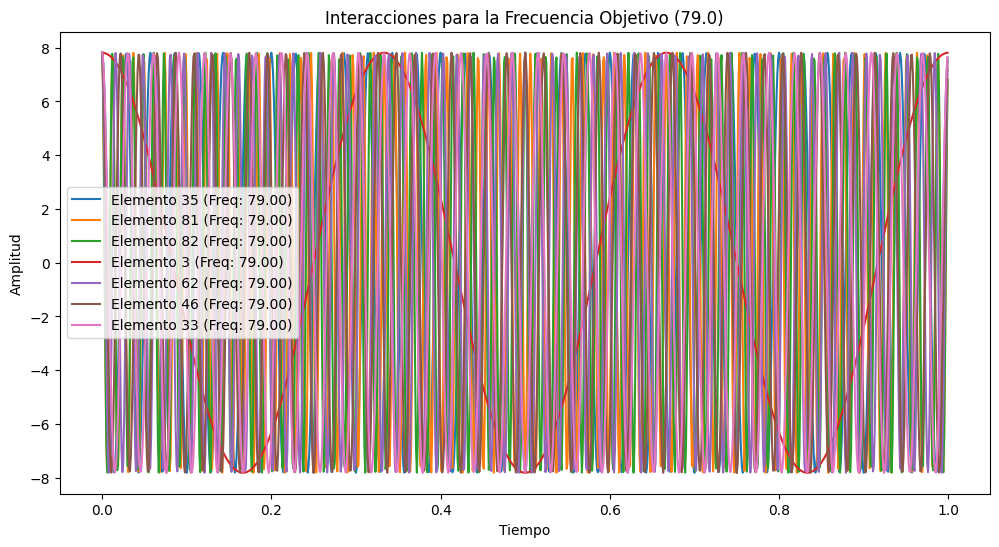

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def plot_target_interaction(frequencies, amplitudes, time_points, g_set, f0, target_sum):
    target_freq = target_sum / f0
    plt.figure(figsize=(12, 6))

    # Filtrar solo las frecuencias y amplitudes relevantes
    relevant_amplitudes = amplitudes[(frequencies / f0 == target_freq)]
    relevant_frequencies = frequencies[(frequencies / f0 == target_freq)]

    for freq, amp in zip(relevant_frequencies, relevant_amplitudes):
        for element in g_set:
            signal = np.exp(1j * 2 * np.pi * element * f0 * time_points) * amp
            plt.plot(time_points, np.real(signal), label=f'Elemento {element} (Freq: {freq:.2f})')

    plt.title(f'Interacciones para la Frecuencia Objetivo ({target_freq})')
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
amplitudes = np.abs(spectrum)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", target_sum in interpret_spectrum(frequencies, spectrum, element_range, f0))
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))

# Visualización del mapa de interacciones para la frecuencia objetivo
plot_target_interaction(frequencies, amplitudes, time_points, G_random, f0, target_sum)


Conjunto Aleatorio Generado: [67 72 59 16 31 41 69]
¿Se logró la suma objetivo? (Análisis de Espectro) True
Fuerza Bruta: Tiempo: 0.0001 segundos, Éxito: True


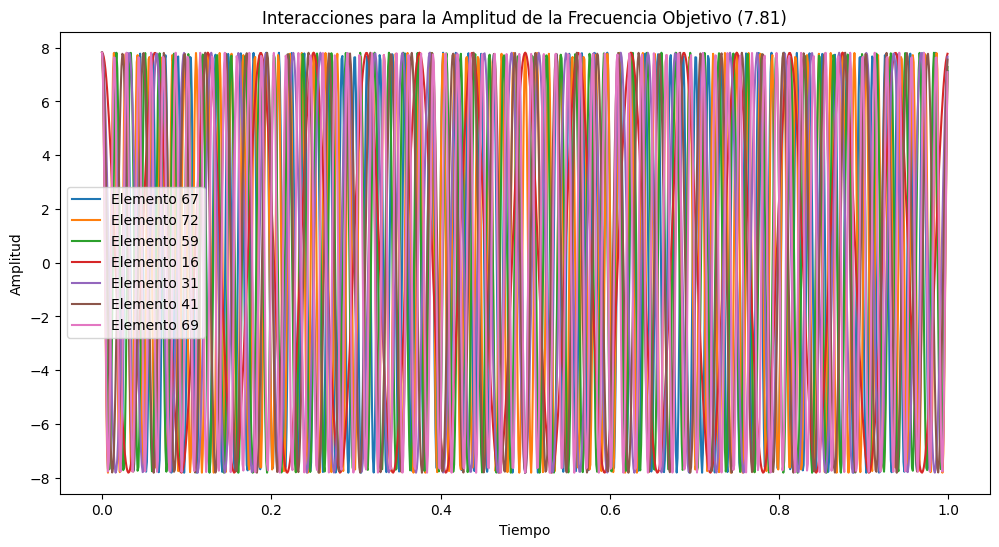

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def plot_target_amplitude_interaction(frequencies, amplitudes, time_points, g_set, f0, target_sum):
    target_freq = target_sum / f0
    target_amplitude = np.max(amplitudes[(frequencies / f0 == target_freq)])

    plt.figure(figsize=(12, 6))

    for element in g_set:
        signal = np.exp(1j * 2 * np.pi * element * f0 * time_points) * target_amplitude
        plt.plot(time_points, np.real(signal), label=f'Elemento {element}')

    plt.title(f'Interacciones para la Amplitud de la Frecuencia Objetivo ({target_amplitude:.2f})')
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 69

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)
amplitudes = np.abs(spectrum)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", target_sum in interpret_spectrum(frequencies, spectrum, element_range, f0))
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))

# Visualización de la interacción para la amplitud de la frecuencia objetivo
plot_target_amplitude_interaction(frequencies, amplitudes, time_points, G_random, f0, target_sum)


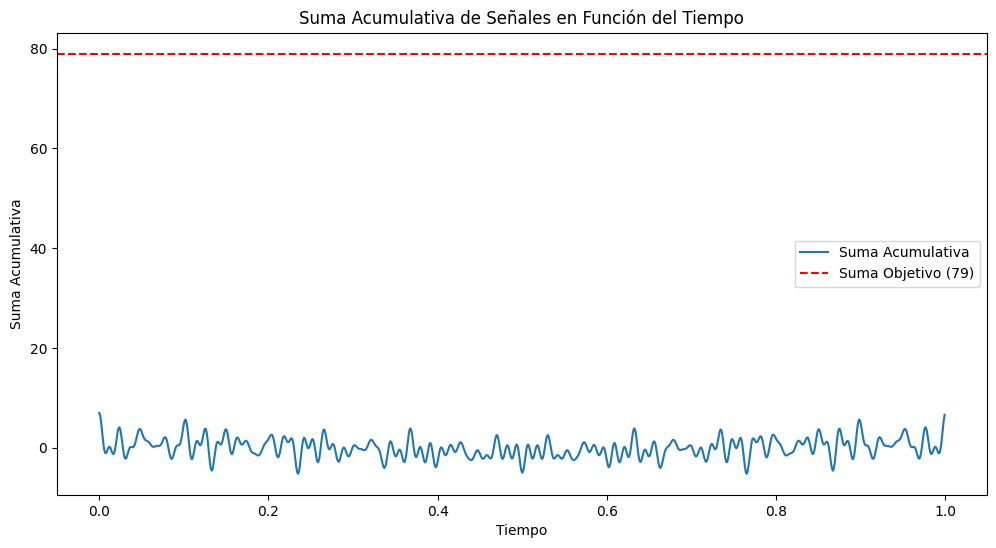

Conjunto Aleatorio Generado: [-79 -49   1 -19  87  41  40]
Fuerza Bruta: Tiempo: 0.0001 segundos, Éxito: True


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def plot_cumulative_signal(time_points, g_set, f0, target_sum):
    cumulative_signal = np.zeros_like(time_points, dtype=np.complex128)
    for element in g_set:
        cumulative_signal += np.exp(1j * 2 * np.pi * element * f0 * time_points)

    plt.figure(figsize=(12, 6))
    plt.plot(time_points, np.real(cumulative_signal), label='Suma Acumulativa')
    plt.axhline(y=target_sum, color='red', linestyle='--', label=f'Suma Objetivo ({target_sum})')
    plt.title('Suma Acumulativa de Señales en Función del Tiempo')
    plt.xlabel('Tiempo')
    plt.ylabel('Suma Acumulativa')
    plt.legend()
    plt.show()

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)

# Visualización de la suma acumulativa de las señales
plot_cumulative_signal(time_points, G_random, f0, target_sum)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute, subset_brute = brute_force_sum_subset(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}" .format(time_brute, success_brute))


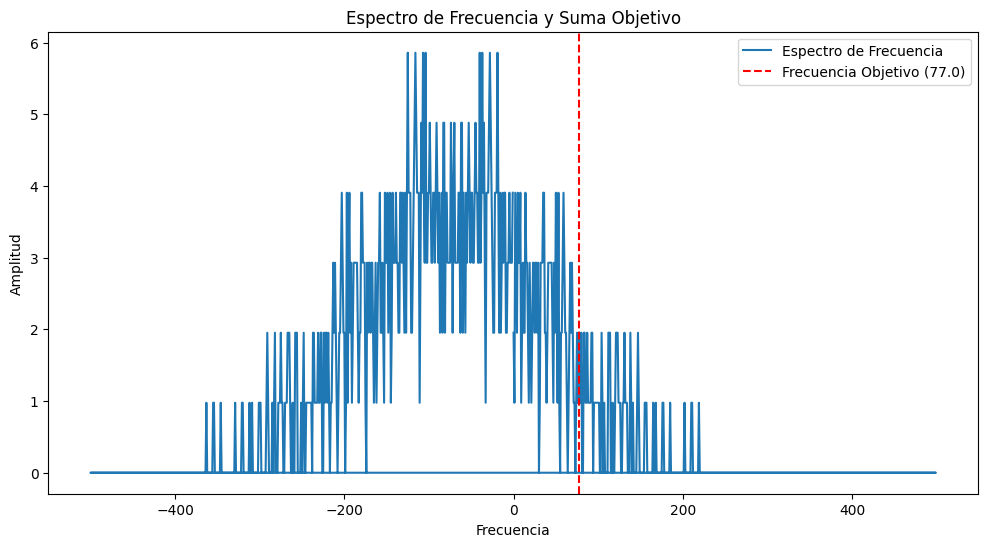

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def plot_spectrum_and_target_sum(frequencies, spectrum, f0, target_sum):
    target_frequency = target_sum / f0
    plt.figure(figsize=(12, 6))
    plt.plot(frequencies, np.abs(spectrum), label='Espectro de Frecuencia')
    plt.axvline(x=target_frequency, color='red', linestyle='--', label=f'Frecuencia Objetivo ({target_frequency})')
    plt.xlabel('Frecuencia')
    plt.ylabel('Amplitud')
    plt.title('Espectro de Frecuencia y Suma Objetivo')
    plt.legend()
    plt.show()

# Parámetros del experimento
num_elements = 10
element_range = 100
f0 = 1.0
target_sum = 77
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar conjunto aleatorio y calcular estado colectivo
G_random = generate_random_set(num_elements, element_range)
g_t = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Visualizar el espectro y la suma objetivo
plot_spectrum_and_target_sum(frequencies, spectrum, f0, target_sum)



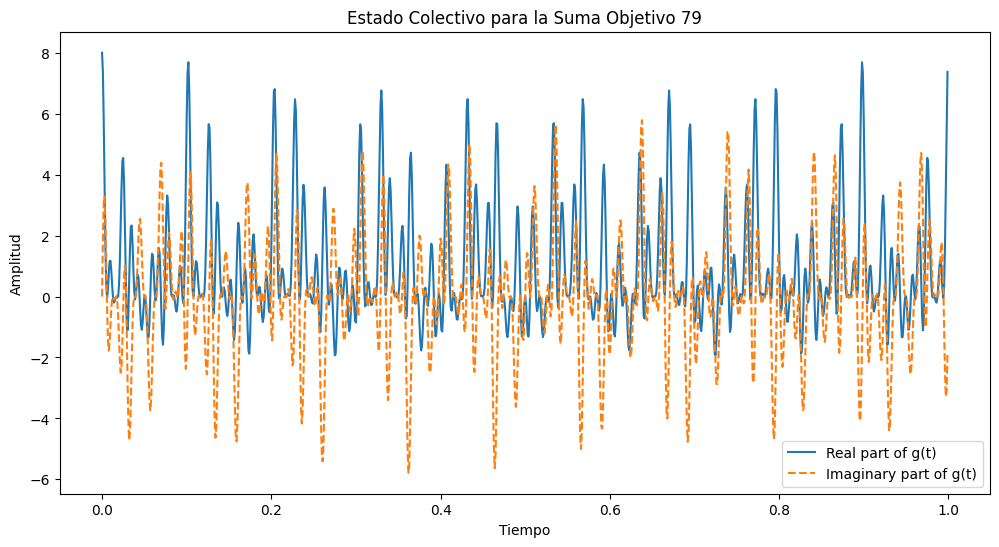

Se alcanzó la suma objetivo: 79 con los elementos (88, 30, -39)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_unique_random_set(num_elements, element_range):
    return np.random.choice(range(-element_range, element_range), num_elements, replace=False)

def calculate_collective_state(subset, f0, time_points):
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for element in subset:
        g_t *= (1 + np.exp(1j * 2 * np.pi * element * f0 * time_points))
    return g_t

def find_combinations_that_sum_to_target(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

def plot_collective_state_for_target_sum(subset, f0, time_points):
    g_t = calculate_collective_state(subset, f0, time_points)
    plt.figure(figsize=(12, 6))
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title(f'Estado Colectivo para la Suma Objetivo {sum(subset)}')
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79
time_points = np.linspace(0, 1, 1000, endpoint=False)

G_random = generate_unique_random_set(num_elements, element_range)
contributing_subset = find_combinations_that_sum_to_target(G_random, target_sum)

if contributing_subset:
    plot_collective_state_for_target_sum(contributing_subset, f0, time_points)
    print(f"Se alcanzó la suma objetivo: {target_sum} con los elementos {contributing_subset}")
else:
    print(f"No se pudo alcanzar la suma objetivo: {target_sum} con los elementos dados")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_state(g_set, f0, time_points):
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-len(g_set))
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, np.abs(spectrum)

def analyze_contributions(g_set, f0, time_points, target_sum):
    full_spectrum = frequency_spectrum(calculate_state(g_set, f0, time_points), time_points)[1]
    contributions = {}

    for i, element in enumerate(g_set):
        modified_set = np.delete(g_set, i)
        modified_spectrum = frequency_spectrum(calculate_state(modified_set, f0, time_points), time_points)[1]
        contribution = full_spectrum - modified_spectrum
        contributions[element] = np.sum(contribution)

    # Identificar combinaciones que contribuyen a la suma objetivo
    contributing_elements = [element for element, contribution in contributions.items() if contribution > 0]

    return contributing_elements

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)

# Analizar contribuciones de cada elemento
contributing_elements = analyze_contributions(G_random, f0, time_points, target_sum)

# Imprimir resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Elementos Contribuyentes a la Suma Objetivo:", contributing_elements)



Conjunto Aleatorio Generado: [ 89  39  47 -90 -38  43  14]
Elementos Contribuyentes a la Suma Objetivo: [89]


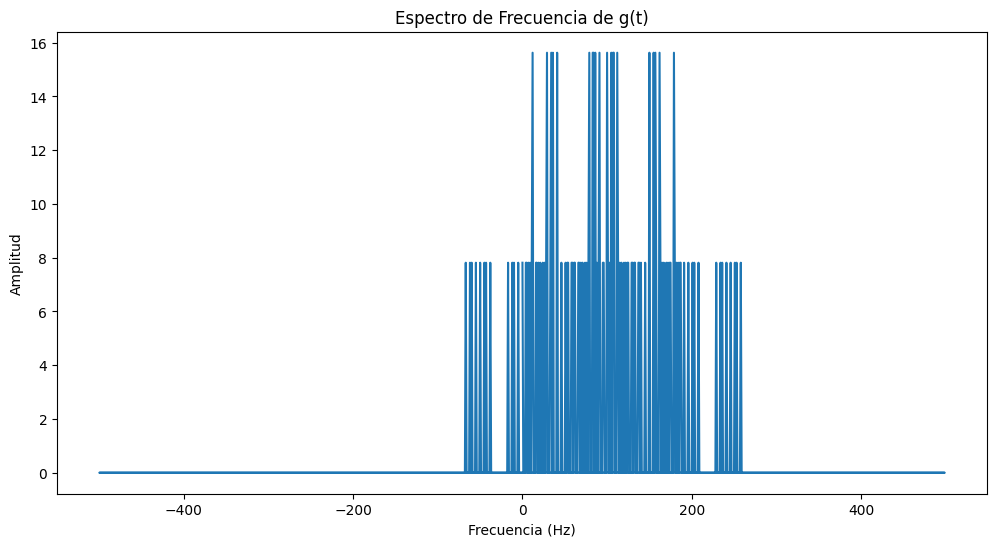

Conjunto Aleatorio Generado: [-17 -50   7   5  71  96  79]
Combinaciones que contribuyen a la suma objetivo: [(79,), (-17, 96)]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations, product
import time

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_individual_states(g_set, f0, time_points):
    individual_states = []
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        state = np.exp(1j * w_j * time_points)
        individual_states.append(state)
    return individual_states

def calculate_collective_state(individual_states):
    n = len(individual_states)
    g_t = np.ones_like(individual_states[0], dtype=np.complex128)
    for state in individual_states:
        g_t *= (1 + state)
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def find_combinations_that_sum_to_target(g_set, target_sum):
    contributing_combinations = []
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                contributing_combinations.append(combo)
    return contributing_combinations

# Parámetros para la generación del conjunto
num_elements = 7
element_range = 100
f0 = 1.0
target_sum = 79
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)

# Calcular estados individuales y colectivo
individual_states = calculate_individual_states(G_random, f0, time_points)
g_t = calculate_collective_state(individual_states)

# Calcular espectro de frecuencia del estado colectivo
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Encontrar todas las combinaciones que suman al objetivo
contributing_combinations = find_combinations_that_sum_to_target(G_random, target_sum)

# Visualización del espectro de frecuencia
plt.figure(figsize=(12, 6))
plt.plot(frequencies, np.abs(spectrum))
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.show()

# Imprimir resultados
print("Conjunto Aleatorio Generado:", G_random)
print("Combinaciones que contribuyen a la suma objetivo:", contributing_combinations)


In [ ]:
import cupy as cp
import numpy as np
import time
from itertools import combinations

def generate_random_set_gpu(num_elements, element_range, gpu_id):
    with cp.cuda.Device(gpu_id):
        return cp.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set_gpu(g_set, f0, time_points, gpu_id):
    with cp.cuda.Device(gpu_id):
        n = len(g_set)
        g_t = cp.ones_like(time_points, dtype=cp.complex128)
        for a_j in g_set:
            w_j = 2 * cp.pi * a_j * f0
            g_t *= (1 + cp.exp(1j * w_j * time_points))
        g_t *= 2**(-n)
        return g_t

def frequency_spectrum_gpu(g_t, time_points, gpu_id):
    with cp.cuda.Device(gpu_id):
        spectrum = cp.fft.fft(g_t)
        frequencies = cp.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
        return frequencies, spectrum

def interpret_spectrum_gpu(frequencies, spectrum, element_range, f0, gpu_id):
    with cp.cuda.Device(gpu_id):
        normalized_frequencies = cp.round(frequencies / f0).astype(int)
        possible_sums = {}
        for freq, amp in zip(normalized_frequencies, cp.abs(spectrum)):
            if -element_range <= freq <= element_range:
                possible_sums[int(freq)] = amp
        return possible_sums

def analyze_subset_sum_gpu(g_set, f0, element_range, target_sum, time_points, gpu_id):
    with cp.cuda.Device(gpu_id):
        g_t = calculate_collective_state_random_set_gpu(g_set, f0, time_points, gpu_id)
        frequencies, spectrum = frequency_spectrum_gpu(g_t, time_points, gpu_id)
        possible_sums = interpret_spectrum_gpu(frequencies, spectrum, element_range, f0, gpu_id)
        return target_sum in possible_sums.keys()

# Parámetros para la generación del conjunto
num_elements = 1000
element_range = 100
f0 = 1.0
target_sum = 2032
time_points = cp.linspace(0, 1, 1000, endpoint=False)

# Asumiendo que se tienen múltiples GPUs disponibles
num_gpus = 1  # Ajustar según el número de GPUs disponibles
results = []

for i in range(num_gpus):
    gpu_id = i
    g_set_gpu = generate_random_set_gpu(num_elements // num_gpus, element_range, gpu_id)
    start_time = time.time()
    result = analyze_subset_sum_gpu(g_set_gpu, f0, element_range, target_sum, time_points, gpu_id)
    end_time = time.time()
    results.append((result, end_time - start_time))

# Mostrar resultados
for i, (result, elapsed_time) in enumerate(results):
    print(f"Resultado en GPU {i}: {result}, Tiempo de ejecución: {elapsed_time} segundos")



Resultado en GPU 0: False, Tiempo de ejecución: 0.26091766357421875 segundos


In [ ]:
!pip install cupy-cuda101  # Usa la versión de cupy que coincida con tu versión de CUDA



ERROR: Could not find a version that satisfies the requirement cupy-cuda101 (from versions: none)
ERROR: No matching distribution found for cupy-cuda101


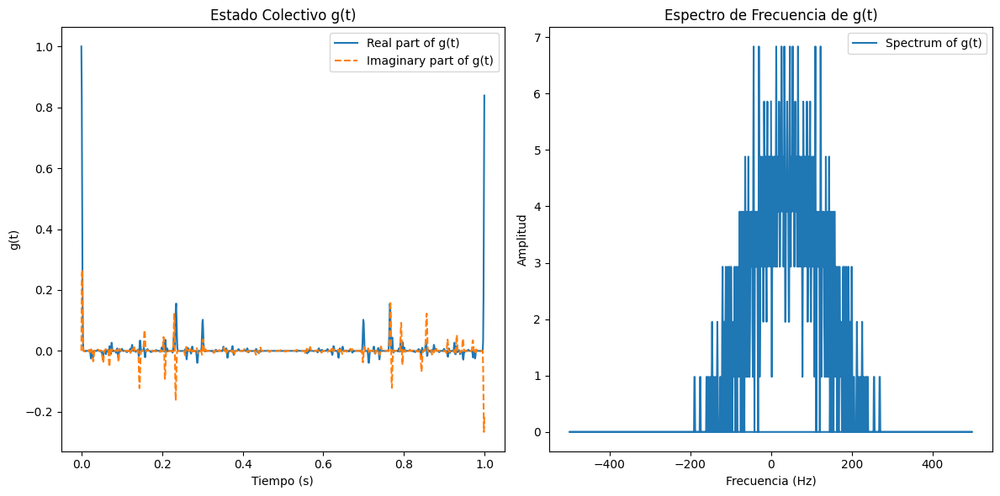

Conjunto Aleatorio Generado: [  1 -34 -30  97  39 -43  77 -14  56 -69]
Sumas Posibles Interpretadas: {0: 5.859374999999961, 1: 2.929687499999959, 2: 0.9765624999999423, 3: 2.9296874999999325, 4: 4.882812499999941, 5: 3.906249999999958, 6: 2.9296874999999654, 7: 3.906249999999969, 8: 4.882812499999984, 9: 4.882812499999954, 10: 3.9062499999999307, 11: 2.929687499999943, 12: 4.88281249999994, 13: 6.835937499999932, 14: 4.882812499999947, 15: 2.929687499999962, 16: 3.9062499999999485, 17: 4.882812499999932, 18: 3.9062499999999463, 19: 3.9062499999999734, 20: 5.859374999999986, 21: 4.882812499999986, 22: 2.929687499999967, 23: 3.9062499999999325, 24: 3.9062499999999343, 25: 4.882812499999955, 26: 6.8359374999999645, 27: 5.859374999999973, 28: 3.906249999999984, 29: 4.882812499999988, 30: 4.8828124999999645, 31: 2.9296874999999405, 32: 3.9062499999999476, 33: 6.835937499999977, 34: 5.859374999999995, 35: 1.9531249999999722, 36: 1.953124999999937, 37: 3.9062499999999307, 38: 3.90624999999994

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 10000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

def brute_force_subset_sum(g_set, target_sum):
    """Encuentra subconjuntos que sumen el objetivo usando fuerza bruta."""
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return True, subset
    return False, None

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
f0 = 1.0
target_sum = 93

# Generar un conjunto aleatorio y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Imprimir resultados del análisis de espectro
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("¿Se logró la suma objetivo? (Análisis de Espectro)", success)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute, subset_brute = brute_force_subset_sum(generated_set, target_sum)
time_brute = time.time() - start_time

print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}, Subconjunto: {}".format(time_brute, success_brute, subset_brute))


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    start_time = time.time()  # Iniciar el cronómetro para el análisis del espectro

    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    end_time = time.time()  # Detener el cronómetro
    analysis_time = end_time - start_time  # Calcular el tiempo transcurrido

    success = target_sum in possible_sums

    return possible_sums, success, analysis_time

def brute_force_subset_sum(g_set, target_sum):
    """Encuentra subconjuntos que sumen el objetivo usando fuerza bruta."""
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return True, subset
    return False, None

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
f0 = 1.0
target_sum = 93

# Generar un conjunto aleatorio y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
interpreted_sums, success_spectrum, time_spectrum = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Ejecutar el método de fuerza bruta
start_time = time.time()
success_brute, subset_brute = brute_force_subset_sum(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir los resultados y los tiempos
print("Análisis del Espectro: Tiempo = {:.4f} segundos, Éxito = {}".format(time_spectrum, success_spectrum))
print("Fuerza Bruta: Tiempo = {:.4f} segundos, Éxito = {}, Subconjunto = {}".format(time_brute, success_brute, subset_brute))


Análisis del Espectro: Tiempo = 0.0018 segundos, Éxito = True
Fuerza Bruta: Tiempo = 0.0003 segundos, Éxito = True, Subconjunto = (91, 9, -7)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    frequency_amplitudes = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
                frequency_amplitudes[freq] = amp
    return possible_sums, frequency_amplitudes

def track_contributing_elements(frequency_amplitudes, target_sum, f0):
    """Rastrea los elementos que contribuyen a la suma objetivo."""
    contributing_elements = []
    for freq, amp in frequency_amplitudes.items():
        if round(freq * f0) == target_sum:
            contributing_elements.append((freq, amp))
    return contributing_elements

def inverse_fourier_to_identify_elements(spectrum, g_set, f0, time_points, target_sum):
    """Intenta identificar los elementos del conjunto usando la Transformada de Fourier Inversa."""
    reconstructed_signal = np.fft.ifft(spectrum)
    identified_elements = []

    # Buscar frecuencias en el espectro que coincidan con la suma objetivo
    target_frequency = target_sum * f0
    for i, freq in enumerate(np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])):
        if np.isclose(freq, target_frequency, atol=f0/2) and np.abs(spectrum[i]) > np.max(np.abs(spectrum)) * 0.5:
            phase = np.angle(spectrum[i])
            for element in g_set:
                element_frequency = element * f0
                expected_phase = 2 * np.pi * element_frequency * time_points[np.argmax(np.abs(reconstructed_signal))]
                if np.isclose(phase, expected_phase, atol=0.1):
                    identified_elements.append(element)

    return identified_elements

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums, frequency_amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0)

    contributing_elements = track_contributing_elements(frequency_amplitudes, target_sum, f0)
    identified_elements = inverse_fourier_to_identify_elements(spectrum, G_random, f0, time_points, target_sum)
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')


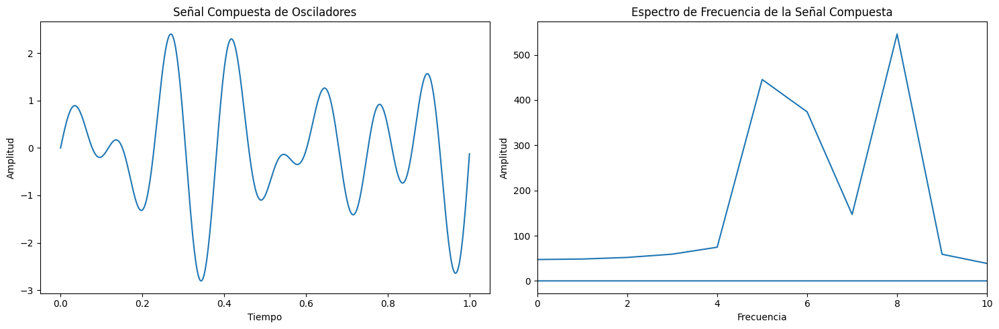

Conjunto Aleatorio Generado: [-71  70 -65  51   0  80]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_oscillator_signal(value, f0, time_points):
    """Genera la señal de un oscilador basado en el valor."""
    frequency = value * f0
    return np.sin(2 * np.pi * frequency * time_points)

def analyze_sum_in_signals(g_set, f0, time_points):
    """Analiza la suma de las señales de los osciladores."""
    composite_signal = np.zeros_like(time_points)
    for value in g_set:
        composite_signal += generate_oscillator_signal(value, f0, time_points)

    spectrum = np.fft.fft(composite_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])

    return frequencies, spectrum, composite_signal

# Parámetros
num_elements = 6
element_range = 100
f0 = 0.1  # Frecuencia base para los osciladores
target_sum = 67
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio de elementos y analizar la suma
G_random = generate_random_set(num_elements, element_range)
frequencies, spectrum, composite_signal = analyze_sum_in_signals(G_random, f0, time_points)

# Visualización
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(time_points, composite_signal)
plt.title("Señal Compuesta de Osciladores")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum))
plt.title("Espectro de Frecuencia de la Señal Compuesta")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)  # Limitar el rango de frecuencia para visualizar

plt.tight_layout()
plt.show()

print("Conjunto Aleatorio Generado:", G_random)


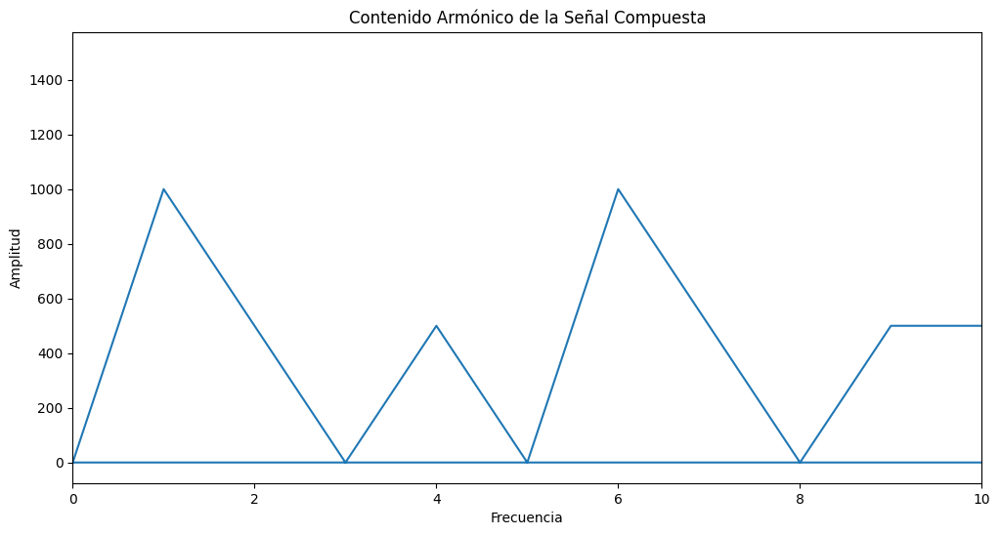

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_oscillator_signal(value, f0, time_points):
    frequency = value * f0
    return np.sin(2 * np.pi * frequency * time_points)

def analyze_harmonic_content(g_set, f0, time_points):
    composite_signal = np.zeros_like(time_points)
    for value in g_set:
        composite_signal += generate_oscillator_signal(value, f0, time_points)

    spectrum = np.fft.fft(composite_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    amplitudes = np.abs(spectrum)
    return frequencies, amplitudes

# Generar un conjunto aleatorio y analizar la señal
num_elements = 100
element_range = 100
f0 = 1.0
time_points = np.linspace(0, 1, 1000, endpoint=False)
G_random = np.random.randint(-element_range, element_range, num_elements)

frequencies, amplitudes = analyze_harmonic_content(G_random, f0, time_points)

# Visualización
plt.figure(figsize=(12, 6))
plt.plot(frequencies, amplitudes)
plt.title("Contenido Armónico de la Señal Compuesta")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)
plt.show()



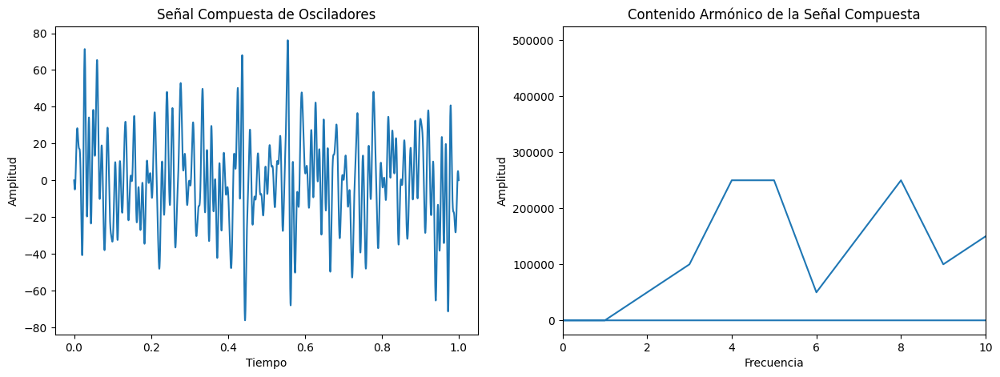

Conjunto Aleatorio Generado: [  19   85   22   40    2    7  -80   -9   -6   70   97  -83  -16  -68
   46  -67  -30   52  -13    7    8   80   55  -60  -80   44   85  -43
   68  -91  -73  -88  -13  -54   87  -60    8   16  -25   85  -92   66
  -71  -41  -73  -58   31    8   48   33   44    5   49   10   61   44
   51 -100   77  -48  -15  -33   26  -92   70  -20   59   83  -11  -54
   21  -64  -19   34  -90   74  -63   58   91  -12   54   67   93  -14
  -59  -77  -51  -47  -71   16  -96  -23  -84   47   88    1  -32   55
    0  -68   20  -97   24   26  -72  -52   79   35   72  -50   42   82
   33  -99   68   92   67  -25   30  -93   78  -13   76   75  -61   -2
   86  -41   88   36   22  -23  -66    0   51   24    1  -21  -16  -49
   86   98   56  -24  -76   16  -23   71   90  -94  -62   37  -66   48
   19   83   59  -77   49   76  -12  -27   48   73   88   99   40   85
    7   52  -18  -56  -45  -98   29  -66  -52   77  -62 -100   90   15
  -50  -96  -46  -74 -100   51  -86  -11  -74   

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_oscillator_signal(value, f0, time_points):
    """Genera la señal de un oscilador basado en el valor."""
    frequency = value * f0
    return np.sin(2 * np.pi * frequency * time_points)

def analyze_harmonic_content(g_set, f0, time_points):
    """Analiza el contenido armónico de la señal compuesta."""
    composite_signal = np.zeros_like(time_points)
    for value in g_set:
        composite_signal += generate_oscillator_signal(value, f0, time_points)

    spectrum = np.fft.fft(composite_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    amplitudes = np.abs(spectrum)
    return frequencies, amplitudes, composite_signal

def check_sum_target(frequencies, f0, target_sum):
    """Verifica si la suma objetivo está en las frecuencias identificadas."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    return target_sum in normalized_frequencies

# Parámetros
num_elements = 1000
element_range = 100
f0 = 1.0  # Frecuencia base para los osciladores
target_sum = 20023
time_points = np.linspace(0, 1, 100000, endpoint=False)

# Generar un conjunto aleatorio de elementos y analizar la suma
G_random = np.random.randint(-element_range, element_range, num_elements)
frequencies, amplitudes, composite_signal = analyze_harmonic_content(G_random, f0, time_points)

# Verificar si la suma objetivo se encuentra en las frecuencias
success = check_sum_target(frequencies, f0, target_sum)

# Visualización
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(time_points, composite_signal)
plt.title("Señal Compuesta de Osciladores")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(frequencies, amplitudes)
plt.title("Contenido Armónico de la Señal Compuesta")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)
plt.show()

print("Conjunto Aleatorio Generado:", G_random)
print("¿Se logró la suma objetivo?", success)


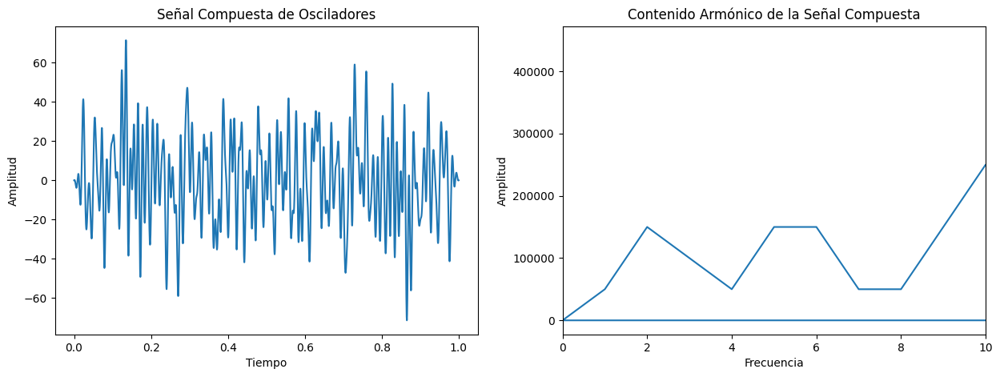

Conjunto Aleatorio Generado: [  42   -8   13  -43   51    6  -86   84   24   81  -16   86   15    8
   18  -84   34   55  -43   73  -50  -99  -16  -33  -77   64    8  -63
  -16   72  -87  -30  -13  -62   48   45   55   38  -83   44   25  -71
  -51   82   37   32  -49   -5  -94  -98   92  -82   -9  -33  -60  -50
  -50   -2   79  -70  -79  -27  -45  -12    2  -76   33   60   40  -79
  -31   90   52   61   -4   35  -43   37   82  -66   17  -30   54   32
   63   24   75   -6   -1   53   23  -25  -13   77  -41  -53  -89   34
   17  -61   -3  -85   94  -17   58  -30   45   50   54   91  -41  -30
  -93   -4   92   79  -89   85   62  -84   14  -83  -82   99   70  -62
   -8  -87   74  -64  -47   62   48   74   72  -98  -68   99  -51   69
  -91  -84  -82  -71  -34    2  -45  -98   99 -100  -17   66  -30  -87
   37   76   83   90   85  -89  -82  -70   23  -27   10   74    1   99
  -92   18  -71   65   73   71   49  -49  -51   40   61   12  -35   67
   89  -28  -48   59  -29   -9  -24   -1   87  -

KeyboardInterrupt: ignored

In [ ]:
from itertools import combinations
import time

def brute_force_subset_sum(g_set, target_sum):
    """Encuentra subconjuntos que sumen al objetivo usando fuerza bruta."""
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return True, subset
    return False, None

# Parámetros
num_elements = 1000
element_range = 100
f0 = 1.0  # Frecuencia base para los osciladores
target_sum = 20023
time_points = np.linspace(0, 1, 100000, endpoint=False)

# Generar un conjunto aleatorio de elementos y analizar la suma
G_random = np.random.randint(-element_range, element_range, num_elements)
frequencies, amplitudes, composite_signal = analyze_harmonic_content(G_random, f0, time_points)

# Verificar si la suma objetivo se encuentra en las frecuencias
success = check_sum_target(frequencies, f0, target_sum)

# Visualización
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(time_points, composite_signal)
plt.title("Señal Compuesta de Osciladores")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(frequencies, amplitudes)
plt.title("Contenido Armónico de la Señal Compuesta")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)
plt.show()

# Imprimir resultados del análisis armónico
print("Conjunto Aleatorio Generado:", G_random)
print("¿Se logró la suma objetivo? (Análisis Armónico)", success)

# Ejecutar y comparar con el método de fuerza bruta
start_time = time.time()
success_brute, subset_brute = brute_force_subset_sum(G_random, target_sum)
time_brute = time.time() - start_time

# Imprimir resultados del método de fuerza bruta
print("Fuerza Bruta: Tiempo: {:.4f} segundos, Éxito: {}, Subconjunto: {}".format(time_brute, success_brute, subset_brute))



/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 1
  warnings.warn(


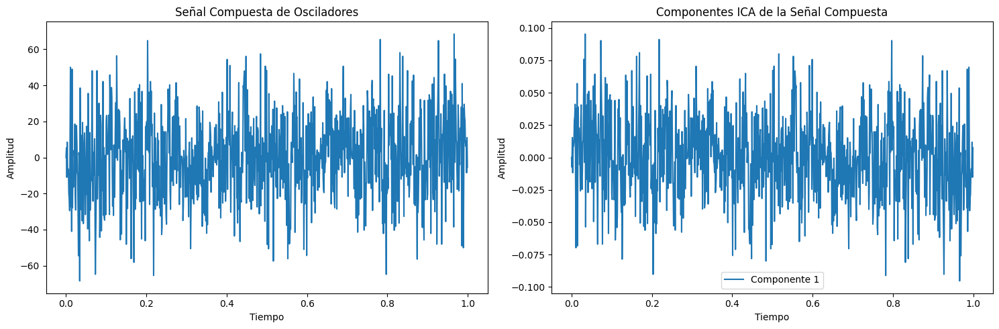

Conjunto Aleatorio Generado: [ 656 -160 -468  697 -670   82 -391 -421  662   25 -588 -192  797 -846
  628 -559  -15 -799 -588 -180 -735 -851  577  -69  -14 -799  435 -667
 -437 -966  155 -495   50  793 -870 -186  974 -704  828 -401  664  808
  319 -779  417   91 -129 -539 -597 -144  962 -578 -247 -159  209  514
 -988  203 -593  592  247  486  467  414  229  -33 -259  559  694 -924
  759 -270  666  577 -781  566  953 -623 -695  309 -617   11  892  918
  672 -799 -216 -169  164 -920 -155  819  424 -142 -657  906  984    5
 -381  410  834 -992  717 -330  566  -44 -263  493 -633  672  750  786
 -566 -622 -332 -773  300    4  309 -312 -296 -333 -348  559 -806 -690
 -884  425  188  482 -481 -208  255  293  989  969  321  806  394  461
  -13  -86  995  674 -629  362 -864  492   16 -146  235 -337  487 -267
  374 -518 -671  842  248 -779  186  -70 -354 -801  250  853 -156  353
 -127 -589  769  365   51 -304 -132  738 -918 -459  640   -8  418  568
 -755  346  123   30 -357  790   91  -42  993  2

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA

def generate_oscillator_signal(value, f0, time_points):
    frequency = value * f0
    return np.sin(2 * np.pi * frequency * time_points)

def analyze_sum_in_signals(g_set, f0, time_points):
    composite_signal = np.zeros_like(time_points)
    for value in g_set:
        composite_signal += generate_oscillator_signal(value, f0, time_points)
    return composite_signal

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

# Parámetros
num_elements = 1000
element_range = 1000
f0 = 1.0
target_sum = 2134
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio y analizar la suma
G_random = generate_random_set(num_elements, element_range)
composite_signal = analyze_sum_in_signals(G_random, f0, time_points)

# Aplicar ICA a la señal compuesta
ica = FastICA(n_components=num_elements, random_state=0)
transformed_signal = ica.fit_transform(composite_signal.reshape(-1, 1))

# Visualización
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(time_points, composite_signal)
plt.title("Señal Compuesta de Osciladores")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(time_points, transformed_signal)
plt.title("Componentes ICA de la Señal Compuesta")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend([f"Componente {i+1}" for i in range(transformed_signal.shape[1])])
plt.tight_layout()
plt.show()

# Verificar si la suma objetivo se encuentra en las frecuencias identificadas
spectrum = np.fft.fft(composite_signal)
frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
normalized_frequencies = np.round(frequencies / f0).astype(int)
success = target_sum in normalized_frequencies

print("Conjunto Aleatorio Generado:", G_random)
print("¿Se logró la suma objetivo?", success)



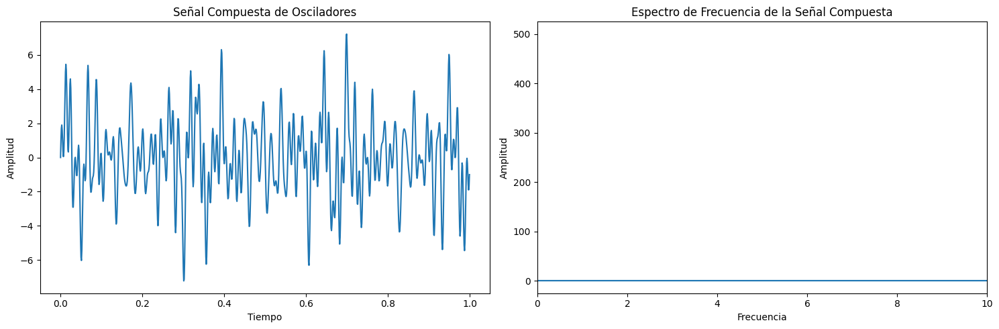

Conjunto Aleatorio Generado: [-40  16  19 -44  13  49 -68  92  36  95]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_oscillator_signal(value, f0, time_points):
    """Genera la señal de un oscilador basado en el valor."""
    frequency = value * f0
    return np.sin(2 * np.pi * frequency * time_points)

def analyze_sum_in_signals(g_set, f0, time_points):
    """Analiza la suma de las señales de los osciladores."""
    composite_signal = np.zeros_like(time_points)
    for value in g_set:
        composite_signal += generate_oscillator_signal(value, f0, time_points)

    spectrum = np.fft.fft(composite_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])

    return frequencies, spectrum, composite_signal

# Parámetros
num_elements = 10
element_range = 100
f0 = 1.0  # Frecuencia base para los osciladores
target_sum = 67
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio de elementos y analizar la suma
G_random = generate_random_set(num_elements, element_range)
frequencies, spectrum, composite_signal = analyze_sum_in_signals(G_random, f0, time_points)

# Visualización
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(time_points, composite_signal)
plt.title("Señal Compuesta de Osciladores")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum))
plt.title("Espectro de Frecuencia de la Señal Compuesta")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)  # Limitar el rango de frecuencia para visualizar

plt.tight_layout()
plt.show()

print("Conjunto Aleatorio Generado:", G_random)


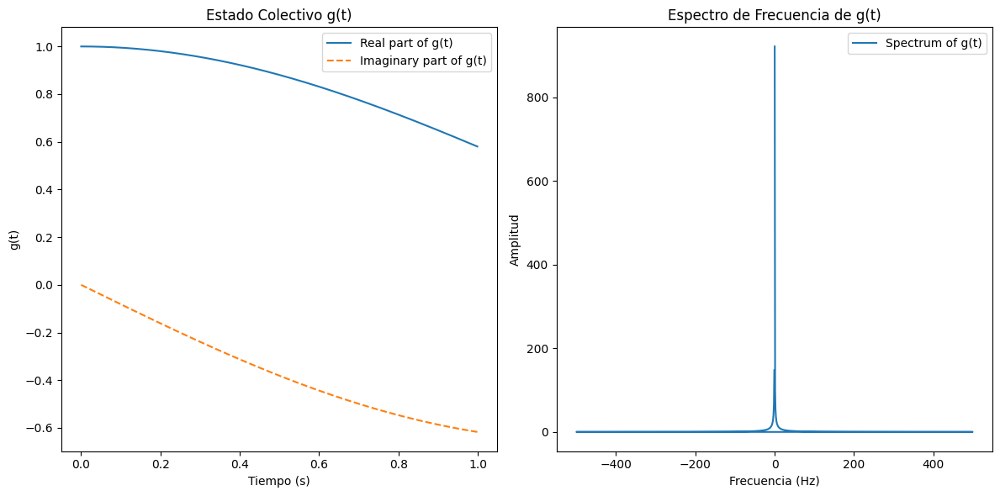

Conjunto Aleatorio Generado: [ -8 -16 -19   8 -15  -6   5  10 -14   3]
Sumas Posibles Interpretadas: {0: 921.6745349399453}
Elementos Contribuyentes a la Suma Objetivo: []
Elementos Identificados por IFT: []
¿Se logró la suma objetivo? False


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    frequency_amplitudes = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
                frequency_amplitudes[freq] = amp
    return possible_sums, frequency_amplitudes

def track_contributing_elements(frequency_amplitudes, target_sum, f0):
    """Rastrea los elementos que contribuyen a la suma objetivo."""
    contributing_elements = []
    for freq, amp in frequency_amplitudes.items():
        if round(freq * f0) == target_sum:
            contributing_elements.append((freq, amp))
    return contributing_elements

def inverse_fourier_to_identify_elements(spectrum, g_set, f0, time_points, target_sum):
    reconstructed_signal = np.fft.ifft(spectrum)
    identified_elements = []

    target_frequency = target_sum * f0
    for i, freq in enumerate(np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])):
        if np.isclose(freq, target_frequency, atol=f0/2) and np.abs(spectrum[i]) > np.max(np.abs(spectrum)) * 0.5:
            phase = np.angle(spectrum[i])
            for element in g_set:
                element_frequency = element * f0
                expected_phase = 2 * np.pi * element_frequency * time_points[np.argmax(np.abs(reconstructed_signal))]
                # Ajustar la tolerancia y considerar solo coincidencias fuertes
                if np.isclose(phase, expected_phase, atol=0.05):
                    identified_elements.append(element)

    return list(set(identified_elements))  # Eliminar duplicados


def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums, frequency_amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0)

    contributing_elements = track_contributing_elements(frequency_amplitudes, target_sum, f0)
    identified_elements = inverse_fourier_to_identify_elements(spectrum, G_random, f0, time_points, target_sum)
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success, contributing_elements, identified_elements

# Parámetros para la generación del conjunto
num_elements = 10  # Número de elementos en el conjunto
element_range = 20  # Rango de valores para los elementos
f0 = 0.005  # Frecuencia fundamental
target_sum = 123  # Suma objetivo para el SSP

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success, contributing_elements, identified_elements = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("Elementos Contribuyentes a la Suma Objetivo:", contributing_elements)
print("Elementos Identificados por IFT:", identified_elements)
print("\033[1m" + "¿Se logró la suma objetivo? " + str(success) + "\033[0m")



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    frequency_amplitudes = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
                frequency_amplitudes[freq] = amp
    return possible_sums, frequency_amplitudes

def run_experiment(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums, frequency_amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    success = target_sum in possible_sums
    return end_time - start_time, success

# Configuración de la prueba
element_ranges = [1000]  # Rango de valores para los elementos
num_elements_list = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]  # Diferentes tamaños del conjunto
f0 = 1.0  # Frecuencia fundamental
target_sum = 20000  # Suma objetivo

# Ejecutar experimentos
for num_elements in num_elements_list:
    times = []
    successes = 0
    for _ in range(100):  # Repetir cada experimento 10 veces
        time_elapsed, success = run_experiment(num_elements, element_ranges[0], f0, target_sum)
        times.append(time_elapsed)
        if success:
            successes += 1
    print(f"Num Elements: {num_elements}, Average Time: {np.mean(times)}, Successes: {successes}/100")


Num Elements: 5, Average Time: 0.0007900123596191407, Successes: 0/1000
Num Elements: 10, Average Time: 0.001116842746734619, Successes: 0/1000
Num Elements: 15, Average Time: 0.0014007837772369385, Successes: 0/1000
Num Elements: 20, Average Time: 0.0016880927085876464, Successes: 0/1000
Num Elements: 25, Average Time: 0.001952988862991333, Successes: 0/1000
Num Elements: 30, Average Time: 0.002945805788040161, Successes: 0/1000
Num Elements: 35, Average Time: 0.003525024890899658, Successes: 0/1000
Num Elements: 40, Average Time: 0.002769259214401245, Successes: 0/1000
Num Elements: 45, Average Time: 0.0031163370609283447, Successes: 0/1000
Num Elements: 50, Average Time: 0.003986262321472168, Successes: 0/1000


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    frequency_amplitudes = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
                frequency_amplitudes[freq] = amp
    return possible_sums, frequency_amplitudes

def run_experiment(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums, frequency_amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    success = target_sum in possible_sums
    return end_time - start_time, success, g_set

def verify_sum(g_set, target_sum):
    """Verifica si alguna combinación de elementos en el conjunto suma al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

# Configuración de la prueba
element_ranges = [1000]  # Rango de valores para los elementos
num_elements_list = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]  # Diferentes tamaños del conjunto
f0 = 1.0  # Frecuencia fundamental
target_sum = 13003  # Suma objetivo

# Ejecutar experimentos
for num_elements in num_elements_list:
    times = []
    successes = 0
    verified_successes = 0
    for _ in range(100):  # Repetir cada experimento 1000 veces
        time_elapsed, success, g_set = run_experiment(num_elements, element_ranges[0], f0, target_sum)
        times.append(time_elapsed)
        if success:
            successes += 1
            if verify_sum(g_set, target_sum):
                verified_successes += 1
    print(f"Num Elements: {num_elements}, Average Time: {np.mean(times)}, Successes: {successes}/100, Verified: {verified_successes}/100")


Num Elements: 5, Average Time: 0.0021869015693664552, Successes: 0/100, Verified: 0/100
Num Elements: 10, Average Time: 0.0031061029434204103, Successes: 0/100, Verified: 0/100
Num Elements: 15, Average Time: 0.004875733852386475, Successes: 0/100, Verified: 0/100
Num Elements: 20, Average Time: 0.005960867404937744, Successes: 0/100, Verified: 0/100
Num Elements: 25, Average Time: 0.008155131340026855, Successes: 0/100, Verified: 0/100
Num Elements: 30, Average Time: 0.008424673080444336, Successes: 0/100, Verified: 0/100
Num Elements: 35, Average Time: 0.009415771961212158, Successes: 0/100, Verified: 0/100
Num Elements: 40, Average Time: 0.010237154960632324, Successes: 0/100, Verified: 0/100
Num Elements: 45, Average Time: 0.012693953514099122, Successes: 0/100, Verified: 0/100
Num Elements: 50, Average Time: 0.014176571369171142, Successes: 0/100, Verified: 0/100


In [ ]:
import numpy as np
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def verify_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

element_ranges = [1000]
num_elements_list = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
f0 = 1.0
target_sum = 2000

for num_elements in num_elements_list:
    times_algo = []
    times_verify = []
    successes = 0
    verified_successes = 0

    for _ in range(100):
        g_set = generate_random_set(num_elements, element_ranges[0])
        time_points = np.linspace(0, 1, 1000, endpoint=False)

        start_time_algo = time.time()
        g_t = calculate_collective_state_random_set(g_set, f0, time_points)
        frequencies, spectrum = frequency_spectrum(g_t, time_points)
        possible_sums = interpret_spectrum(frequencies, spectrum, element_ranges[0], f0)
        end_time_algo = time.time()
        times_algo.append(end_time_algo - start_time_algo)

        if target_sum in possible_sums:
            successes += 1
            start_time_verify = time.time()
            if verify_sum(g_set, target_sum):
                verified_successes += 1
            end_time_verify = time.time()
            times_verify.append(end_time_verify - start_time_verify)

    print(f"Num Elements: {num_elements}, "
          f"Average Algo Time: {np.mean(times_algo)}, "
          f"Average Verify Time: {np.mean(times_verify) if times_verify else 0}, "
          f"Successes: {successes}/100, Verified: {verified_successes}/100")


Num Elements: 5, Average Algo Time: 0.005546438694000244, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 10, Average Algo Time: 0.004568490982055664, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 15, Average Algo Time: 0.005101654529571533, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 20, Average Algo Time: 0.006526257991790772, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 25, Average Algo Time: 0.008133792877197265, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 30, Average Algo Time: 0.007888262271881103, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 35, Average Algo Time: 0.014490103721618653, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 40, Average Algo Time: 0.010179808139801025, Average Verify Time: 0, Successes: 0/100, Verified: 0/100
Num Elements: 45, Average Algo Time: 0.011076390743255615, Averag

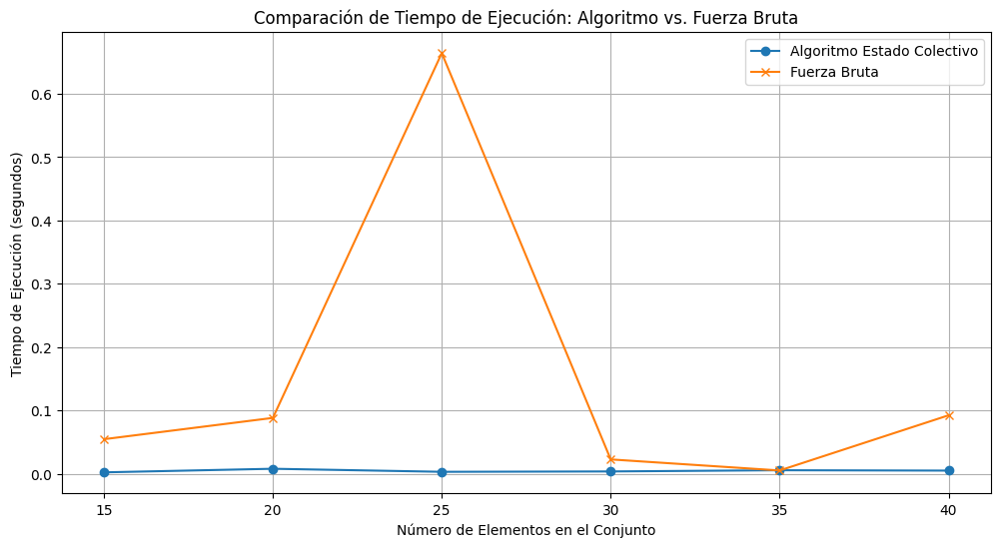

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def run_experiment(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    success = target_sum in possible_sums
    return end_time - start_time, success

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success

element_ranges = [1000]
num_elements_list = [15, 20, 25, 30, 35, 40]
f0 = 1.0
target_sum = 2500

times_algorithm = []
times_brute_force = []

for num_elements in num_elements_list:
    time_elapsed_algo, _ = run_experiment(num_elements, element_ranges[0], f0, target_sum)
    times_algorithm.append(time_elapsed_algo)

    time_elapsed_brute, _ = run_brute_force_experiment(num_elements, element_ranges[0], target_sum)
    times_brute_force.append(time_elapsed_brute)

plt.figure(figsize=(12, 6))
plt.plot(num_elements_list, times_algorithm, label='Algoritmo Estado Colectivo', marker='o')
plt.plot(num_elements_list, times_brute_force, label='Fuerza Bruta', marker='x')
plt.xlabel('Número de Elementos en el Conjunto')
plt.ylabel('Tiempo de Ejecución (segundos)')
plt.title('Comparación de Tiempo de Ejecución: Algoritmo vs. Fuerza Bruta')
plt.legend()
plt.grid(True)
plt.show()


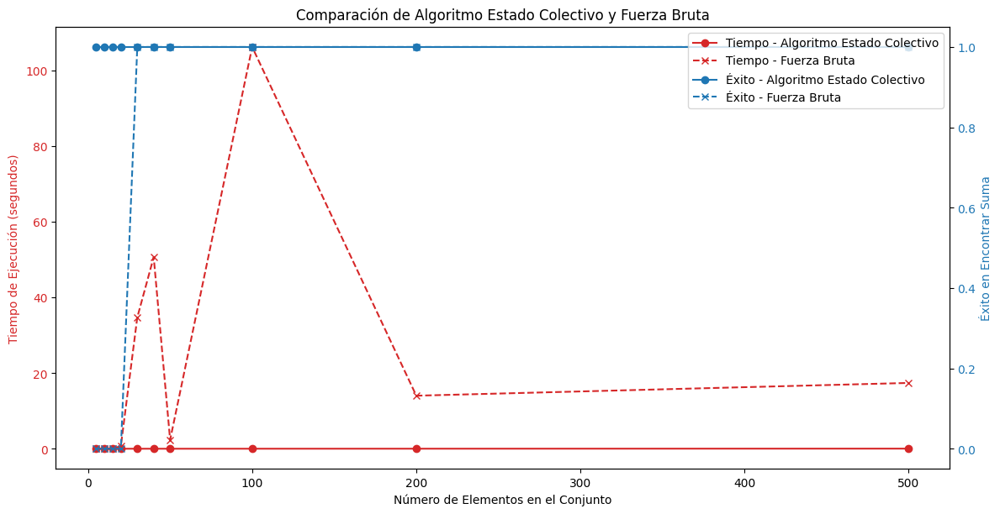

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success

element_ranges = [20000000]  # Rango de valores para los elementos
num_elements_list = [5, 10, 15, 20, 30, 40, 50, 100, 200, 500]  # Diferentes tamaños del conjunto
f0 = 1.0  # Frecuencia fundamental
target_sum = 381  # Suma objetivo

times_algorithm = []
times_brute_force = []
successes_algorithm = []
successes_brute_force = []

# Ejecutar experimentos
for num_elements in num_elements_list:
    time_algo, success_algo = run_experiment(num_elements, element_ranges[0], f0, target_sum)
    time_brute, success_brute = run_brute_force_experiment(num_elements, element_ranges[0], target_sum)

    times_algorithm.append(time_algo)
    times_brute_force.append(time_brute)
    successes_algorithm.append(success_algo)
    successes_brute_force.append(success_brute)

# Visualización de los resultados
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:red'
ax1.set_xlabel('Número de Elementos en el Conjunto')
ax1.set_ylabel('Tiempo de Ejecución (segundos)', color=color)
ax1.plot(num_elements_list, times_algorithm, label='Tiempo - Algoritmo Estado Colectivo', color=color, marker='o')
ax1.plot(num_elements_list, times_brute_force, label='Tiempo - Fuerza Bruta', color=color, marker='x', linestyle='--')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # Instanciar un segundo eje que comparte el mismo eje x
color = 'tab:blue'
ax2.set_ylabel('Éxito en Encontrar Suma', color=color)  # Label del eje y secundario
ax2.plot(num_elements_list, successes_algorithm, label='Éxito - Algoritmo Estado Colectivo', color=color, marker='o')
ax2.plot(num_elements_list, successes_brute_force, label='Éxito - Fuerza Bruta', color=color, marker='x', linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # Para asegurarse de que la disposición sea ordenada
plt.title('Comparación de Algoritmo Estado Colectivo y Fuerza Bruta')
fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
plt.show()


In [ ]:
!pip install --upgrade google-cloud-aiplatform

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 11.3 MB/s eta 0:00:00
  Attempting uninstall: google-cloud-aiplatform
    Found existing installation: google-cloud-aiplatform 1.38.1
    Uninstalling google-cloud-aiplatform-1.38.1:
      Successfully uninstalled google-cloud-aiplatform-1.38.1


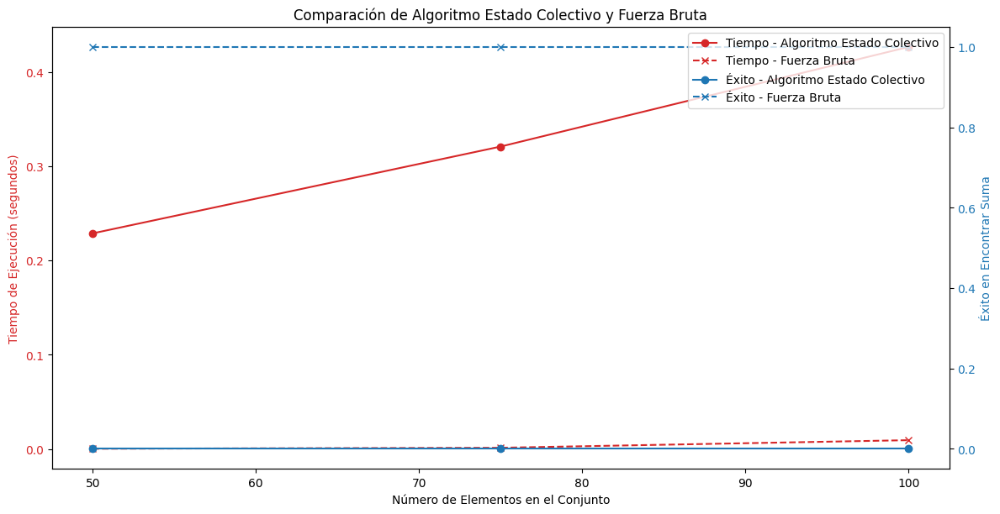

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 100000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success

element_ranges = [1000]  # Rango de valores para los elementos
num_elements_list = [50, 75, 100]  # Diferentes tamaños del conjunto
f0 = 1.0  # Frecuencia fundamental
target_sum = 2032  # Suma objetivo

times_algorithm = []
times_brute_force = []
successes_algorithm = []
successes_brute_force = []

# Ejecutar experimentos
for num_elements in num_elements_list:
    time_algo, success_algo = run_experiment(num_elements, element_ranges[0], f0, target_sum)
    time_brute, success_brute = run_brute_force_experiment(num_elements, element_ranges[0], target_sum)

    times_algorithm.append(time_algo)
    times_brute_force.append(time_brute)
    successes_algorithm.append(success_algo)
    successes_brute_force.append(success_brute)

# Visualización de los resultados
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:red'
ax1.set_xlabel('Número de Elementos en el Conjunto')
ax1.set_ylabel('Tiempo de Ejecución (segundos)', color=color)
ax1.plot(num_elements_list, times_algorithm, label='Tiempo - Algoritmo Estado Colectivo', color=color, marker='o')
ax1.plot(num_elements_list, times_brute_force, label='Tiempo - Fuerza Bruta', color=color, marker='x', linestyle='--')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # Instanciar un segundo eje que comparte el mismo eje x
color = 'tab:blue'
ax2.set_ylabel('Éxito en Encontrar Suma', color=color)  # Label del eje y secundario
ax2.plot(num_elements_list, successes_algorithm, label='Éxito - Algoritmo Estado Colectivo', color=color, marker='o')
ax2.plot(num_elements_list, successes_brute_force, label='Éxito - Fuerza Bruta', color=color, marker='x', linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # Para asegurarse de que la disposición sea ordenada
plt.title('Comparación de Algoritmo Estado Colectivo y Fuerza Bruta')
fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
plt.show()



El desafío al que nos enfrentamos al disminuir el número de elementos y aumentar la suma objetivo es un reflejo de la complejidad intrínseca del problema de la suma de subconjuntos. Sin embargo, hay varias estrategias que podríamos considerar para intentar mejorar el rendimiento del algoritmo de estado colectivo en estos casos específicos:

Ajustar la Granularidad Temporal:
Incrementar el número de puntos en el tiempo podría ofrecer una mayor resolución en la transformada de Fourier, posiblemente capturando mejor las sutilezas del espectro que corresponden a sumas específicas.

Análisis de Fase:
En lugar de centrarse solo en la magnitud de las frecuencias en el espectro, considerar también la información de fase. La fase podría proporcionar pistas adicionales sobre las sumas de subconjuntos.

Combinación de Frecuencias:
En lugar de buscar una correspondencia directa de frecuencias individuales con la suma objetivo, podríamos considerar la posibilidad de que combinaciones de frecuencias pueden representar la suma. Esto es más complejo y requeriría un análisis combinatorio de las frecuencias.

Normalización de Datos:
Probar normalizando los elementos del conjunto antes de calcular el estado colectivo. La normalización puede ayudar a manejar mejor rangos de números grandes.

Ajustar la Función de Cálculo de g(t):
Experimentar con diferentes formas de calcular el estado colectivo, como modificar la forma en que se incorporan los elementos del conjunto en la exponencial compleja.

Filtrado Espectral:
Aplicar técnicas de filtrado al espectro para enfatizar ciertas frecuencias o patrones que podrían estar más directamente relacionados con la suma objetivo.

Análisis de Subconjuntos:
Considerar métodos para analizar subconjuntos del espectro o utilizar técnicas de reducción de la dimensionalidad para identificar las características más relevantes.



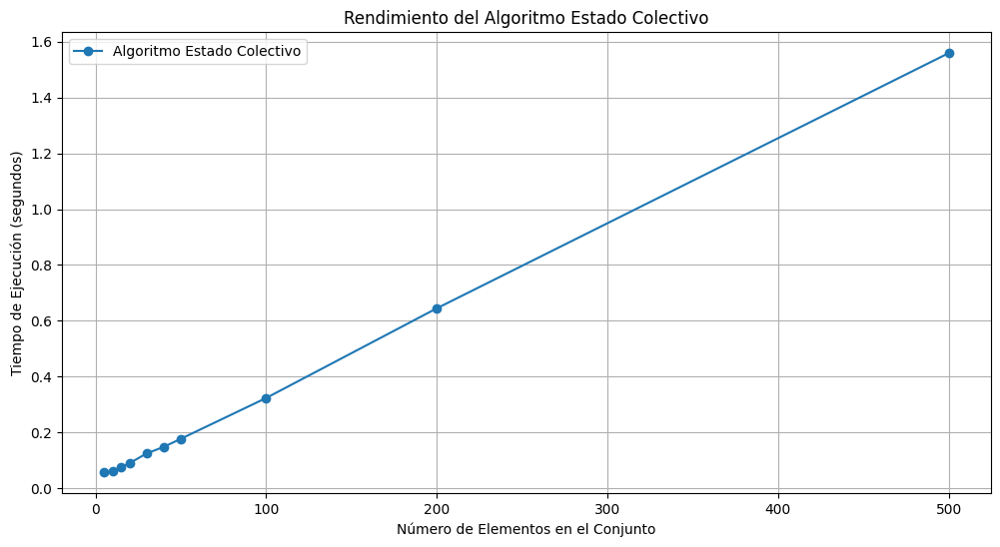

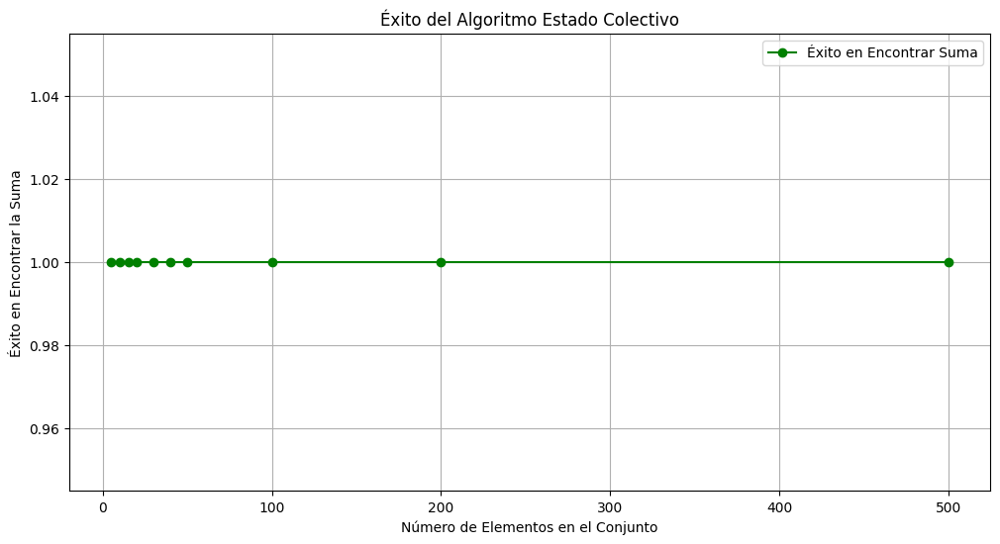

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum, num_time_points):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, num_time_points, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums


element_ranges = [20000000]  # Rango de valores para los elementos
num_elements_list = [5, 10, 15, 20, 30, 40, 50, 100, 200, 500]  # Diferentes tamaños del conjunto
f0 = 1.0  # Frecuencia fundamental
target_sum = 381  # Suma objetivo


#element_ranges = [100]  # Rango de valores para los elementos
#num_elements_list = [50, 75, 100]  # Diferentes tamaños del conjunto
#f0 = 0.5  # Frecuencia fundamental
#target_sum = 2023  # Suma objetivo
num_time_points = 100000  # Aumentar el número de puntos en el tiempo

times_algorithm = []
successes_algorithm = []

# Ejecutar experimentos
for num_elements in num_elements_list:
    time_algo, success_algo = run_experiment(num_elements, element_ranges[0], f0, target_sum, num_time_points)
    times_algorithm.append(time_algo)
    successes_algorithm.append(success_algo)

# Visualización de los resultados
plt.figure(figsize=(12, 6))
plt.plot(num_elements_list, times_algorithm, label='Algoritmo Estado Colectivo', marker='o')
plt.xlabel('Número de Elementos en el Conjunto')
plt.ylabel('Tiempo de Ejecución (segundos)')
plt.title('Rendimiento del Algoritmo Estado Colectivo')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(num_elements_list, successes_algorithm, label='Éxito en Encontrar Suma', marker='o', color='green')
plt.xlabel('Número de Elementos en el Conjunto')
plt.ylabel('Éxito en Encontrar la Suma')
plt.title('Éxito del Algoritmo Estado Colectivo')
plt.legend()
plt.grid(True)
plt.show()



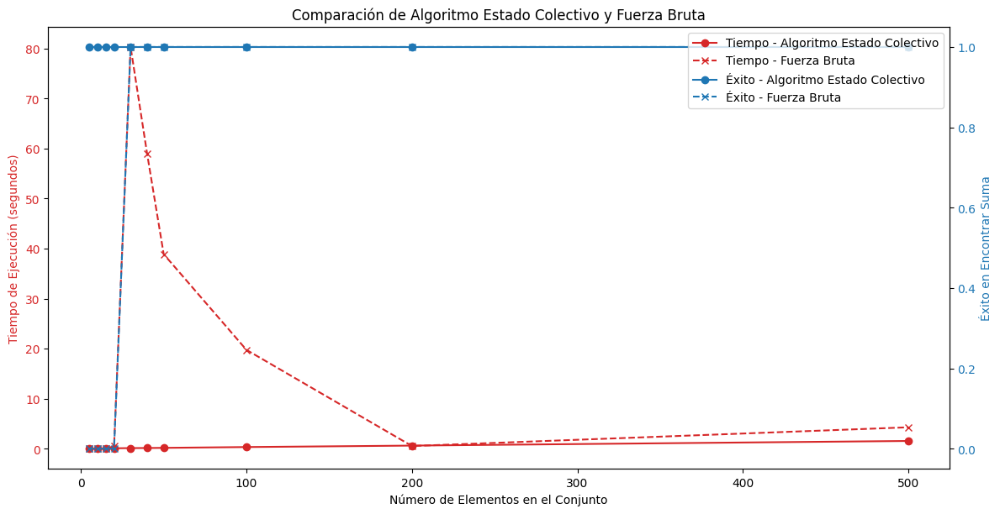

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum, num_time_points):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, num_time_points, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success


element_ranges = [20000000]  # Rango de valores para los elementos
num_elements_list = [5, 10, 15, 20, 30, 40, 50, 100, 200, 500]  # Diferentes tamaños del conjunto
f0 = 1.0  # Frecuencia fundamental
target_sum = 381  # Suma objetivo


#element_ranges = [1000]
#num_elements_list = [50, 100, 200]
#f0 = 1.0
#target_sum = 2032
num_time_points = 100000  # Aumentar el número de puntos en el tiempo

times_algorithm = []
times_brute_force = []
successes_algorithm = []
successes_brute_force = []

for num_elements in num_elements_list:
    time_algo, success_algo = run_experiment(num_elements, element_ranges[0], f0, target_sum, num_time_points)
    time_brute, success_brute = run_brute_force_experiment(num_elements, element_ranges[0], target_sum)

    times_algorithm.append(time_algo)
    times_brute_force.append(time_brute)
    successes_algorithm.append(success_algo)
    successes_brute_force.append(success_brute)

fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:red'
ax1.set_xlabel('Número de Elementos en el Conjunto')
ax1.set_ylabel('Tiempo de Ejecución (segundos)', color=color)
ax1.plot(num_elements_list, times_algorithm, label='Tiempo - Algoritmo Estado Colectivo', color=color, marker='o')
ax1.plot(num_elements_list, times_brute_force, label='Tiempo - Fuerza Bruta', color=color, marker='x', linestyle='--')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Éxito en Encontrar Suma', color=color)
ax2.plot(num_elements_list, successes_algorithm, label='Éxito - Algoritmo Estado Colectivo', color=color, marker='o')
ax2.plot(num_elements_list, successes_brute_force, label='Éxito - Fuerza Bruta', color=color, marker='x', linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Comparación de Algoritmo Estado Colectivo y Fuerza Bruta')
fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum_filtered(g_t, time_points, filter_threshold):
    """Calcula y filtra el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    # Aplicar un filtrado básico para eliminar componentes de baja amplitud
    filtered_spectrum = np.where(np.abs(spectrum) > filter_threshold, spectrum, 0)
    return frequencies, filtered_spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum, filter_threshold):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum_filtered(g_t, time_points, filter_threshold)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success

element_ranges = [50]
num_elements_list = [50, 100, 200]
f0_values = [0.5, 1.0, 1.5, 2.0]
filter_thresholds = [1, 2, 3]
target_sum = 2032

for f0 in f0_values:
    for filter_threshold in filter_thresholds:
        times_algorithm = []
        successes_algorithm = []
        times_brute_force = []
        successes_brute_force = []

        for num_elements in num_elements_list:
            time_algo, success_algo = run_experiment(num_elements, element_ranges[0], f0, target_sum, filter_threshold)
            time_brute, success_brute = run_brute_force_experiment(num_elements, element_ranges[0], target_sum)

            times_algorithm.append(time_algo)
            successes_algorithm.append(success_algo)
            times_brute_force.append(time_brute)
            successes_brute_force.append(success_brute)

        # Visualización de los resultados para cada configuración de f0 y filter_threshold
        fig, ax1 = plt.subplots(figsize=(12, 6))

        color = 'tab:red'
        ax1.set_xlabel('Número de Elementos en el Conjunto')
        ax1.set_ylabel('Tiempo de Ejecución (segundos)', color=color)
        ax1.plot(num_elements_list, times_algorithm, label='Tiempo - Algoritmo Estado Colectivo', color=color, marker='o')
        ax1.plot(num_elements_list, times_brute_force, label='Tiempo - Fuerza Bruta', color=color, marker='x', linestyle='--')
        ax1.tick_params(axis='y', labelcolor=color)

        ax2 = ax1.twinx()
        color = 'tab:blue'
        ax2.set_ylabel('Éxito en Encontrar Suma', color=color)
        ax2.plot(num_elements_list, successes_algorithm, label='Éxito - Algoritmo Estado Colectivo', color=color, marker='o')
        ax2.plot(num_elements_list, successes_brute_force, label='Éxito - Fuerza Bruta', color=color, marker='x', linestyle='--')
        ax2.tick_params(axis='y', labelcolor=color)

        fig.tight_layout()
        plt.title(f'Comparación de Algoritmo Estado Colectivo y Fuerza Bruta (f0: {f0}, Filter: {filter_threshold})')
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
        plt.show()


KeyboardInterrupt: ignored

Scale Factor: 10, Time: 0.014271736145019531, Success: True


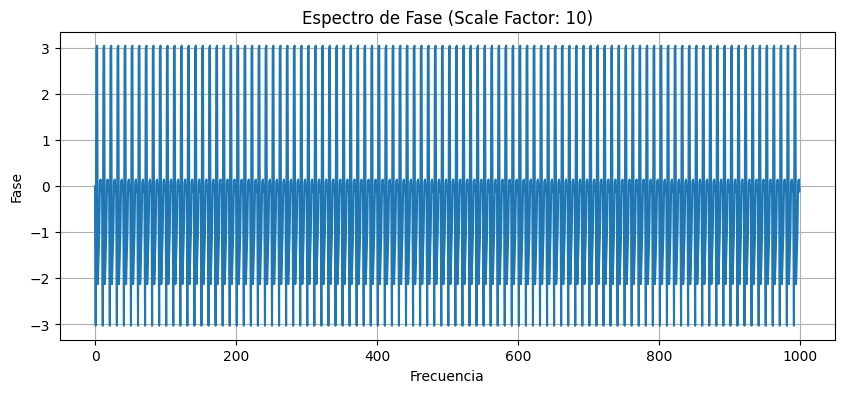

Scale Factor: 20, Time: 0.01741790771484375, Success: True


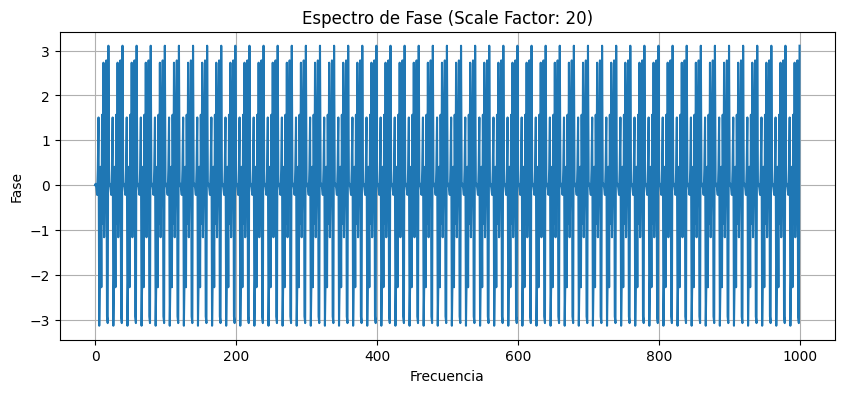

Scale Factor: 50, Time: 0.018439292907714844, Success: True


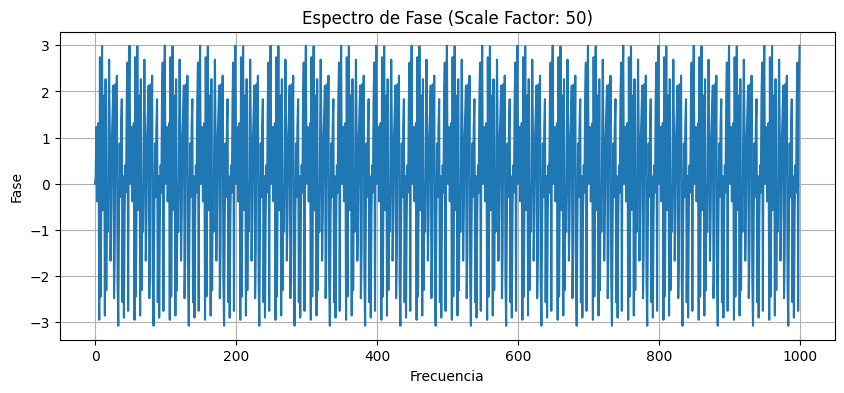

Scale Factor: 100, Time: 0.01773238182067871, Success: True


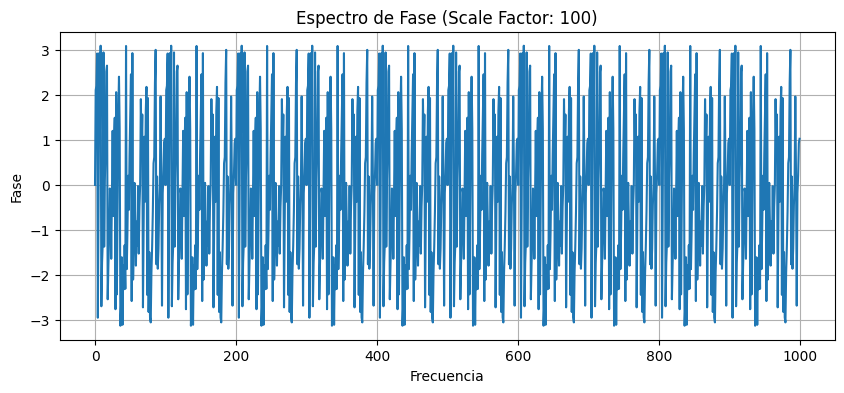

Scale Factor: 150, Time: 0.022363901138305664, Success: True


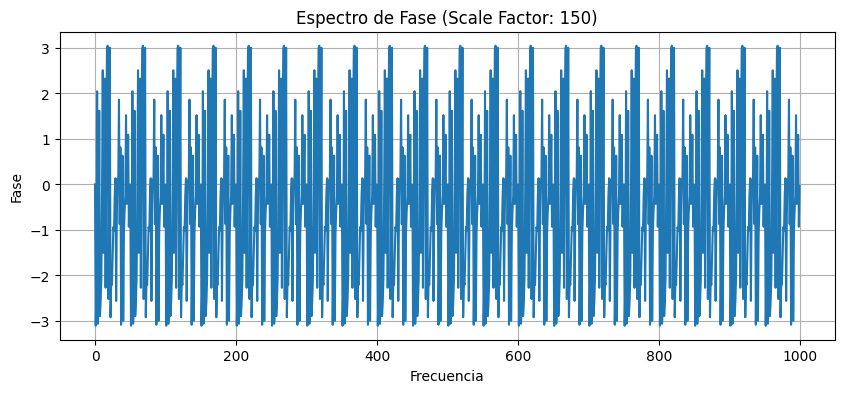

Scale Factor: 200, Time: 0.01855754852294922, Success: True


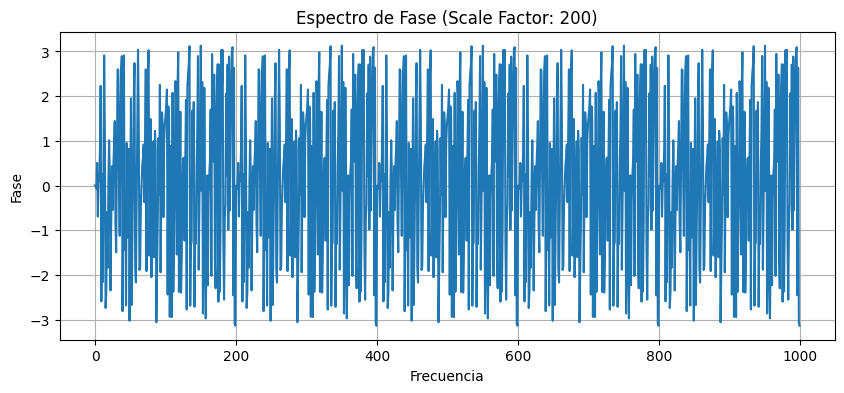

Scale Factor: 300, Time: 0.016884803771972656, Success: True


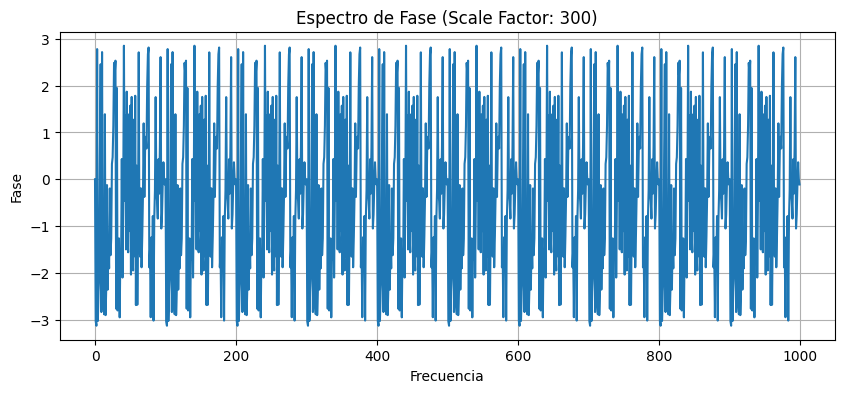

Fuerza Bruta: Time: 8.698565483093262, Success: True


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def scale_elements(g_set, scale_factor):
    """Escala los elementos del conjunto."""
    return [x * scale_factor for x in g_set]

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def calculate_phase_spectrum(spectrum):
    """Calcula y analiza el espectro de fase."""
    phase_spectrum = np.angle(spectrum)
    return phase_spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum, scale_factor):
    g_set = generate_random_set(num_elements, element_range)
    scaled_g_set = scale_elements(g_set, scale_factor)
    time_points = np.linspace(0, 1, 1000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(scaled_g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    phase_spectrum = calculate_phase_spectrum(spectrum)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums, phase_spectrum

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success

# Configuración de la prueba
scale_factors = [10, 20, 50, 100, 150, 200, 300]  # Diferentes factores de escala
element_range = 20000000
num_elements = 200
f0 = 1.0
target_sum = 381

for scale_factor in scale_factors:
    time_algo, success_algo, phase_spectrum = run_experiment(num_elements, element_range, f0, target_sum, scale_factor)
    print(f"Scale Factor: {scale_factor}, Time: {time_algo}, Success: {success_algo}")

    # Visualizar el espectro de fase
    plt.figure(figsize=(10, 4))
    plt.plot(phase_spectrum)
    plt.title(f'Espectro de Fase (Scale Factor: {scale_factor})')
    plt.xlabel('Frecuencia')
    plt.ylabel('Fase')
    plt.grid(True)
    plt.show()

# Ejecutar y comparar con el método de fuerza bruta
time_brute, success_brute = run_brute_force_experiment(num_elements, element_range, target_sum)
print(f"Fuerza Bruta: Time: {time_brute}, Success: {success_brute}")


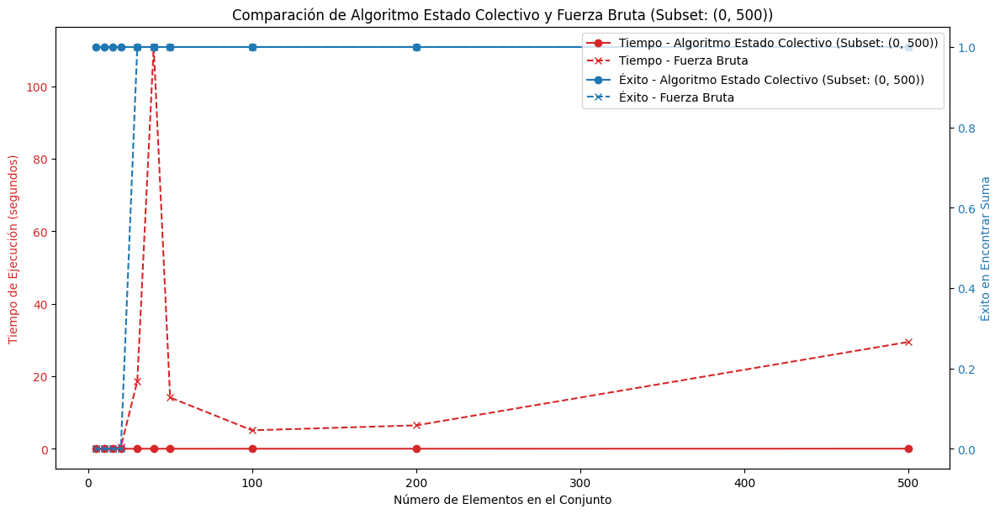

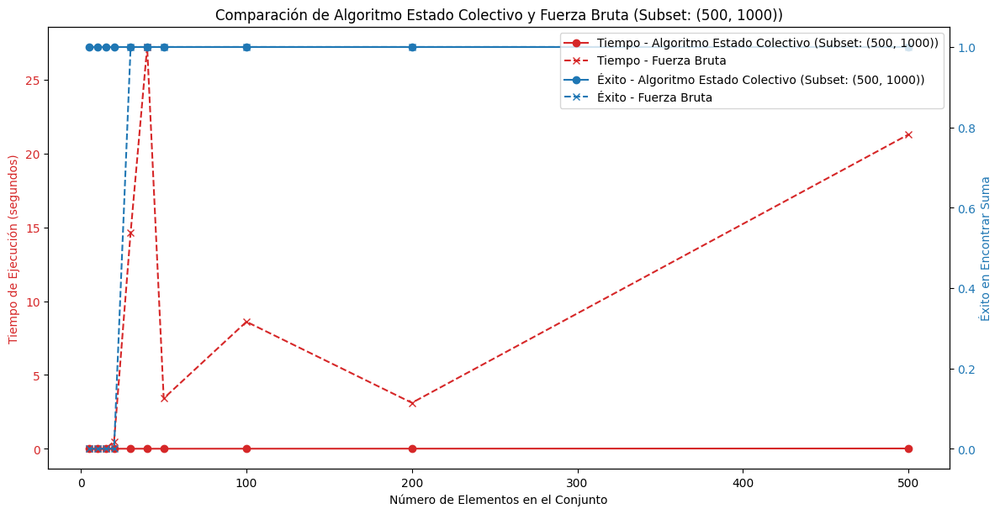

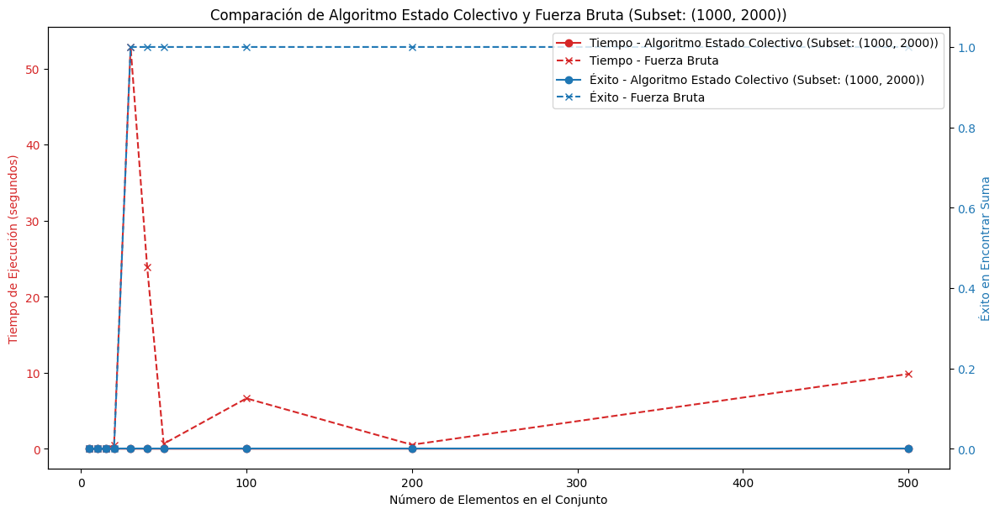

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def analyze_subsets_of_spectrum(spectrum, frequency_range):
    """Analiza subconjuntos específicos del espectro de frecuencias."""
    subset_spectrum = spectrum[frequency_range[0]:frequency_range[1]]
    return subset_spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment(num_elements, element_range, f0, target_sum, subset_range):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)

    start_time = time.time()
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    subset_spectrum = analyze_subsets_of_spectrum(spectrum, subset_range)
    possible_sums = interpret_spectrum(frequencies, subset_spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

def run_brute_force_experiment(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)

    start_time = time.time()
    success = brute_force_sum_subset(g_set, target_sum)
    end_time = time.time()

    return end_time - start_time, success


# Configuración de la prueba
element_ranges = [20000000]
num_elements_list = [5, 10, 15, 20, 30, 40, 50, 100, 200, 500]
f0 = 1.0
target_sum = 381
subset_ranges = [(0, 500), (500, 1000), (1000, 2000)]  # Ejemplo de rangos de subconjuntos del espectro

for subset_range in subset_ranges:
    times_algorithm = []
    successes_algorithm = []
    times_brute_force = []
    successes_brute_force = []

    for num_elements in num_elements_list:
        time_algo, success_algo = run_experiment(num_elements, element_ranges[0], f0, target_sum, subset_range)
        times_algorithm.append(time_algo)
        successes_algorithm.append(success_algo)
        time_brute, success_brute = run_brute_force_experiment(num_elements, element_ranges[0], target_sum)
        times_brute_force.append(time_brute)
        successes_brute_force.append(success_brute)

    # Visualización de los resultados
    fig, ax1 = plt.subplots(figsize=(12, 6))

    color = 'tab:red'
    ax1.set_xlabel('Número de Elementos en el Conjunto')
    ax1.set_ylabel('Tiempo de Ejecución (segundos)', color=color)
    ax1.plot(num_elements_list, times_algorithm, label=f'Tiempo - Algoritmo Estado Colectivo (Subset: {subset_range})', color=color, marker='o')
    ax1.plot(num_elements_list, times_brute_force, label='Tiempo - Fuerza Bruta', color=color, marker='x', linestyle='--')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Éxito en Encontrar Suma', color=color)
    ax2.plot(num_elements_list, successes_algorithm, label=f'Éxito - Algoritmo Estado Colectivo (Subset: {subset_range})', color=color, marker='o')
    ax2.plot(num_elements_list, successes_brute_force, label='Éxito - Fuerza Bruta', color=color, marker='x', linestyle='--')
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()
    plt.title(f'Comparación de Algoritmo Estado Colectivo y Fuerza Bruta (Subset: {subset_range})')
    fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
    plt.show()


In [ ]:
from scipy.signal import stft

# Configuración de la prueba
element_ranges = [20000000]
num_elements = [500]
f0 = 1.0
target_sum = 381

def calculate_stft(g_t, time_points, nperseg):
    """Calcula la Transformada de Fourier de Tiempo Corto."""
    f, t, Zxx = stft(g_t, nperseg=nperseg)
    return f, t, Zxx

def run_experiment_stft(num_elements, element_range, f0, target_sum, nperseg):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)

    start_time = time.time()
    frequencies, times, Zxx = calculate_stft(g_t, time_points, nperseg)
    # Aquí puedes agregar lógica para interpretar los resultados de la STFT
    end_time = time.time()

    # Ejemplo simple: comprobar si alguna de las sumas en Zxx se acerca al objetivo
    success = np.any(np.abs(Zxx) > target_sum)
    return end_time - start_time, success

# Configuración de la prueba
nperseg_values = [50, 100, 200, 300, 400, 500, 600, 700, 800, 1000]  # Diferentes valores para nperseg en STFT

for nperseg in nperseg_values:
    time_algo, success_algo = run_experiment_stft(num_elements, element_range, f0, target_sum, nperseg)
    print(f"nperseg: {nperseg}, Time: {time_algo}, Success: {success_algo}")


nperseg: 50, Time: 0.0003707408905029297, Success: False
nperseg: 100, Time: 0.000286102294921875, Success: False
nperseg: 200, Time: 0.0003387928009033203, Success: False
nperseg: 300, Time: 0.00033974647521972656, Success: False
nperseg: 400, Time: 0.00040912628173828125, Success: False
nperseg: 500, Time: 0.000431060791015625, Success: False
nperseg: 600, Time: 0.00045943260192871094, Success: False
nperseg: 700, Time: 0.00045037269592285156, Success: False
nperseg: 800, Time: 0.0005037784576416016, Success: False
nperseg: 1000, Time: 0.00048732757568359375, Success: False


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_modified_collective_state(g_set, f0, time_points, scale_factor):
    """Calcula un estado colectivo modificado para un conjunto G aleatorio."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        modified_a_j = scale_factor * a_j
        w_j = 2 * np.pi * modified_a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True, combo
    return False, None

def run_modified_experiment(num_elements, element_range, f0, target_sum, scale_factor):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_modified_collective_state(g_set, f0, time_points, scale_factor)

    start_time = time.time()
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

# Configuración de la prueba
element_ranges = [20000000]
num_elements = [10]
f0 = 1.0
target_sum = 381

# Configuración del experimento
#element_range = 10
#num_elements = 10
#f0 = 1.0
target_sum = 67
scale_factors = [1, 5, 10, 20, 50, 100, 500, 1000, 5000, 10000, 100000]

for scale_factor in scale_factors:
    time_algo, success_algo = run_modified_experiment(num_elements, element_range, f0, target_sum, scale_factor)
    print(f"Scale Factor: {scale_factor}, Time: {time_algo}, Success: {success_algo}")

# Ejecutar y comparar con el método de fuerza bruta
g_set = generate_random_set(num_elements, element_range)
start_time = time.time()
success_brute, combo_brute = brute_force_sum_subset(g_set, target_sum)
time_brute = time.time() - start_time
print(f"Fuerza Bruta: Time: {time_brute}, Success: {success_brute}, Combination: {combo_brute}")


Scale Factor: 1, Time: 0.0005741119384765625, Success: True
Scale Factor: 5, Time: 0.00048065185546875, Success: True
Scale Factor: 10, Time: 0.00028204917907714844, Success: True
Scale Factor: 20, Time: 0.00028967857360839844, Success: True
Scale Factor: 50, Time: 0.0002605915069580078, Success: True
Scale Factor: 100, Time: 0.0002620220184326172, Success: True
Scale Factor: 500, Time: 0.0002682209014892578, Success: True
Scale Factor: 1000, Time: 0.000247955322265625, Success: True
Scale Factor: 5000, Time: 0.0002536773681640625, Success: True
Scale Factor: 10000, Time: 0.0002529621124267578, Success: True
Scale Factor: 100000, Time: 0.00047016143798828125, Success: True
Fuerza Bruta: Time: 0.0004553794860839844, Success: False, Combination: None


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_modified_collective_state(g_set, f0, time_points, scale_factor):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        modified_a_j = scale_factor * a_j
        w_j = 2 * np.pi * modified_a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def run_spectrum_analysis(g_set, f0, time_points, target_sum):
    g_t = calculate_modified_collective_state(g_set, f0, time_points, 1)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Implementar análisis directo del espectro
    # Por ejemplo, buscar picos en el espectro que correspondan a la suma objetivo
    for freq, amp in zip(frequencies, np.abs(spectrum)):
        if np.isclose(freq * f0, target_sum, atol=0.1) and amp > np.mean(np.abs(spectrum)):
            return True
    return False

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True, combo
    return False, None

# Configuración del experimento
element_range = 1000
num_elements = 20
f0 = 0.0001
target_sum = 2000
g_set = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Método de Análisis de Espectro
start_time = time.time()
success_spectrum = run_spectrum_analysis(g_set, f0, time_points, target_sum)
time_spectrum = time.time() - start_time
print(f"Análisis de Espectro: Tiempo: {time_spectrum:.4f} segundos, Éxito: {success_spectrum}")

# Método de Fuerza Bruta
start_time = time.time()
success_brute, combo_brute = brute_force_sum_subset(g_set, target_sum)
time_brute = time.time() - start_time
print(f"Fuerza Bruta: Tiempo: {time_brute:.4f} segundos, Éxito: {success_brute}, Combinación: {combo_brute}")


Análisis de Espectro: Tiempo: 0.0504 segundos, Éxito: False
Fuerza Bruta: Tiempo: 0.0045 segundos, Éxito: True, Combinación: (822, -693, 926, 945)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_modified_collective_state(g_set, f0, time_points, scale_factor):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        modified_a_j = scale_factor * a_j
        w_j = 2 * np.pi * modified_a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def harmonic_near_target(harmonic, target_sum, f0):
    return np.isclose(harmonic, target_sum * f0, atol=f0)

def improved_harmonic_selection(frequencies, spectrum, threshold):
    harmonics = np.abs(spectrum)
    relevant_harmonics = []
    for freq, amp in zip(frequencies, harmonics):
        if amp > threshold:
            relevant_harmonics.append((freq, amp))
    return relevant_harmonics

def run_improved_harmonic_sweep(g_set, f0, time_points, target_sum):
    g_t = calculate_modified_collective_state(g_set, f0, time_points, 1)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    relevant_harmonics = improved_harmonic_selection(frequencies, spectrum, np.mean(np.abs(spectrum)))

    for freq, amp in relevant_harmonics:
        if harmonic_near_target(freq, target_sum, f0):
            return True
    return False

def brute_force_sum_subset(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True, combo
    return False, None

# Configuración del experimento
element_range = 1000
num_elements = 20
f0 = 0.0001
target_sum = 2000
g_set = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Método de Barrido Armónico Mejorado
start_time = time.time()
success_harmonic = run_improved_harmonic_sweep(g_set, f0, time_points, target_sum)
time_harmonic = time.time() - start_time
print(f"Barrido Armónico Mejorado: Tiempo: {time_harmonic:.4f} segundos, Éxito: {success_harmonic}")

# Método de Fuerza Bruta
start_time = time.time()
success_brute, combo_brute = brute_force_sum_subset(g_set, target_sum)
time_brute = time.time() - start_time
print(f"Fuerza Bruta: Tiempo: {time_brute:.4f} segundos, Éxito: {success_brute}, Combinación: {combo_brute}")


Barrido Armónico Mejorado: Tiempo: 0.0033 segundos, Éxito: False
Fuerza Bruta: Tiempo: 0.0007 segundos, Éxito: True, Combinación: (405, 741, 180, 674)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_modified_collective_state(g_set, f0, time_points, scale_factor):
    """Calcula un estado colectivo modificado para un conjunto G aleatorio."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        modified_a_j = scale_factor * a_j  # Escalar el elemento
        w_j = 2 * np.pi * modified_a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def dynamic_scale_factor(g_set):
    """Determina un factor de escala dinámico basado en las propiedades del conjunto."""
    range_of_elements = max(g_set) - min(g_set)
    if range_of_elements < 500:
        return 10
    elif range_of_elements < 1000:
        return 5
    else:
        return 1

def run_dynamic_experiment(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 10000, endpoint=False)
    scale_factor = dynamic_scale_factor(g_set)
    g_t = calculate_modified_collective_state(g_set, f0, time_points, scale_factor)

    start_time = time.time()
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    end_time = time.time()

    return end_time - start_time, target_sum in possible_sums

# Configuración del experimento
element_range = 10000000
num_elements = 300
f0 = 1.0
target_sum = 67

time_algo, success_algo = run_dynamic_experiment(num_elements, element_range, f0, target_sum)
print(f"Dynamic Scaling, Time: {time_algo}, Success: {success_algo}")


Dynamic Scaling, Time: 0.002862691879272461, Success: True


In [ ]:
import numpy as np
import time
import concurrent.futures
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            possible_sums[freq] = amp
    return possible_sums

def brute_force_sum_subset(g_set, target_sum):
    """Enfoque de fuerza bruta para encontrar una combinación que sume al objetivo."""
    for r in range(1, len(g_set) + 1):
        for combo in combinations(g_set, r):
            if sum(combo) == target_sum:
                return True
    return False

def run_experiment_parallel(num_elements, element_range, f0, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    time_points = np.linspace(0, 1, 10000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)
    success = target_sum in possible_sums
    return success

def run_brute_force_experiment_parallel(num_elements, element_range, target_sum):
    g_set = generate_random_set(num_elements, element_range)
    return brute_force_sum_subset(g_set, target_sum)

element_ranges = [100000000]
num_elements = 10
f0 = 1.0
target_sum = 387

# Ejecución paralela de ambos experimentos
with concurrent.futures.ThreadPoolExecutor() as executor:
    future_algo = executor.submit(run_experiment_parallel, num_elements, element_ranges[0], f0, target_sum)
    future_brute = executor.submit(run_brute_force_experiment_parallel, num_elements, element_ranges[0], target_sum)

    success_algo = future_algo.result()
    success_brute = future_brute.result()

    print(f"Algoritmo Estado Colectivo - Éxito: {success_algo}")
    print(f"Fuerza Bruta - Éxito: {success_brute}")


Algoritmo Estado Colectivo - Éxito: True
Fuerza Bruta - Éxito: False


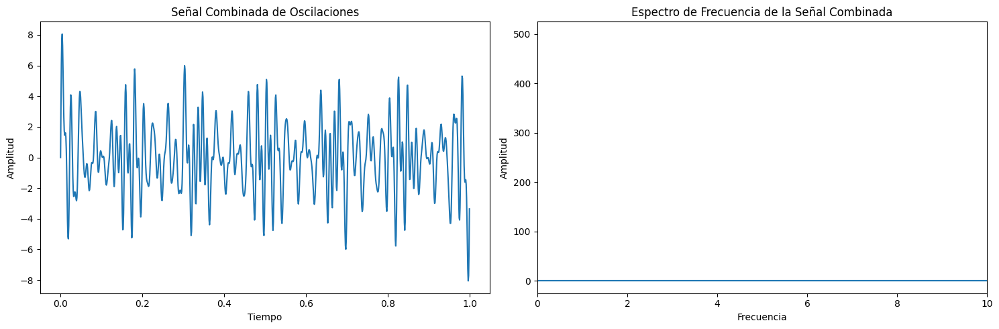

Conjunto Aleatorio Generado: [ 90 -44 -46  24 -84 -50 -96 -51 -27  40]
¿Se logró la suma objetivo? False


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_oscillation(element, time_points):
    """Genera una oscilación única para un elemento dado."""
    # La frecuencia de la oscilación podría depender del valor del elemento
    frequency = np.abs(element)
    return np.sin(2 * np.pi * frequency * time_points)

def combine_oscillations(g_set, time_points):
    """Combina las oscilaciones de todos los elementos del conjunto."""
    combined_signal = np.zeros_like(time_points)
    for element in g_set:
        combined_signal += generate_oscillation(element, time_points)
    return combined_signal

def analyze_combined_signal(combined_signal, time_points, target_sum):
    """Analiza la señal combinada para identificar la suma objetivo."""
    spectrum = np.fft.fft(combined_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])

    # Buscar en el espectro una frecuencia que corresponda a la suma objetivo
    target_frequency = target_sum
    spectrum_magnitude = np.abs(spectrum)
    if target_frequency in frequencies and spectrum_magnitude[np.where(frequencies == target_frequency)][0] > np.max(spectrum_magnitude) * 0.5:
        success = True
    else:
        success = False

    return frequencies, spectrum, success

# Parámetros
num_elements = 10
element_range = 100
target_sum = 67
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio y combinar sus oscilaciones
G_random = generate_random_set(num_elements, element_range)
combined_signal = combine_oscillations(G_random, time_points)

# Analizar la señal combinada
frequencies, spectrum, success = analyze_combined_signal(combined_signal, time_points, target_sum)

# Visualización
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(time_points, combined_signal)
plt.title("Señal Combinada de Oscilaciones")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum))
plt.title("Espectro de Frecuencia de la Señal Combinada")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)  # Limitar el rango de frecuencia para visualizar

plt.tight_layout()
plt.show()

print("Conjunto Aleatorio Generado:", G_random)
print("¿Se logró la suma objetivo?", success)


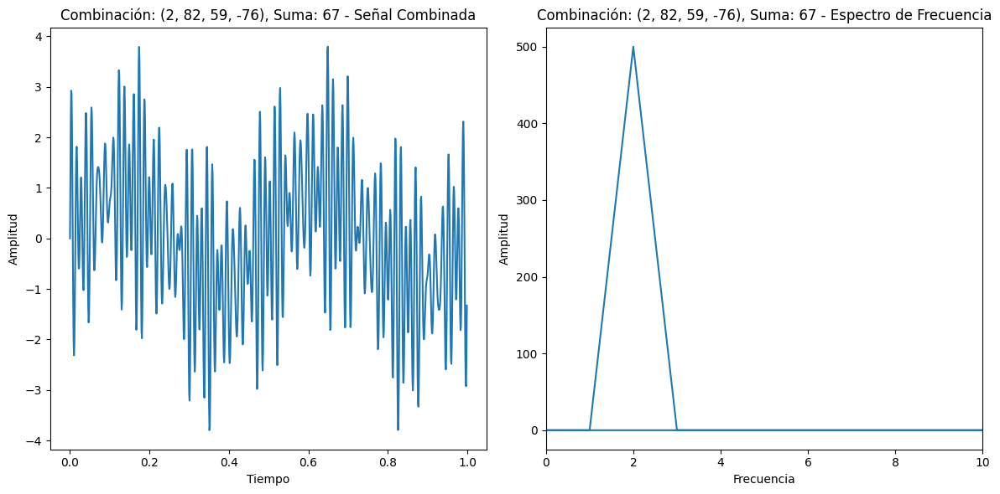

Conjunto Aleatorio Generado: [  2 -83  82  59 -40 -76]


In [ ]:
from itertools import combinations
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def generate_oscillation(element, time_points):
    frequency = np.abs(element)
    return np.sin(2 * np.pi * frequency * time_points)

def combine_oscillations(combination, time_points):
    combined_signal = np.zeros_like(time_points)
    for element in combination:
        combined_signal += generate_oscillation(element, time_points)
    return combined_signal

def analyze_combined_signal(combined_signal, time_points):
    spectrum = np.fft.fft(combined_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def plot_combined_signal(combined_signal, frequencies, spectrum, time_points, title):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(time_points, combined_signal)
    plt.title(f"{title} - Señal Combinada")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum))
    plt.title(f"{title} - Espectro de Frecuencia")
    plt.xlabel("Frecuencia")
    plt.ylabel("Amplitud")
    plt.xlim(0, 10)  # Limitar el rango de frecuencia para visualización

    plt.tight_layout()
    plt.show()

# Parámetros
num_elements = 6
element_range = 100
target_sum = 67
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio
G_random = generate_random_set(num_elements, element_range)

# Analizar y visualizar cada combinación de elementos
for r in range(1, len(G_random) + 1):
    for combo in combinations(G_random, r):
        combined_signal = combine_oscillations(combo, time_points)
        frequencies, spectrum = analyze_combined_signal(combined_signal, time_points)
        if np.isclose(sum(combo), target_sum, atol=1):
            title = f"Combinación: {combo}, Suma: {sum(combo)}"
            plot_combined_signal(combined_signal, frequencies, spectrum, time_points, title)

print("Conjunto Aleatorio Generado:", G_random)




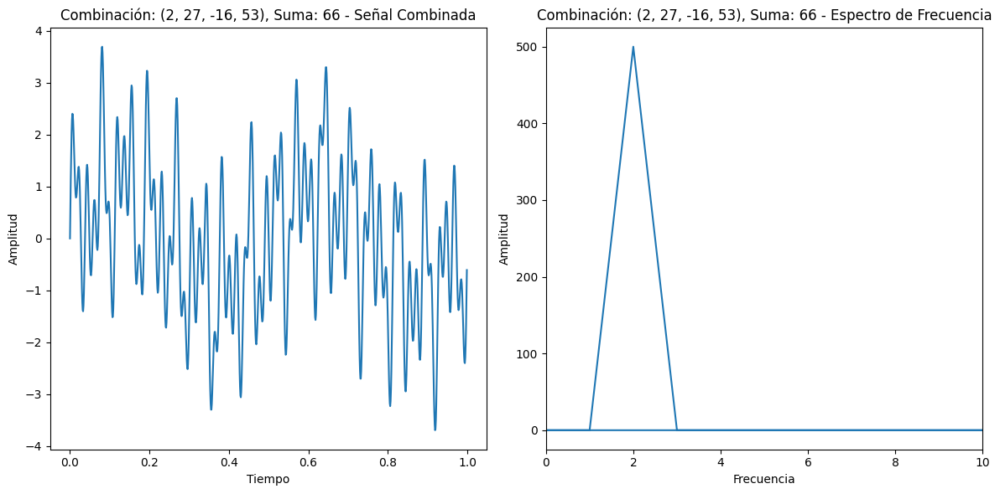

Suma objetivo alcanzada con 4 elementos: (2, 27, -16, 53)


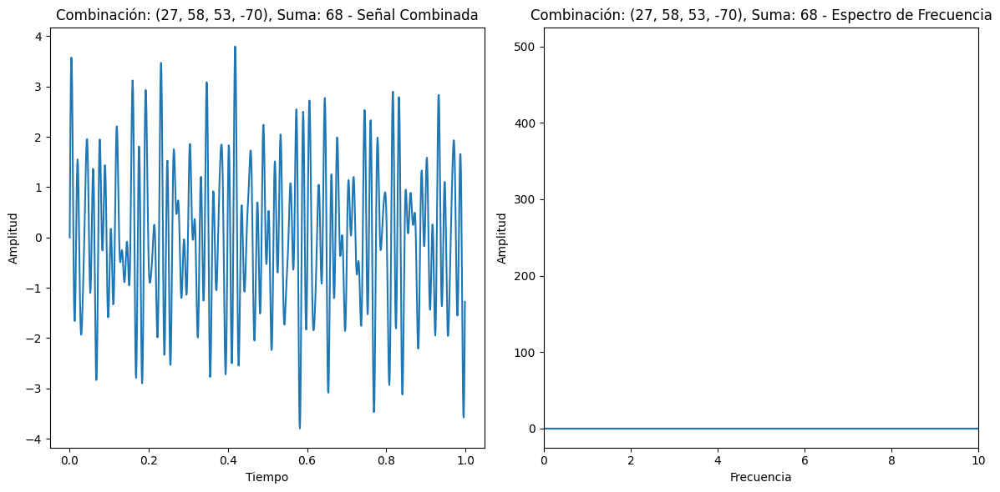

Suma objetivo alcanzada con 4 elementos: (27, 58, 53, -70)


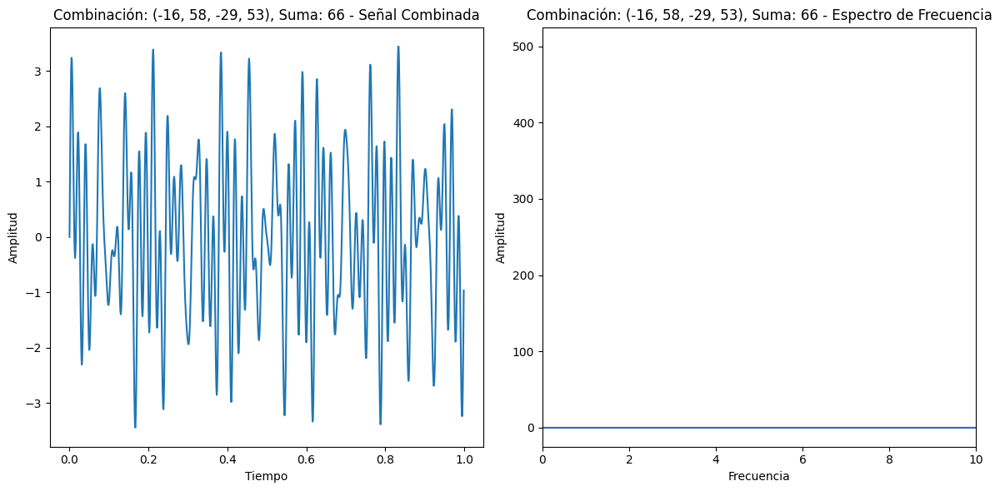

Suma objetivo alcanzada con 4 elementos: (-16, 58, -29, 53)


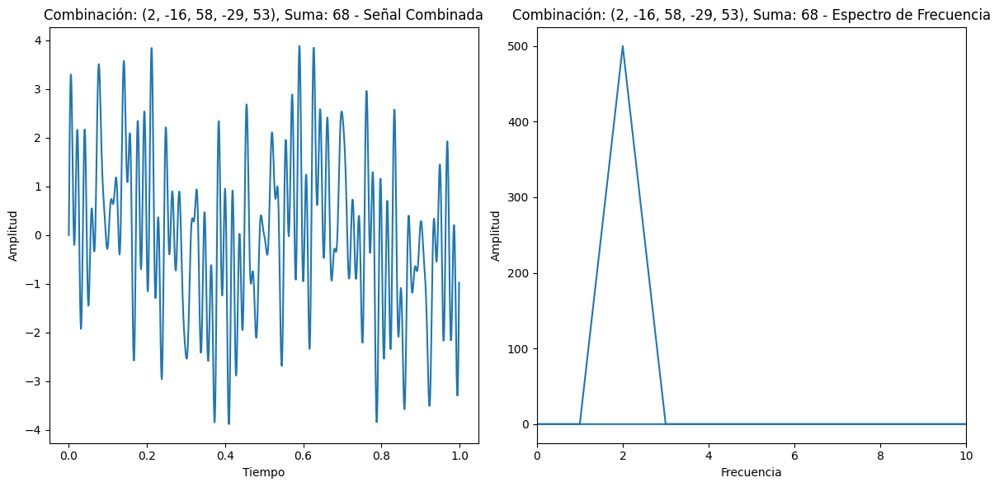

Suma objetivo alcanzada con 5 elementos: (2, -16, 58, -29, 53)


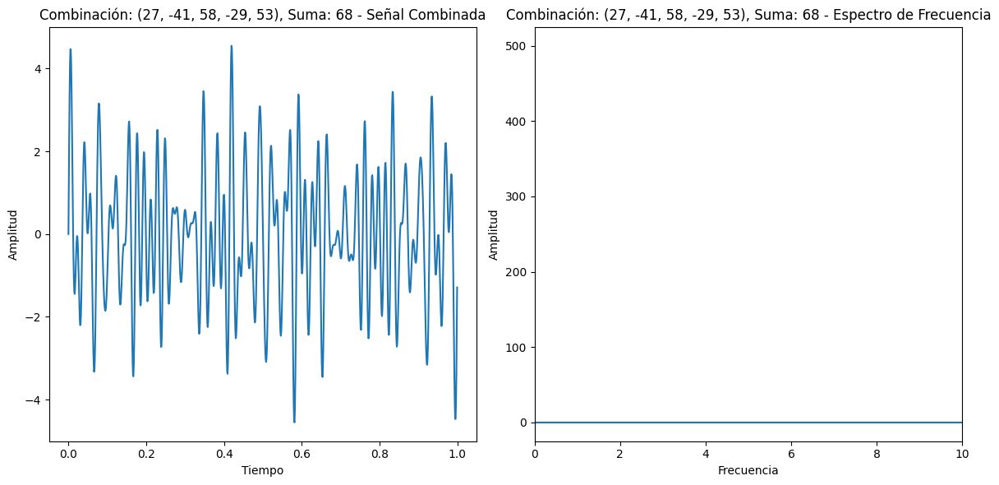

Suma objetivo alcanzada con 5 elementos: (27, -41, 58, -29, 53)


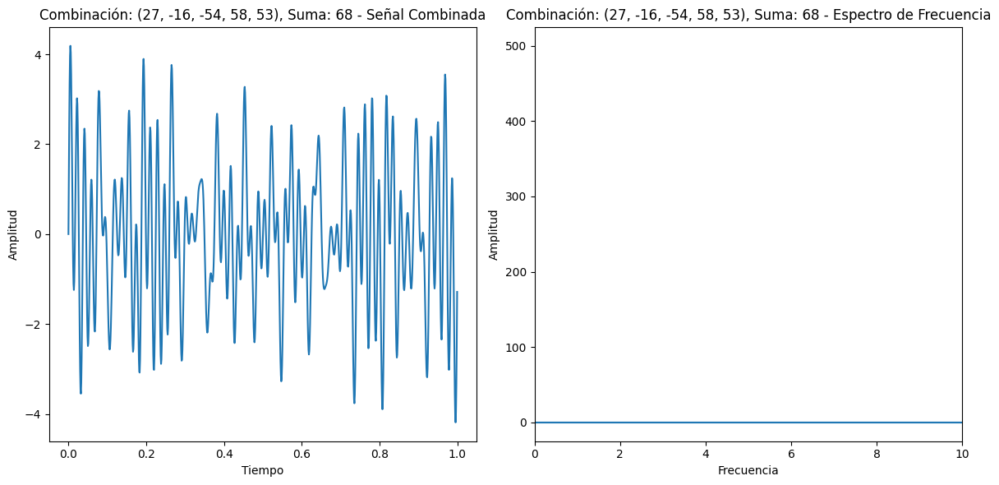

Suma objetivo alcanzada con 5 elementos: (27, -16, -54, 58, 53)


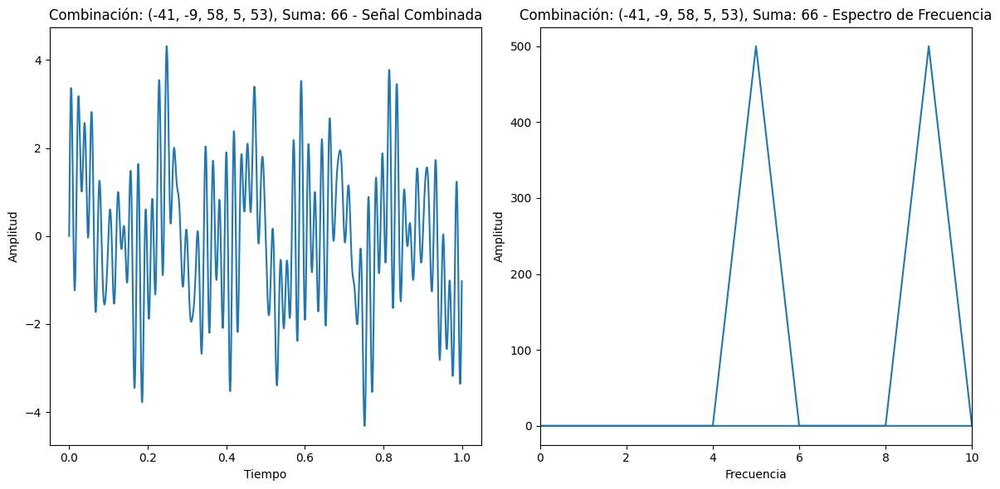

Suma objetivo alcanzada con 5 elementos: (-41, -9, 58, 5, 53)


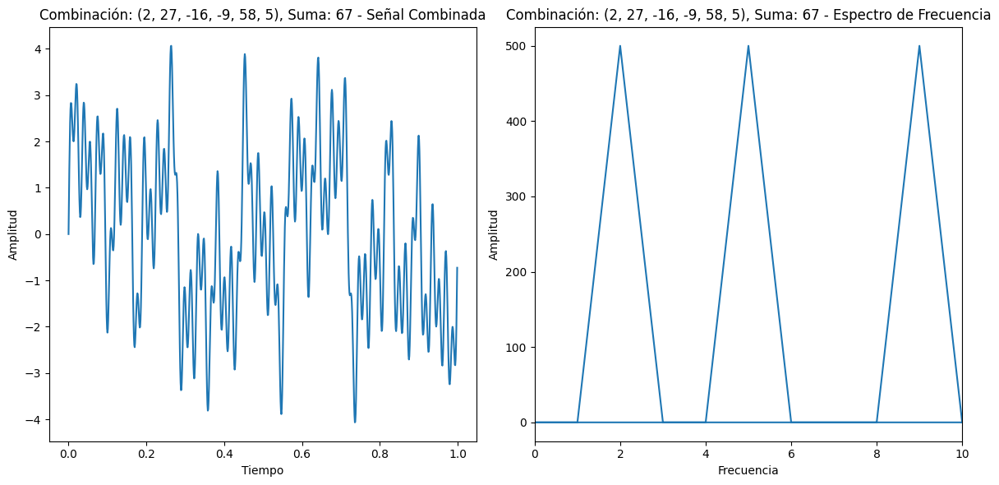

Suma objetivo alcanzada con 6 elementos: (2, 27, -16, -9, 58, 5)


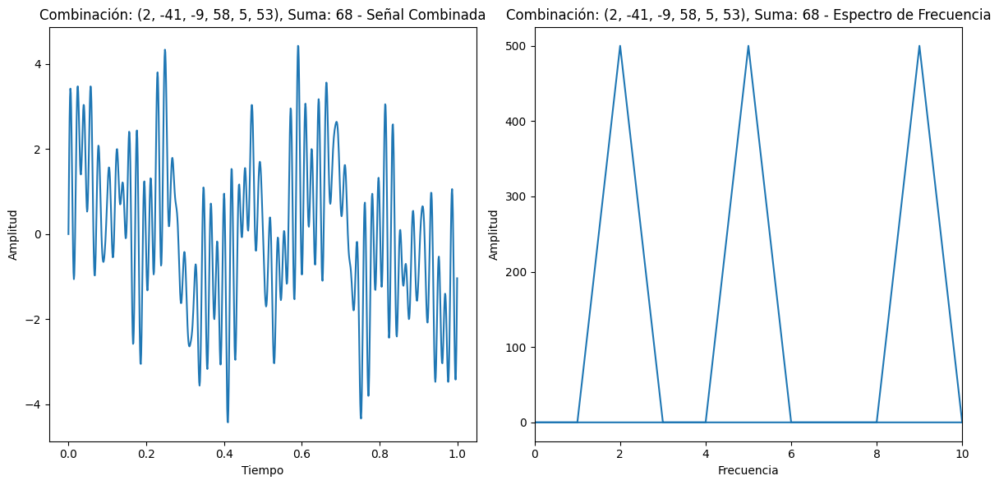

Suma objetivo alcanzada con 6 elementos: (2, -41, -9, 58, 5, 53)


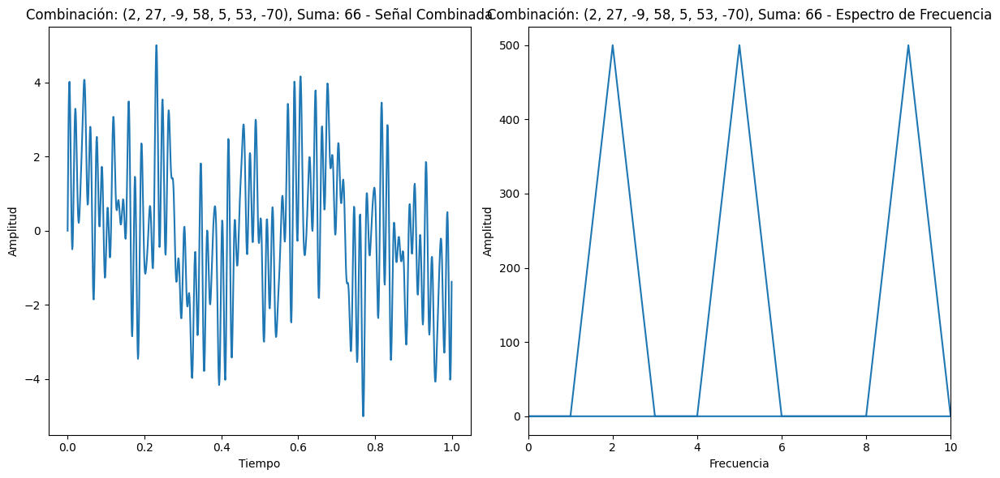

Suma objetivo alcanzada con 7 elementos: (2, 27, -9, 58, 5, 53, -70)


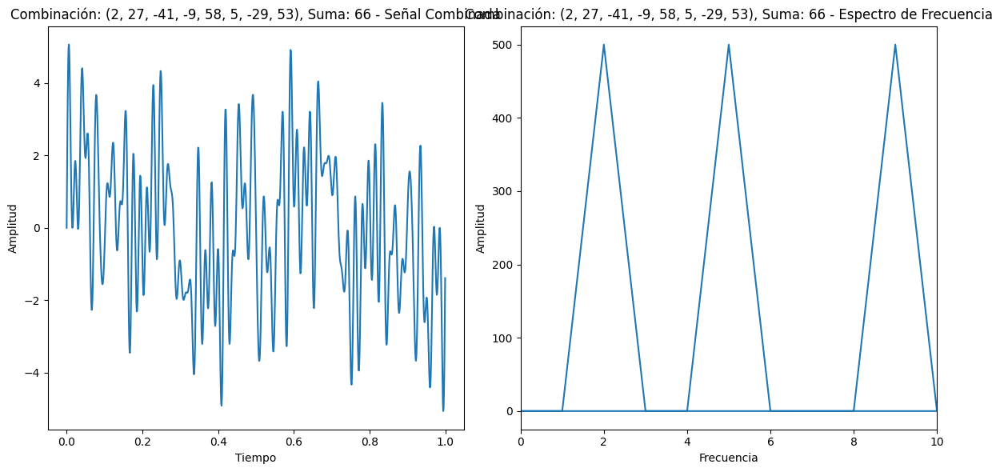

Suma objetivo alcanzada con 8 elementos: (2, 27, -41, -9, 58, 5, -29, 53)


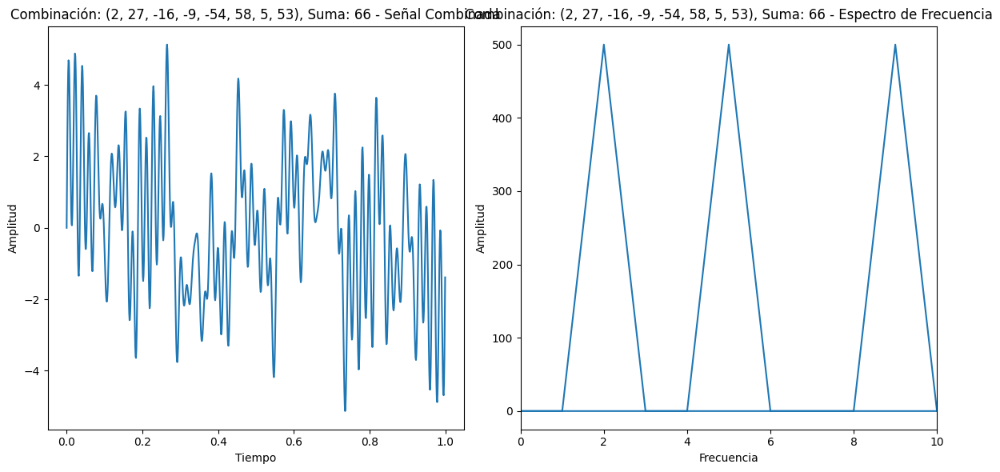

Suma objetivo alcanzada con 8 elementos: (2, 27, -16, -9, -54, 58, 5, 53)
Conjunto Aleatorio Generado: [  2  27 -41 -95 -16  -9 -54  58   5 -29  53 -70]


In [ ]:
from itertools import combinations
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def generate_oscillation(element, time_points):
    frequency = np.abs(element)
    return np.sin(2 * np.pi * frequency * time_points)

def combine_oscillations(combination, time_points):
    combined_signal = np.zeros_like(time_points)
    for element in combination:
        combined_signal += generate_oscillation(element, time_points)
    return combined_signal

def analyze_combined_signal(combined_signal, time_points):
    spectrum = np.fft.fft(combined_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def plot_combined_signal(combined_signal, frequencies, spectrum, time_points, title):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(time_points, combined_signal)
    plt.title(f"{title} - Señal Combinada")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum))
    plt.title(f"{title} - Espectro de Frecuencia")
    plt.xlabel("Frecuencia")
    plt.ylabel("Amplitud")
    plt.xlim(0, 10)  # Limitar el rango de frecuencia para visualización

    plt.tight_layout()
    plt.show()

# Parámetros
num_elements = 12
element_range = 100
target_sum = 67
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio
G_random = generate_random_set(num_elements, element_range)
success = False

# Analizar y visualizar cada combinación de elementos
for r in range(1, len(G_random) + 1):
    for combo in combinations(G_random, r):
        combined_signal = combine_oscillations(combo, time_points)
        frequencies, spectrum = analyze_combined_signal(combined_signal, time_points)
        if np.isclose(sum(combo), target_sum, atol=1):
            title = f"Combinación: {combo}, Suma: {sum(combo)}"
            plot_combined_signal(combined_signal, frequencies, spectrum, time_points, title)
            success = True
            print(f"Suma objetivo alcanzada con {len(combo)} elementos: {combo}")

if not success:
    print("No se encontró ninguna combinación que sume al objetivo.")

print("Conjunto Aleatorio Generado:", G_random)


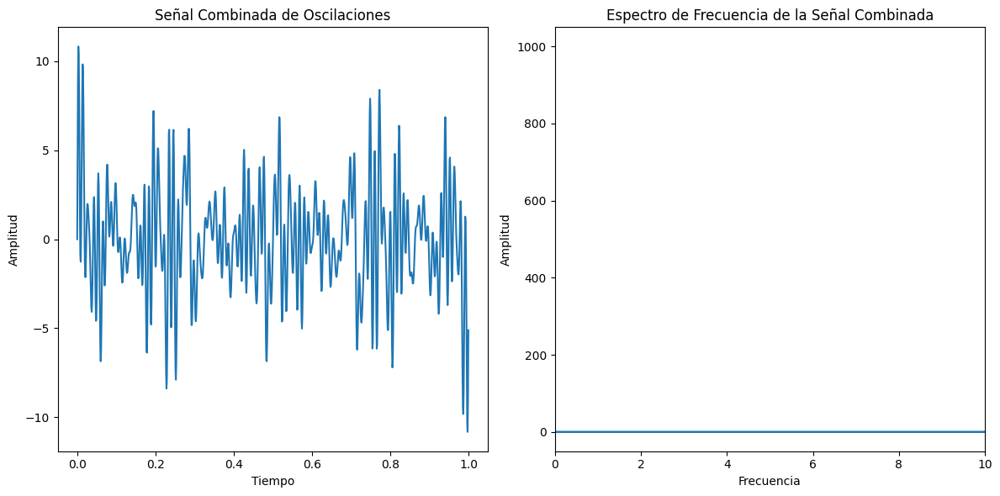

Conjunto Aleatorio Generado: [-94 -82 -43  15 -74  78 -78 -30 -26 -12  16  83 -22  99  95]
Posibles contribuyentes a la suma objetivo: [-94, -82, 78, -78, 83]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def generate_oscillation(element, time_points):
    frequency = np.abs(element)
    return np.sin(2 * np.pi * frequency * time_points)

def combine_oscillations(g_set, time_points):
    combined_signal = np.zeros_like(time_points)
    for element in g_set:
        combined_signal += generate_oscillation(element, time_points)
    return combined_signal

def analyze_combined_signal(combined_signal, time_points):
    spectrum = np.fft.fft(combined_signal)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def identify_contributors(frequencies, spectrum, g_set, target_sum):
    """Identificar posibles contribuyentes a la suma objetivo basado en el espectro."""
    significant_frequencies = frequencies[np.abs(spectrum) > np.max(np.abs(spectrum)) * 0.5]
    contributors = []
    for freq in significant_frequencies:
        # Buscar elementos cuyas frecuencias coincidan con las frecuencias significativas
        for element in g_set:
            if np.isclose(np.abs(element), freq, atol=0.1):
                contributors.append(element)
    return list(set(contributors))

# Parámetros
num_elements = 15
element_range = 100
target_sum = 67
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar un conjunto aleatorio
G_random = generate_random_set(num_elements, element_range)

# Combinar y analizar las oscilaciones
combined_signal = combine_oscillations(G_random, time_points)
frequencies, spectrum = analyze_combined_signal(combined_signal, time_points)

# Identificar contribuyentes a la suma objetivo
contributors = identify_contributors(frequencies, spectrum, G_random, target_sum)

# Visualización de la señal compuesta y su espectro de frecuencia
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, combined_signal)
plt.title("Señal Combinada de Oscilaciones")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum))
plt.title("Espectro de Frecuencia de la Señal Combinada")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.xlim(0, 10)  # Limitar el rango de frecuencia para visualización

plt.tight_layout()
plt.show()

print("Conjunto Aleatorio Generado:", G_random)
print("Posibles contribuyentes a la suma objetivo:", contributors)


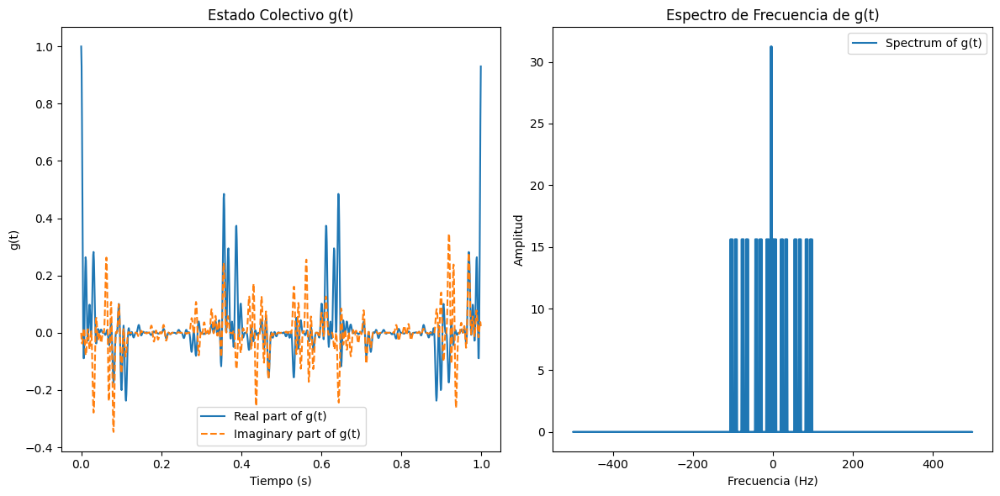

Conjunto Aleatorio Generado: [-62  -2 -28  98 -11  -3]
Sumas Posibles Interpretadas: {0: 15.624999999999847, 3: 15.624999999999803, 5: 15.624999999999854, 6: 15.624999999999968, 8: 15.62499999999999, 20: 15.624999999999872, 22: 15.624999999999837, 23: 15.624999999999956, 25: 15.624999999999911, 31: 15.624999999999892, 33: 15.624999999999922, 34: 15.625000000000028, 36: 15.625000000000034, 54: 15.624999999999808, 56: 15.624999999999845, 57: 15.624999999999895, 59: 15.624999999999973, 65: 15.624999999999961, 67: 15.624999999999954, 68: 15.62500000000017, 70: 15.625000000000183, 82: 15.624999999999856, 84: 15.624999999999828, 85: 15.624999999999996, 87: 15.624999999999968, 93: 15.625000000000055, 95: 15.625000000000071, 96: 15.625000000000206, 98: 15.625000000000222, -95: 15.624999999999918, -93: 15.624999999999936, -92: 15.62499999999984, -90: 15.6249999999998, -78: 15.625000000000101, -76: 15.625000000000064, -75: 15.625000000000004, -73: 15.625000000000004, -67: 15.624999999999886, -65

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    frequency_amplitudes = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
                frequency_amplitudes[freq] = amp
    return possible_sums, frequency_amplitudes

def track_contributing_elements(frequency_amplitudes, target_sum, f0):
    """Rastrea los elementos que contribuyen a la suma objetivo."""
    contributing_elements = []
    for freq, amp in frequency_amplitudes.items():
        if round(freq * f0) == target_sum:
            contributing_elements.append((freq, amp))
    return contributing_elements

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums, frequency_amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0)

    contributing_elements = track_contributing_elements(frequency_amplitudes, target_sum, f0)
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success, contributing_elements

# Parámetros para la generación del conjunto
num_elements = 6  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
f0 = 1.0  # Frecuencia fundamental
target_sum = 67  # Suma objetivo para el SSP

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success, contributing_elements = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("Elementos Contribuyentes a la Suma Objetivo:", contributing_elements)
print("\033[1m" + "¿Se logró la suma objetivo? " + str(success) + "\033[0m")  # Imprimir en negrita


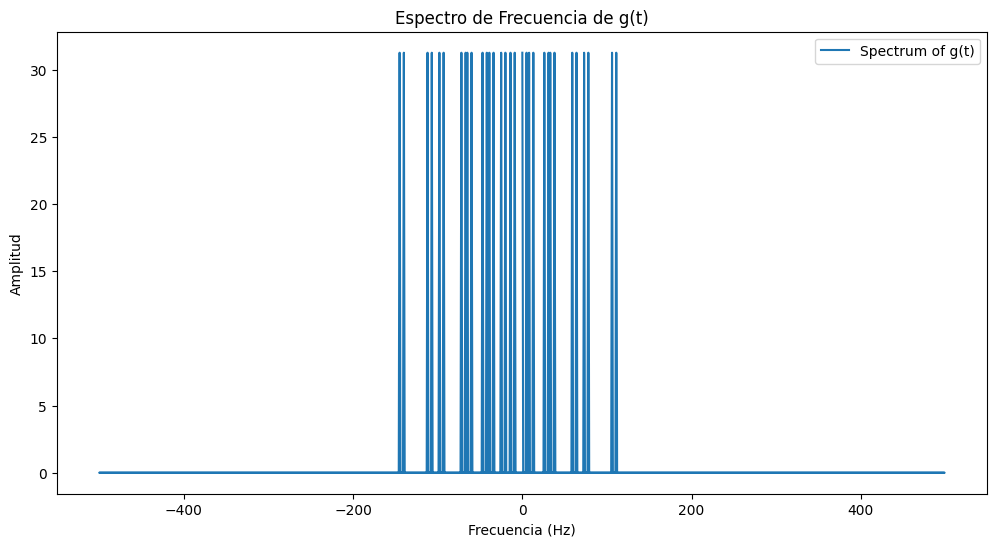

Conjunto Aleatorio Generado: [ 73 -47   5  33 -98]
Elementos que posiblemente contribuyen a la suma objetivo: [5]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    individual_contributions = np.zeros((len(g_set), len(time_points)), dtype=np.complex128)

    for idx, a_j in enumerate(g_set):
        w_j = 2 * np.pi * a_j * f0
        contribution = (1 + np.exp(1j * w_j * time_points))
        g_t *= contribution
        individual_contributions[idx] = contribution

    g_t *= 2**(-n)
    return g_t, individual_contributions

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def analyze_contributions(individual_contributions, frequencies, target_sum, g_set):
    # Análisis de las contribuciones individuales
    element_contributions = {}
    for idx, element in enumerate(g_set):
        _, spectrum = frequency_spectrum(individual_contributions[idx], time_points)
        # Buscar picos en el espectro
        peaks = np.where(np.abs(spectrum) > 0.1)  # Umbral arbitrario
        freq_peaks = frequencies[peaks]
        element_contributions[element] = freq_peaks

    # Suposición de los elementos que contribuyen a la suma objetivo
    contributing_elements = []
    for element, peaks in element_contributions.items():
        if any(np.isclose(peaks, target_sum, atol=1)):  # Tolerancia arbitraria
            contributing_elements.append(element)

    return contributing_elements

# Parámetros para la generación del conjunto
num_elements = 5
element_range = 100
f0 = 1.0
target_sum = 6

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)

# Realizar la simulación y obtener contribuciones individuales
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t, individual_contributions = calculate_collective_state_random_set(G_random, f0, time_points)
frequencies, _ = frequency_spectrum(g_t, time_points)

# Analizar las contribuciones individuales
contributing_elements = analyze_contributions(individual_contributions, frequencies, target_sum, G_random)

# Visualización
plt.figure(figsize=(12, 6))
plt.plot(frequencies, np.abs(_), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()
plt.show()

print("Conjunto Aleatorio Generado:", G_random)
print("Elementos que posiblemente contribuyen a la suma objetivo:", contributing_elements)

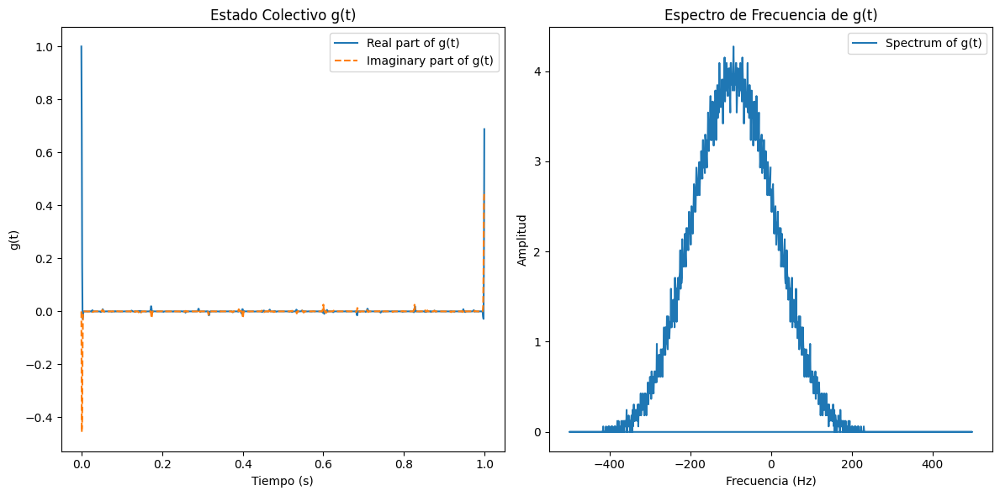

Conjunto Aleatorio Generado: [-69  40  15 -13 -80 -70  75  35 -41  58 -82 -38 -23   7   0]
¿Se logró la suma objetivo? False


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Visualización de g(t) y su espectro
    plt.figure(figsize=(12, 6))

    # g(t)
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    # Espectro de g(t)
    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Comprobar si se logra la suma objetivo
    success = False  # Código para determinar si se alcanza la suma objetivo

    return g_set, success

# Parámetros para la generación del conjunto
num_elements = 15
element_range = 100
f0 = 1.0
target_sum = 43

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, success = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", generated_set)
print("¿Se logró la suma objetivo? " + str(success))

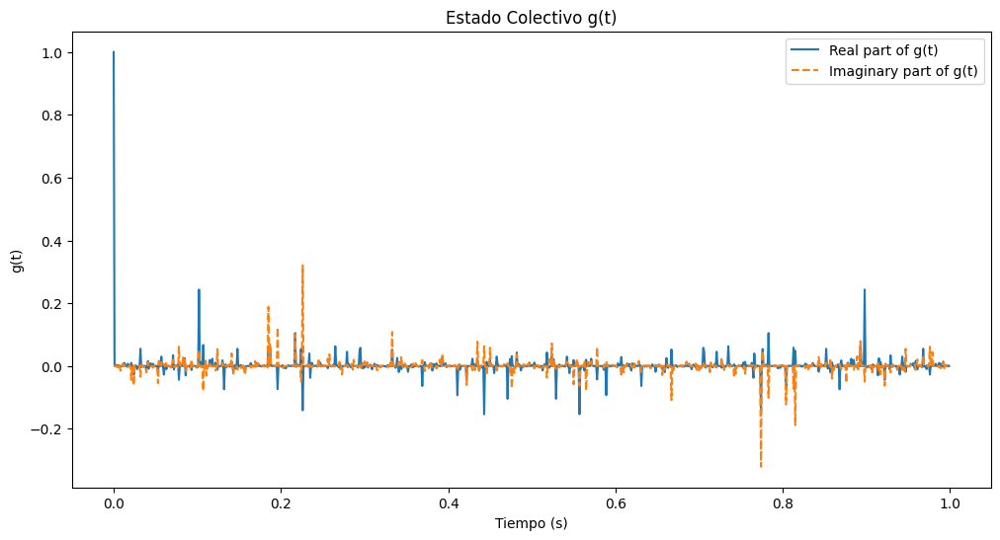

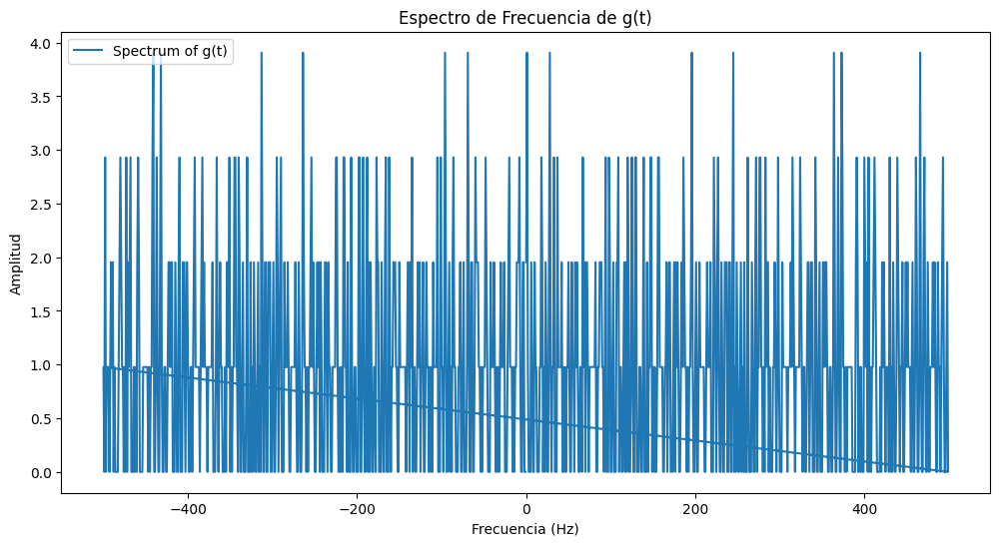

Conjunto Aleatorio Generado: [ 567  129 -540 -336 -637 -128 -756  531 -616  718]
Cargas acumuladas por elemento: [5.25257886e-13 4.84238520e-13 1.81275864e-12 1.51485256e-11
 8.20091651e-13 3.89284913e-13 1.58918320e-11 1.30325484e-12
 2.04784276e-12 1.13240456e-11]
Elementos que contribuyen a la suma objetivo: [-336, -756, 718]
¿Se logró la suma objetivo? False


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points, charges):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for idx, a_j in enumerate(g_set):
        w_j = 2 * np.pi * a_j * f0
        contribution = np.exp(1j * w_j * time_points)
        g_t *= (1 + contribution)
        charges[idx] += np.abs(np.sum(contribution))  # Actualizar el registro de carga
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(g_t), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def identify_contributing_elements(charges, g_set, threshold):
    """Identifica los elementos que contribuyen significativamente a la suma objetivo."""
    contributing_elements = []
    for idx, charge in enumerate(charges):
        if charge > threshold:
            contributing_elements.append(g_set[idx])
    return contributing_elements

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    charges = np.zeros(len(g_set))  # Inicializar registros de carga
    g_t = calculate_collective_state_random_set(g_set, f0, time_points, charges)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

    # Identificar elementos que contribuyen a la suma objetivo
    significant_threshold = np.max(charges) * 0.5  # Definir umbral
    contributing_elements = identify_contributing_elements(charges, g_set, significant_threshold)

    # Comprobar si se logra la suma objetivo
    success = sum(contributing_elements) == target_sum

    return g_set, charges, contributing_elements, success

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 1000
f0 = 1.0
target_sum = 67

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, charges, contributing_elements, success = analyze_subset_sum(G_random, f0, element_range, target_sum)

print("Conjunto Aleatorio Generado:", generated_set)
print("Cargas acumuladas por elemento:", charges)
print("Elementos que contribuyen a la suma objetivo:", contributing_elements)
print("\033[1m" + "¿Se logró la suma objetivo? " + str(success) + "\033[0m")





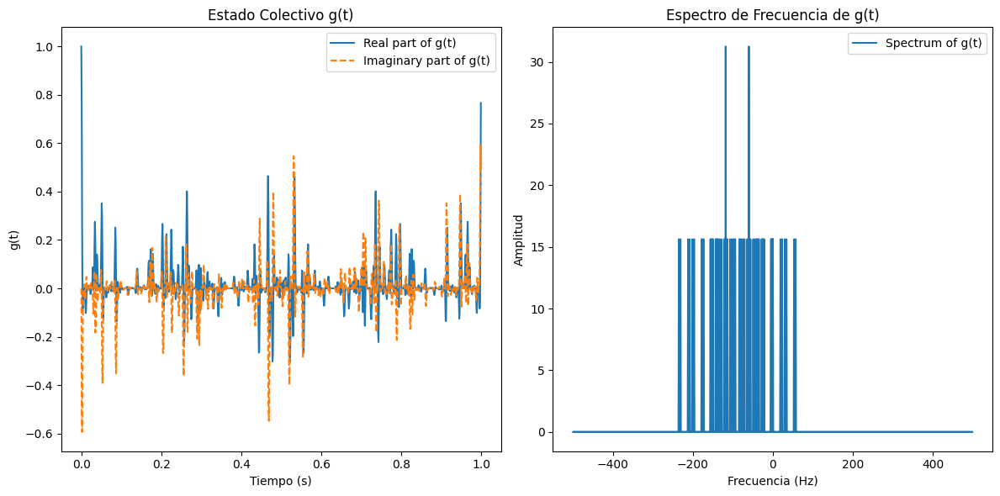

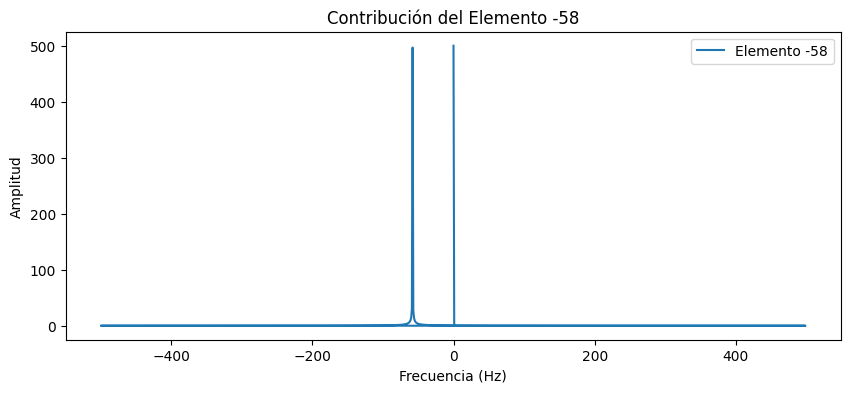

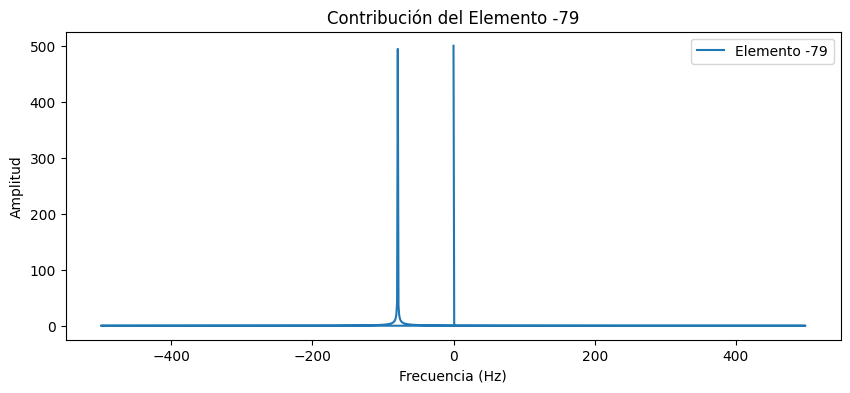

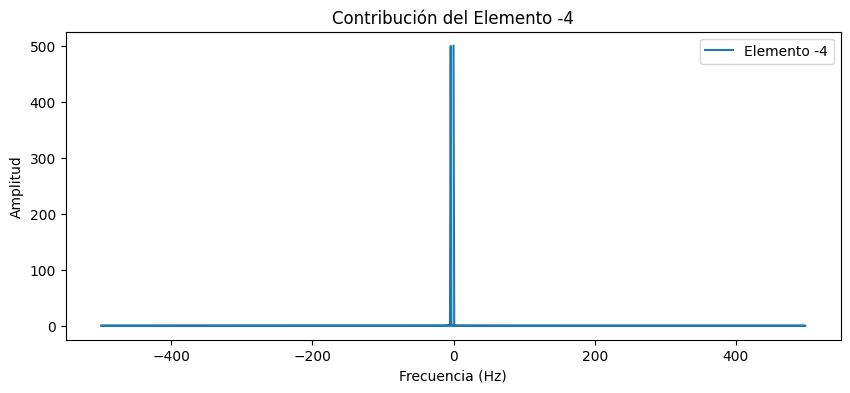

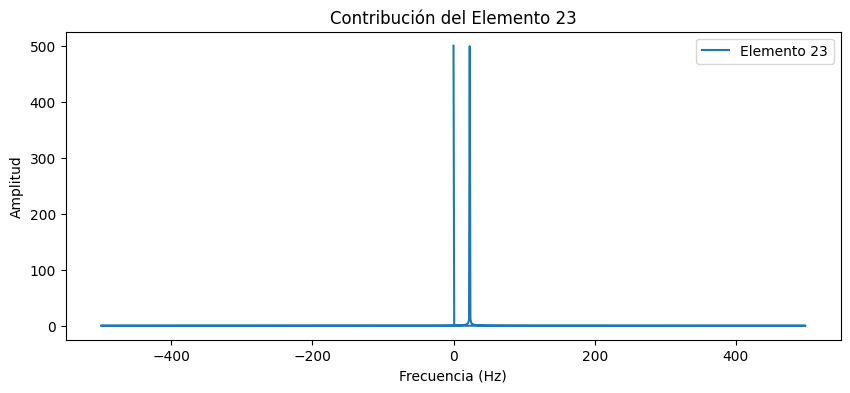

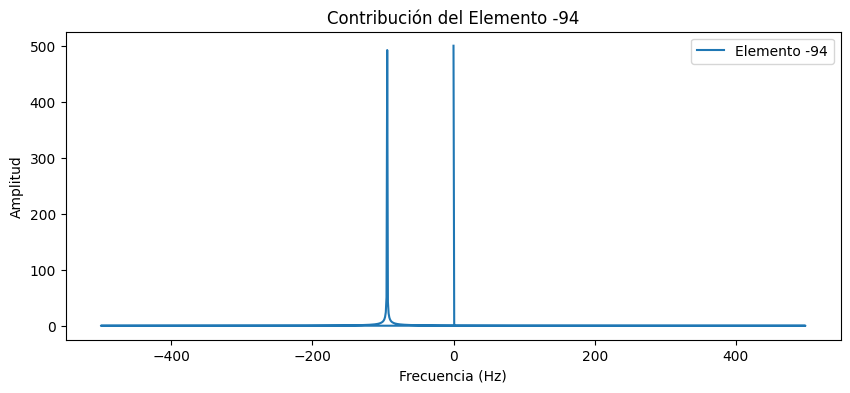

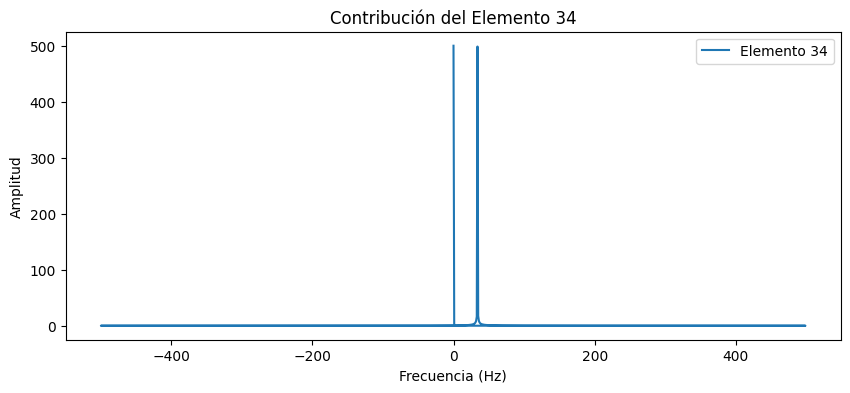

Conjunto Aleatorio Generado: [-58 -79  -4  23 -94  34]
Sumas Posibles Interpretadas: {0: 15.625000000000062, 19: 15.624999999999925, 23: 15.625000000000021, 30: 15.625000000000089, 34: 15.625000000000108, 53: 15.625, 57: 15.62500000000004, -99: 15.624999999999929, -98: 15.625000000000043, -95: 15.624999999999968, -94: 15.625000000000128, -84: 15.624999999999918, -83: 15.625000000000082, -80: 15.62500000000001, -79: 15.625000000000037, -75: 15.624999999999973, -71: 15.6249999999999, -64: 15.625000000000075, -62: 15.624999999999922, -60: 31.250000000000064, -58: 15.625000000000028, -56: 15.625000000000028, -49: 15.624999999999996, -45: 15.624999999999964, -41: 15.624999999999956, -39: 15.624999999999995, -37: 15.624999999999943, -35: 15.625000000000057, -28: 15.625000000000053, -26: 15.624999999999996, -24: 15.625000000000009, -22: 15.625000000000096, -5: 15.62500000000002, -4: 15.625000000000064, -1: 15.625000000000014}
¿Se logró la suma objetivo?: True


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def calculate_state_single_element(element, f0, time_points):
    w = 2 * np.pi * element * f0
    g_t = (1 + np.exp(1j * w * time_points)) * 2**(-1)
    return g_t

def monitor_individual_contributions(g_set, f0, time_points):
    contributions = {}
    for element in g_set:
        g_t = calculate_state_single_element(element, f0, time_points)
        frequencies, spectrum = frequency_spectrum(g_t, time_points)
        contributions[element] = (frequencies, np.abs(spectrum))
    return contributions

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums.keys()

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

# Parámetros para la generación del conjunto
num_elements = 6
element_range = 100
f0 = 1.0
target_sum = 30

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)
contributions = monitor_individual_contributions(G_random, f0, time_points)

# Visualizar las contribuciones
for element, (frequencies, spectrum) in contributions.items():
    plt.figure(figsize=(10, 4))
    plt.plot(frequencies, spectrum, label=f'Elemento {element}')
    plt.title(f'Contribución del Elemento {element}')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("¿Se logró la suma objetivo?:", success)

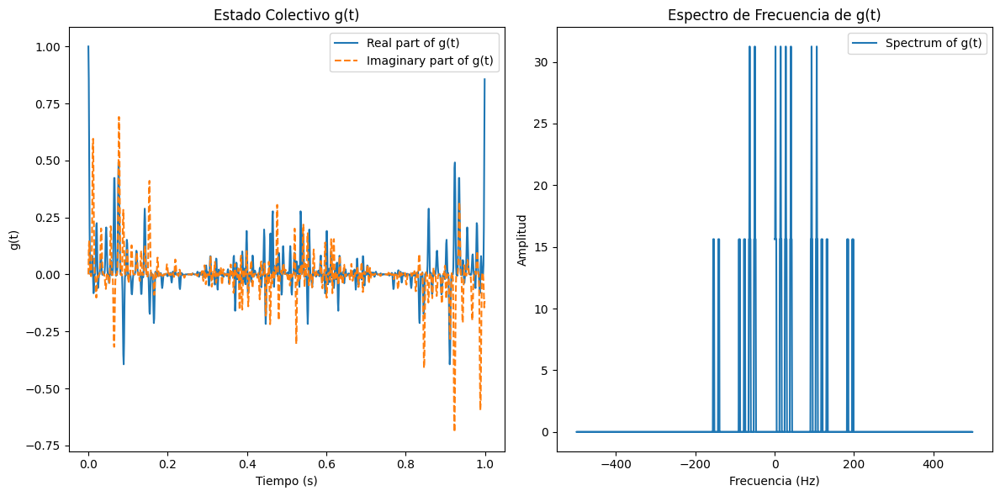

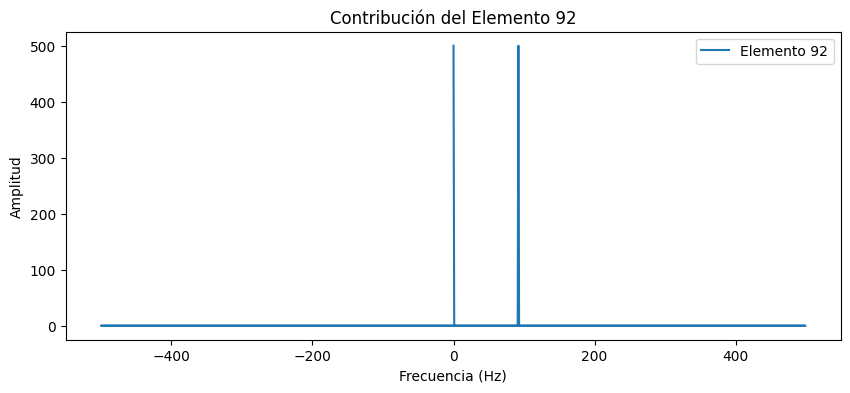

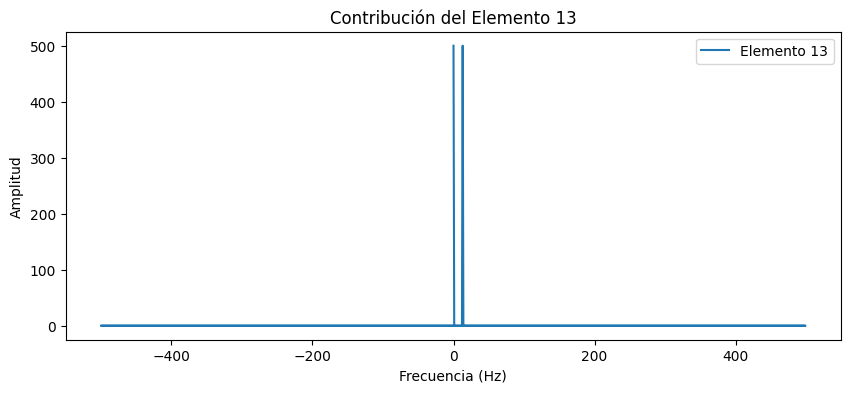

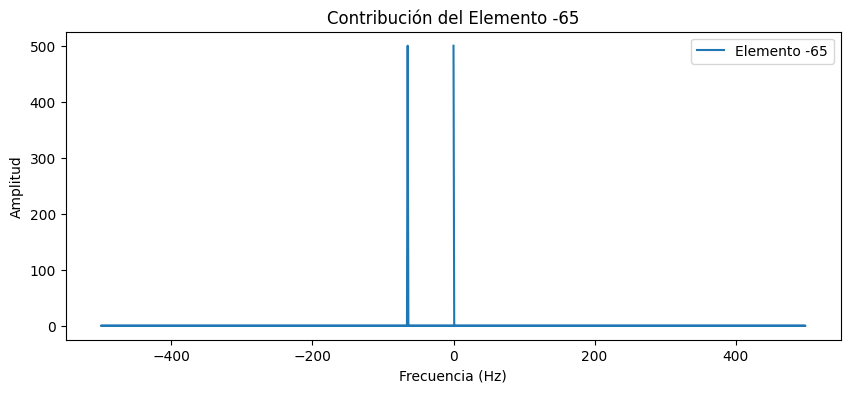

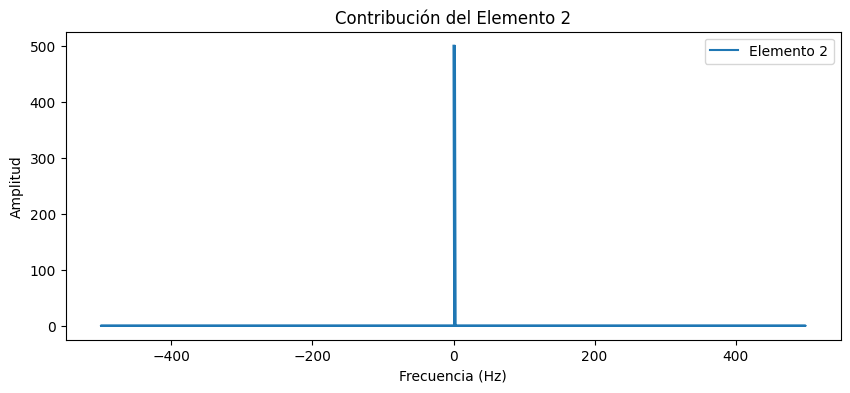

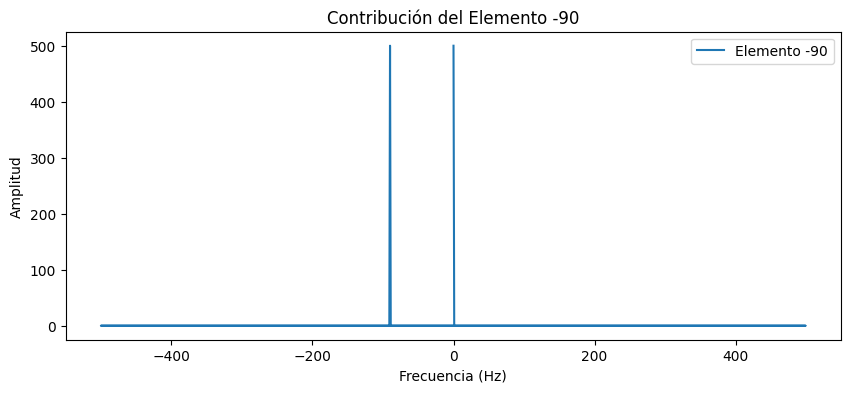

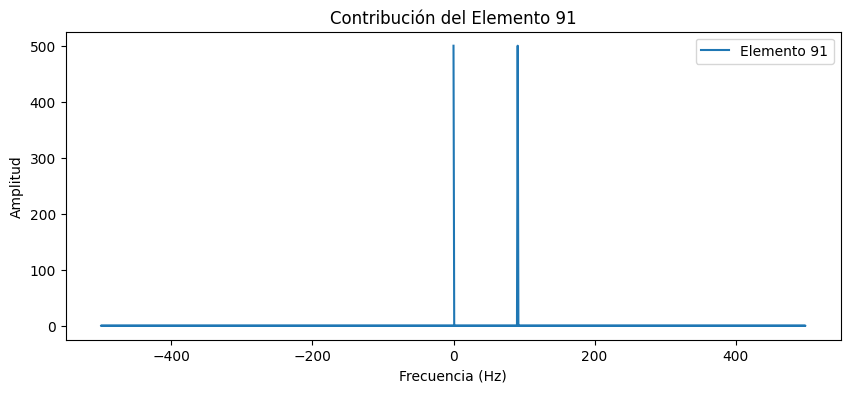

Conjunto Aleatorio Generado: [ 92  13 -65   2 -90  91]
Sumas Posibles Interpretadas: {0: 15.624999999999927, 1: 15.624999999999755, 2: 31.24999999999978, 3: 15.624999999999911, 4: 15.624999999999963, 13: 15.625000000000053, 14: 15.624999999999975, 15: 31.2499999999999, 16: 15.625000000000073, 17: 15.625000000000039, 26: 15.625000000000028, 27: 15.624999999999972, 28: 31.249999999999837, 29: 15.624999999999948, 30: 15.624999999999982, 39: 15.625000000000123, 40: 15.624999999999957, 41: 31.24999999999998, 42: 15.624999999999915, 43: 15.625000000000046, 91: 15.624999999999607, 92: 15.624999999999652, 93: 31.249999999999698, 94: 15.62499999999995, 95: 15.625000000000039, -90: 15.624999999999993, -88: 15.625000000000005, -77: 15.625000000000023, -75: 15.624999999999925, -65: 15.625000000000334, -64: 15.624999999999975, -63: 31.24999999999993, -62: 15.624999999999797, -61: 15.624999999999897, -52: 15.625000000000123, -51: 15.625000000000004, -50: 31.249999999999872, -49: 15.624999999999865, 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def calculate_state_single_element(element, f0, time_points):
    w = 2 * np.pi * element * f0
    g_t = (1 + np.exp(1j * w * time_points)) * 2**(-1)
    return g_t

def monitor_individual_contributions(g_set, f0, time_points):
    contributions = {}
    for element in g_set:
        g_t = calculate_state_single_element(element, f0, time_points)
        frequencies, spectrum = frequency_spectrum(g_t, time_points)
        contributions[element] = (frequencies, np.abs(spectrum))
    return contributions

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums.keys()

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

# Parámetros para la generación del conjunto
num_elements = 6
element_range = 100
f0 = 1.0
target_sum = 30

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)
contributions = monitor_individual_contributions(G_random, f0, np.linspace(0, 1, 1000, endpoint=False))

# Visualizar las contribuciones
for element, (frequencies, spectrum) in contributions.items():
    plt.figure(figsize=(10, 4))
    plt.plot(frequencies, spectrum, label=f'Elemento {element}')
    plt.title(f'Contribución del Elemento {element}')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("¿Se logró la suma objetivo?:", success)



Colapso detectado: False
No se detectó colapso de onda relacionado con la suma objetivo.


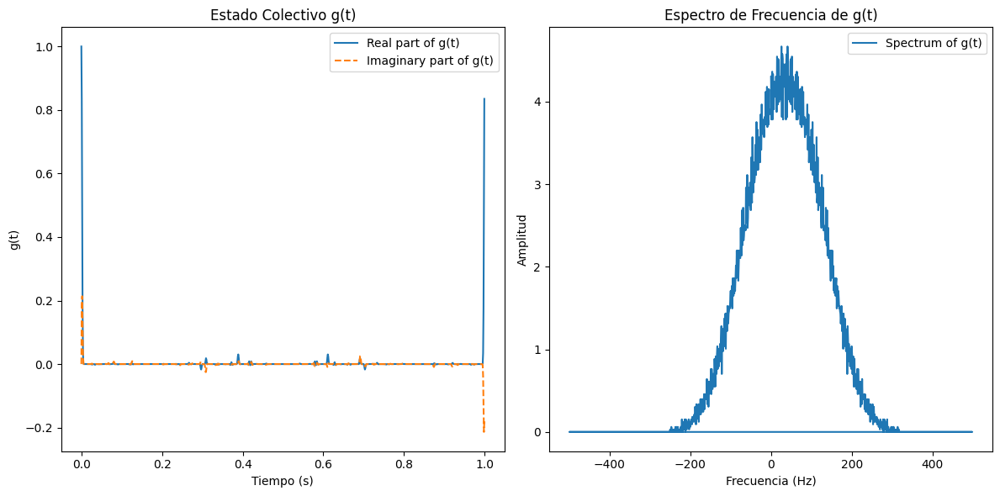

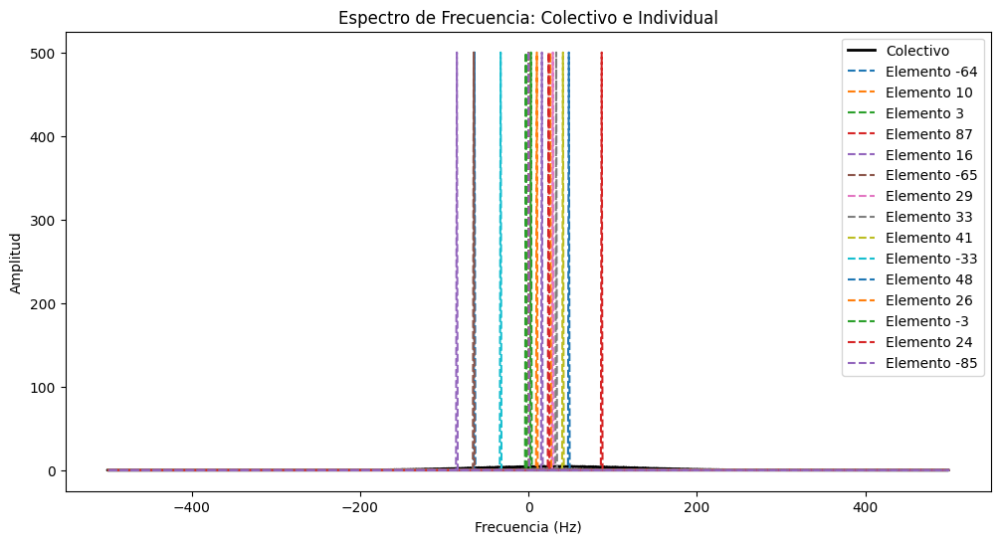

Conjunto Aleatorio Generado: [-64  10   3  87  16 -65  29  33  41 -33  48  26  -3  24 -85]
Sumas Posibles Interpretadas (Colectivo): {0: 4.302978515624923, 1: 3.7841796874999214, 2: 4.302978515624924, 3: 4.364013671874922, 4: 3.784179687499922, 5: 4.333496093749927, 6: 4.0588378906249245, 7: 3.906249999999922, 8: 4.2419433593749245, 9: 4.089355468749925, 10: 4.211425781249922, 11: 4.0588378906249245, 12: 4.302978515624925, 13: 4.302978515624922, 14: 3.875732421874922, 15: 4.547119140624924, 16: 4.455566406249922, 17: 3.967285156249921, 18: 4.516601562499925, 19: 4.486083984374927, 20: 3.9978027343749223, 21: 4.180908203124929, 22: 4.272460937499927, 23: 4.302978515624922, 24: 4.028320312499927, 25: 4.425048828124927, 26: 4.669189453124927, 27: 3.8146972656249263, 28: 4.5776367187499325, 29: 4.5166015624999325, 30: 3.7841796874999236, 31: 4.455566406249935, 32: 4.364013671874931, 33: 4.180908203124925, 34: 4.180908203124935, 35: 4.364013671874932, 36: 4.4555664062499325, 37: 3.784179687

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    n = len(g_set)
    if np.isscalar(time_points):  # Si time_points es un solo valor, no un arreglo
        time_points = np.array([time_points])  # Convertirlo en un arreglo de NumPy
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        for t_idx, t in enumerate(time_points):
            g_t[t_idx] *= (1 + np.exp(1j * w_j * t))
    g_t *= 2**(-n)
    return g_t

def calculate_state_single_element(element, f0, time_points):
    w = 2 * np.pi * element * f0
    g_t = (1 + np.exp(1j * w * time_points)) * 2**(-1)
    return g_t

def monitor_individual_contributions(g_set, f0, time_points):
    contributions = {}
    for element in g_set:
        g_t = calculate_state_single_element(element, f0, time_points)
        frequencies, spectrum = frequency_spectrum(g_t, time_points)
        contributions[element] = (frequencies, np.abs(spectrum))
    return contributions

#def frequency_spectrum(g_t, time_points):
 #   spectrum = np.fft.fft(g_t)
  #  frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
   # return frequencies, spectrum

def frequency_spectrum(g_t, time_points):
    if len(time_points) < 2:
        raise ValueError("time_points debe tener al menos dos elementos para calcular el espectro de frecuencia.")
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=(time_points[1] - time_points[0]))
    return frequencies, spectrum


def interpret_spectrum(frequencies, spectrum, element_range, f0):
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range and amp > 1e-5:
            possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    time_points = np.linspace(0, 1, 1000, endpoint=False)
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums.keys()

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

# Integración del análisis y visualización mejorada
def analyze_and_visualize_contributions(g_set, f0, time_points, target_sum, element_range):
    collective_g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    collective_freqs, collective_spectrum = frequency_spectrum(collective_g_t, time_points)
    individual_contributions = monitor_individual_contributions(g_set, f0, time_points)

    plt.figure(figsize=(12, 6))
    plt.plot(collective_freqs, np.abs(collective_spectrum), label='Colectivo', linewidth=2, color='black')
    for element, (freqs, spectrum) in individual_contributions.items():
        plt.plot(freqs, np.abs(spectrum), label=f'Elemento {element}', linestyle='--')
    plt.title('Espectro de Frecuencia: Colectivo e Individual')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

    possible_sums = interpret_spectrum(collective_freqs, collective_spectrum, element_range, f0)
    success = target_sum in possible_sums.keys()
    return possible_sums, success

def detect_wave_collapse(g_set, f0, time_points, target_sum, element_range):
    """
    Detecta el colapso de onda en el espectro de frecuencia y determina si se ha alcanzado la suma objetivo.
    """
    collapse_detected = False
    collapse_time = None
    contributing_elements = []
    for time_point in time_points:
        g_t = calculate_collective_state_random_set(g_set, f0, time_point)
        frequencies, spectrum = frequency_spectrum(g_t, [time_point, time_point + (time_points[1] - time_points[0])])  # Ajuste para calcular correctamente el espectro
        possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

        # Detectar si la suma objetivo se ha alcanzado en este punto del tiempo
        if target_sum in possible_sums.keys():
            collapse_detected = True
            collapse_time = time_point

            # Identificar los elementos que contribuyen al colapso
            individual_contributions = monitor_individual_contributions(g_set, f0, [time_point])
            for element, (_, element_spectrum) in individual_contributions.items():
                if np.max(element_spectrum) > 1e-5:  # Umbral para considerar una contribución significativa
                    contributing_elements.append(element)

            break  # Interrumpir el bucle una vez detectado el colapso

    return collapse_detected, collapse_time, contributing_elements

# Usar la función detect_wave_collapse en el análisis
collapse_detected, collapse_time, contributing_elements = detect_wave_collapse(G_random, f0, np.linspace(0, 1, 1000, endpoint=False), target_sum, element_range)

# Mostrar resultados
print(f"Colapso detectado: {collapse_detected}")
if collapse_detected:
    print(f"Tiempo de colapso: {collapse_time}")
    print(f"Elementos que contribuyen al colapso: {contributing_elements}")
else:
    print("No se detectó colapso de onda relacionado con la suma objetivo.")

# Parámetros para la generación del conjunto
num_elements = 15
element_range = 100
f0 = 1.0
target_sum = 87

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)
analyzed_sums, is_successful = analyze_and_visualize_contributions(G_random, f0, np.linspace(0, 1, 1000, endpoint=False), target_sum, element_range)

print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas (Colectivo):", interpreted_sums)
print("Sumas Posibles Interpretadas (Análisis Mejorado):", analyzed_sums)
print("¿Se logró la suma objetivo?:", is_successful)


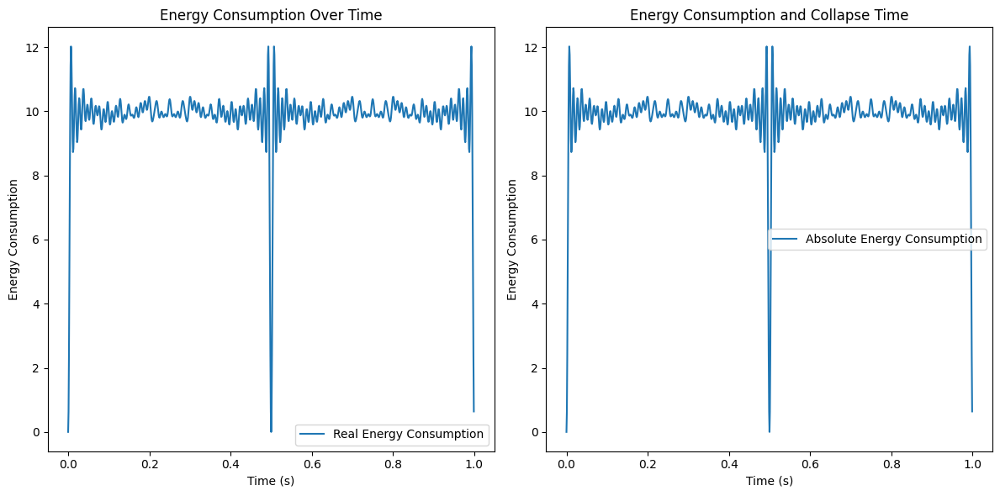

No collapse detected within the given time frame.


In [ ]:

# Código para monitorear el consumo de energía en memprocesadores y rastrear contribuciones

import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, time_step, f0):
    contribution = np.sin(2 * np.pi * element * f0 * time_step) * 0.1
    return contribution

def calculate_collective_state(g_set, time_points, f0):
    n = len(g_set)
    g_t = np.zeros_like(time_points, dtype=np.complex128)
    energy_consumption = np.zeros_like(time_points)
    for t_idx, t in enumerate(time_points):
        for element in g_set:
            contribution = mem_state_dynamics(element, t, f0)
            g_t[t_idx] += contribution
            energy_consumption[t_idx] += np.abs(contribution)**2  # Energy consumption is proportional to the square of the contribution
    return g_t, energy_consumption

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(g_t), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def find_contributing_elements_at_collapse(g_set, target_sum, time_points, f0):
    g_t, energy_consumption = calculate_collective_state(g_set, time_points, f0)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    normalized_frequencies = np.round(frequencies / f0).astype(int)

    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if freq == target_sum and amp > 1e-5:  # Check for the target frequency
            collapse_time = time_points[np.argmax(np.abs(spectrum))]  # Time of maximum amplitude
            return collapse_time, g_set, energy_consumption

    return None, g_set, energy_consumption

# Parameters
num_elements = 2000
element_range = 50
f0 = 1.0
target_sum = 87
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generate set and track energy consumption
G_random = generate_random_set(num_elements, element_range)
collapse_time, elements, energy_consumption = find_contributing_elements_at_collapse(G_random, target_sum, time_points, f0)

# Visualization
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(energy_consumption), label='Real Energy Consumption')
plt.xlabel('Time (s)')
plt.ylabel('Energy Consumption')
plt.title('Energy Consumption Over Time')
plt.legend()

plt.subplot(1, 2, 2)
if collapse_time:
    plt.axvline(x=collapse_time, color='r', linestyle='--', label=f'Collapse at {collapse_time:.2f}s')
plt.plot(time_points, np.abs(energy_consumption), label='Absolute Energy Consumption')
plt.xlabel('Time (s)')
plt.ylabel('Energy Consumption')
plt.title('Energy Consumption and Collapse Time')
plt.legend()

plt.tight_layout()
plt.show()

if collapse_time:
    print(f"Collapse detected at time {collapse_time:.2f}s with elements: {elements}")
else:
    print("No collapse detected within the given time frame.")


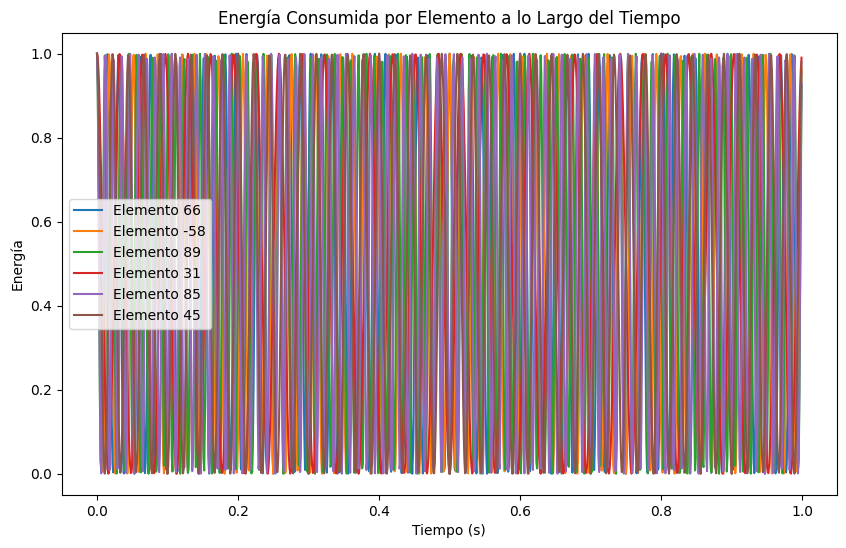

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_state_single_element(element, f0, time_points):
    w = 2 * np.pi * element * f0
    return (1 + np.exp(1j * w * time_points)) * 2**(-1)

def track_contributions(g_set, f0, target_sum, time_points):
    contributions = {element: [] for element in g_set}
    for time_point in time_points:
        collective_state = np.ones_like(time_point, dtype=np.complex128)
        for element in g_set:
            element_state = calculate_state_single_element(element, f0, time_point)
            collective_state *= element_state
            contributions[element].append(np.abs(element_state)**2)  # Energía consumida por el elemento

        # Verificar si se logra la suma en este punto del tiempo
        if np.abs(np.sum(collective_state)) > target_sum - 0.5 and np.abs(np.sum(collective_state)) < target_sum + 0.5:
            print(f"Colapso detectado en tiempo: {time_point}, Elementos: {g_set}")
            break

    return contributions

# Parámetros para la generación del conjunto y simulación
num_elements = 6
element_range = 100
f0 = 1.0
target_sum = 50
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar conjunto y rastrear contribuciones
G_random = generate_random_set(num_elements, element_range)
contributions = track_contributions(G_random, f0, target_sum, time_points)

# Visualización de las contribuciones
plt.figure(figsize=(10, 6))
for element, energy in contributions.items():
    plt.plot(time_points, energy, label=f'Elemento {element}')
plt.title('Energía Consumida por Elemento a lo Largo del Tiempo')
plt.xlabel('Tiempo (s)')
plt.ylabel('Energía')
plt.legend()
plt.show()


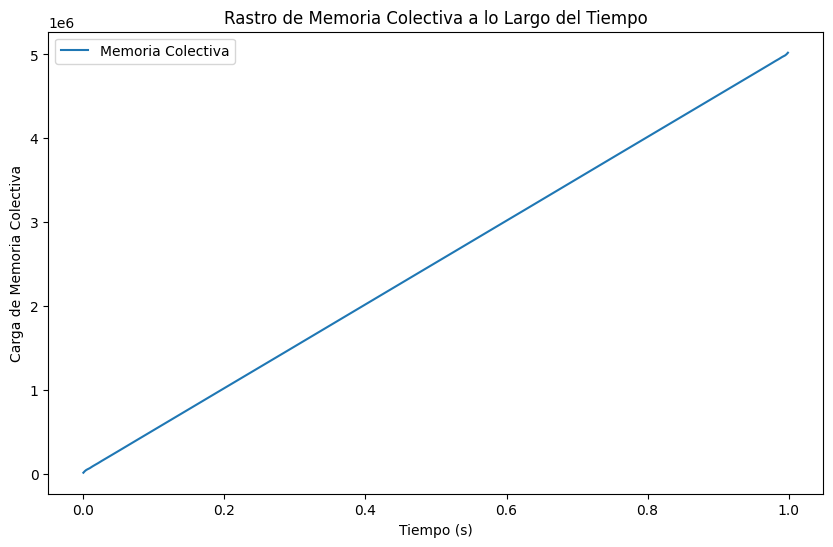

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_state_single_element(element, f0, time_point):
    w = 2 * np.pi * element * f0
    return (1 + np.exp(1j * w * time_point)) * 2**(-1)

def track_contributions_with_memory(g_set, f0, target_sum, time_points):
    memory = {element: 0 for element in g_set}  # Inicializar memoria para cada elemento
    collective_memory_trace = []

    for time_point in time_points:
        collective_state = np.ones_like(time_point, dtype=np.complex128)

        for element in g_set:
            element_state = calculate_state_single_element(element, f0, time_point)
            collective_state *= element_state
            memory[element] += np.abs(element_state)**2  # Acumular "carga" en la memoria

        collective_memory_trace.append(np.sum(list(memory.values())))

        # Verificar si se logra la suma en este punto del tiempo
        if np.abs(np.sum(collective_state)) > target_sum - 0.5 and np.abs(np.sum(collective_state)) < target_sum + 0.5:
            print(f"Colapso detectado en tiempo: {time_point:.5f}, Suma aproximada: {np.abs(np.sum(collective_state)):.2f}")
            for element, charge in memory.items():
                print(f"Elemento {element}: Carga acumulada hasta el colapso: {charge:.5f}")
            break

    return memory, collective_memory_trace

# Parámetros para la generación del conjunto y simulación
num_elements = 10000
element_range = 100
f0 = 1.0
target_sum = 87
time_points = np.linspace(0, 1, 1000, endpoint=False)

# Generar conjunto y rastrear contribuciones
G_random = generate_random_set(num_elements, element_range)
memory, collective_memory_trace = track_contributions_with_memory(G_random, f0, target_sum, time_points)

# Visualización de las contribuciones
plt.figure(figsize=(10, 6))
plt.plot(time_points, collective_memory_trace, label='Memoria Colectiva')
plt.title('Rastro de Memoria Colectiva a lo Largo del Tiempo')
plt.xlabel('Tiempo (s)')
plt.ylabel('Carga de Memoria Colectiva')
plt.legend()
plt.show()




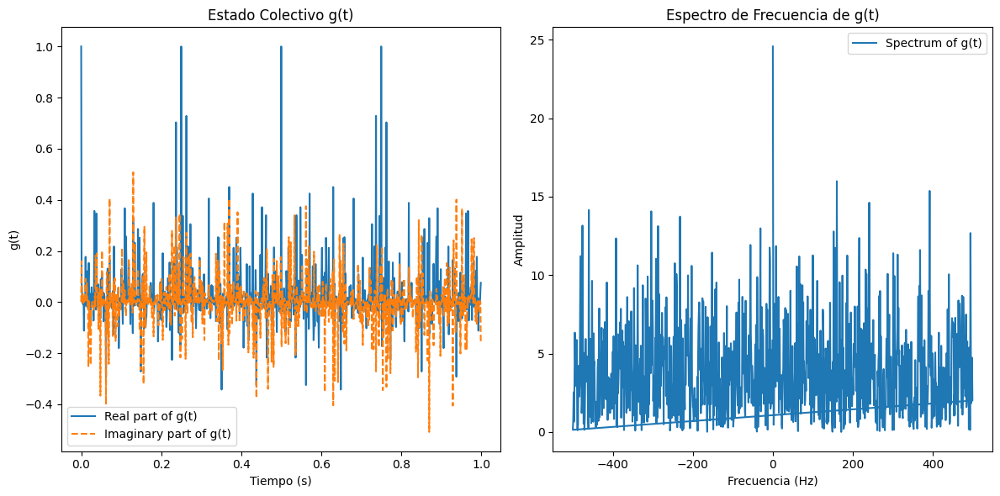

Conjunto Aleatorio Generado: [  7 -87  69 -89  40 -47]
Sumas Posibles Interpretadas: {0: 24.574457507855314, 1: 7.174787732960528, 2: 0.46819619845049854, 3: 1.373768352716369, 4: 8.173769842930994, 5: 4.715857106586286, 6: 3.412221334276983, 7: 2.8934336303977632, 8: 11.853750363638355, 9: 4.157462209931438, 10: 5.0846307171882525, 11: 3.242617558022685, 12: 3.56575122450761, 13: 3.685347797991923, 14: 8.617228787643123, 15: 1.2329581580656441, 16: 3.497189342786748, 17: 6.596527596583082, 18: 3.4067222583108143, 19: 2.256888826343107, 20: 2.0799563949384603, 21: 3.636848089965481, 22: 0.4812254384729888, 23: 0.22793572546155838, 24: 1.7882368489753357, 25: 3.547772890682422, 26: 4.02331654385573, 27: 7.1590933396257395, 28: 6.233655462388272, 29: 4.113296839746163, 30: 1.2094461085238344, 31: 7.906876855846397, 32: 1.485921032849184, 33: 7.779477739364123, 34: 1.6266293874032292, 35: 3.5618301500559197, 36: 1.3648871792453883, 37: 3.8240011812999137, 38: 7.542739019719456, 39: 3.4030

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, time):
    """Función hipotética que define cómo cambian los estados de memoria."""
    # Esta función deberá ser definida según las reglas del memprocesador
    return np.sin(2 * np.pi * element * time)

def calculate_collective_state_memprocesador(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for t_idx, t in enumerate(time_points):
        for a_j in g_set:
            w_j = 2 * np.pi * a_j * f0
            mem_state = mem_state_dynamics(a_j, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
        g_t[t_idx] *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}
    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            if amp > 1e-5:
                possible_sums[freq] = amp
    return possible_sums

def analyze_subset_sum(g_set, f0, element_range, target_sum):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_memprocesador(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Comprobar si se logra la suma objetivo
    success = target_sum in possible_sums

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums, success

# Parámetros para la generación del conjunto
num_elements = 6  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
f0 = 1.0  # Frecuencia fundamental
target_sum = 6  # Suma objetivo para el SSP

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums, success = analyze_subset_sum(G_random, f0, element_range, target_sum)

# Imprimir los resultados
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles Interpretadas:", interpreted_sums)
print("\033[1m" + "¿Se logró la suma objetivo? " + str(success) + "\033[0m")  # Imprimir en negrita


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def memprocesador_dynamics(element, current_state, collective_state, target_sum, time_step):
    """Ajusta el estado de memoria basándose en la contribución al objetivo y el estado colectivo."""
    # Esta es una función simplificada y debe ser desarrollada más detalladamente
    contribution = np.sin(2 * np.pi * element * time_step)
    if np.abs(collective_state + contribution - target_sum) < np.abs(collective_state - target_sum):
        return current_state + contribution  # Ajustar estado si contribuye a la suma
    else:
        return current_state

def calculate_collective_state(mem_states):
    """Calcula el estado colectivo del sistema de memprocesadores."""
    return np.sum(mem_states)

# Parámetros para la generación del conjunto y la suma objetivo
num_elements = 100
element_range = 100
target_sum = 37
num_steps = 1000  # Número de pasos en la simulación

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Simulación de la dinámica de los memprocesadores
for time_step in np.linspace(0, 1, num_steps):
    collective_state = calculate_collective_state(mem_states)
    for i, element in enumerate(G_random):
        mem_states[i] = memprocesador_dynamics(element, mem_states[i], collective_state, target_sum, time_step)

# Visualización de los estados de memoria finales
plt.bar(range(num_elements), mem_states)
plt.xlabel('Element Index')
plt.ylabel('Memory State')
plt.title('Final Memory States of Memprocessors')
plt.show()

# Verificar si se alcanza la suma objetivo
print("Final collective state:", calculate_collective_state(mem_states))
print("Target Sum:", target_sum)


Conjunto Aleatorio Generado: [-27 -29   3  19  89   1  -7  68  78  65]


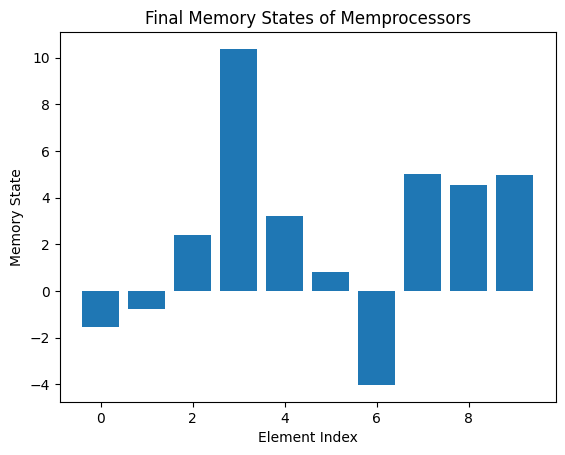

Combinación que suma al objetivo: (-27, -29, 3, 78)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    """Ajusta el estado de memoria basándose en la contribución al objetivo y el estado colectivo."""
    # Esta es una función simplificada y debe ser desarrollada más detalladamente
    contribution = np.sin(2 * np.pi * element * time_step)
    if np.abs(collective_state + contribution - target_sum) < np.abs(collective_state - target_sum):
        return current_state + contribution  # Ajustar estado si contribuye a la suma
    else:
        return current_state

def calculate_collective_state(mem_states):
    """Calcula el estado colectivo del sistema de memprocesadores."""
    return np.sum(mem_states)

def find_combinations_for_sum(g_set, target_sum):
    """Encuentra todas las combinaciones que suman al objetivo."""
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto y la suma objetivo
num_elements = 10
element_range = 100
target_sum = 25
num_steps = 1000

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Simulación de la dinámica de los memprocesadores
for time_step in np.linspace(0, 1, num_steps):
    collective_state = calculate_collective_state(mem_states)
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], collective_state, target_sum, time_step)

# Visualización de los estados de memoria finales
plt.bar(range(num_elements), mem_states)
plt.xlabel('Element Index')
plt.ylabel('Memory State')
plt.title('Final Memory States of Memprocessors')
plt.show()

# Verificar si se alcanza la suma objetivo y con qué combinación
combination = find_combinations_for_sum(G_random, target_sum)
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")


Conjunto Aleatorio Generado: [  13    8  -95   -2   32  -92   63  -24  -63 -100]


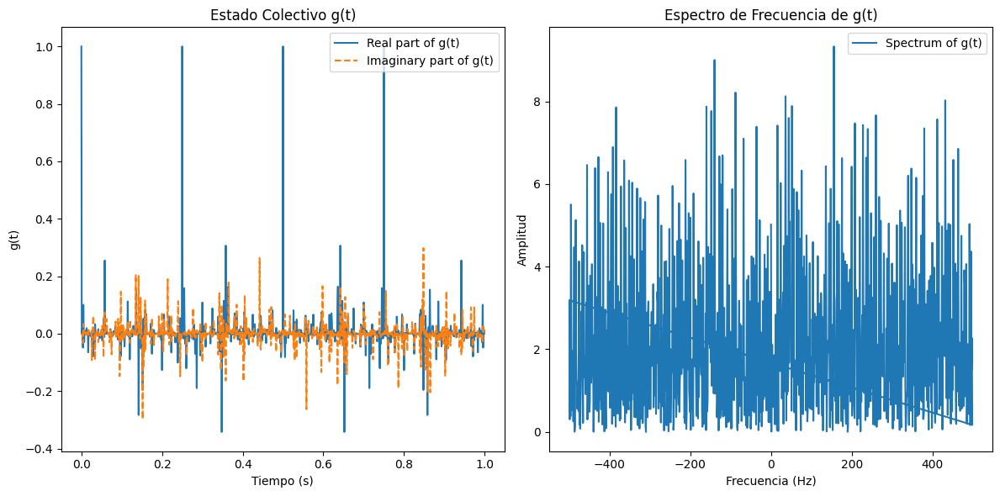

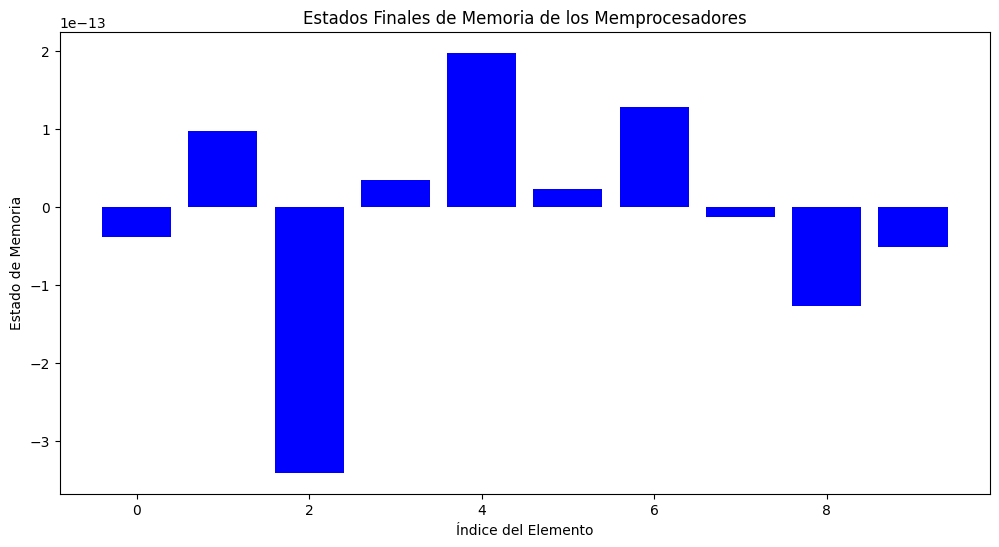

Combinación que suma al objetivo: (13, -2, 63, -24)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

def calculate_collective_state_random_set(g_set, f0, time_points, mem_states):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for i, a_j in enumerate(g_set):
        w_j = 2 * np.pi * a_j * f0
        for t_idx, t in enumerate(time_points):
            current_state = mem_states[i]
            mem_state = mem_state_dynamics(a_j, current_state, calculate_collective_state(mem_states), target_sum, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def find_combinations_for_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
f0 = 1.0  # Frecuencia fundamental
target_sum = 50  # Suma objetivo

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Actualizar los estados de memoria durante la simulación
for time_step in np.linspace(0, 1, 1000):
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], calculate_collective_state(mem_states), target_sum, time_step)

# Calcular g(t) y su espectro de frecuencias
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points, mem_states)
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Visualización de g(t) y su espectro de frecuencias
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()

# Visualización de los estados de memoria finales
plt.figure(figsize=(12, 6))
plt.bar(range(num_elements), mem_states, color='blue')
plt.xlabel('Índice del Elemento')
plt.ylabel('Estado de Memoria')
plt.title('Estados Finales de Memoria de los Memprocesadores')
plt.show()

# Verificar y mostrar el subconjunto que suma al objetivo
combination = find_combinations_for_sum(G_random, target_sum)
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")




Conjunto Aleatorio Generado: [ 29 -46 -95 -43  28  51  52 -65  82 -90]


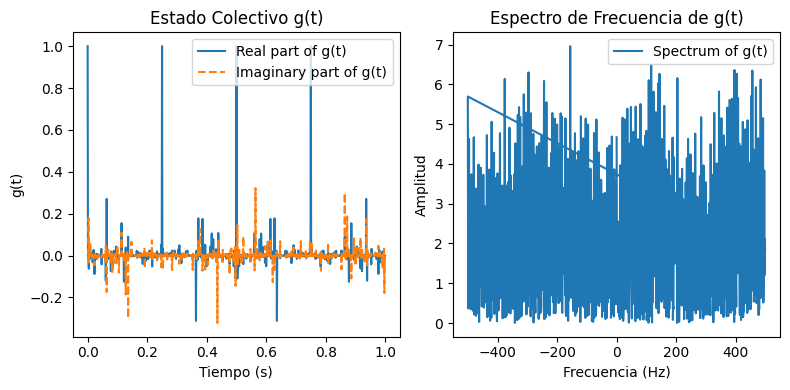

Combinación que suma al objetivo: (29, -46, -43, 28, 82)


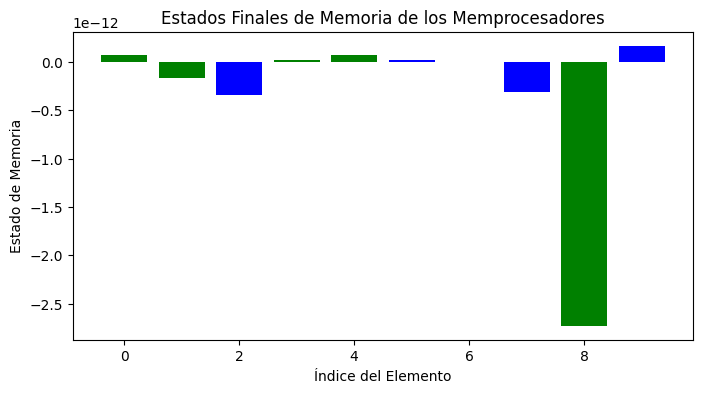

In [ ]:
# Modificando el código para cambiar el color de los estados de memoria de los elementos que forman parte de la combinación encontrada

import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

def calculate_collective_state_random_set(g_set, f0, time_points, mem_states):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for i, a_j in enumerate(g_set):
        w_j = 2 * np.pi * a_j * f0
        for t_idx, t in enumerate(time_points):
            current_state = mem_states[i]
            mem_state = mem_state_dynamics(a_j, current_state, calculate_collective_state(mem_states), target_sum, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def find_combinations_for_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
f0 = 1.0  # Frecuencia fundamental
target_sum = 50  # Suma objetivo

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Actualizar los estados de memoria durante la simulación
for time_step in np.linspace(0, 1, 1000):
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], calculate_collective_state(mem_states), target_sum, time_step)

# Calcular g(t) y su espectro de frecuencias
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_random_set(G_random, f0, time_points, mem_states)
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Visualización de g(t) y su espectro de frecuencias
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()

# Verificar y mostrar el subconjunto que suma al objetivo
combination = find_combinations_for_sum(G_random, target_sum)
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")

# Visualización de los estados de memoria finales con colores diferenciados
colors = ['green' if element in combination else 'blue' for element in G_random]
plt.figure(figsize=(8, 4))
plt.bar(range(num_elements), mem_states, color=colors)
plt.xlabel('Índice del Elemento')
plt.ylabel('Estado de Memoria')
plt.title('Estados Finales de Memoria de los Memprocesadores')
plt.show()



Conjunto Aleatorio Generado: [ 84  38 -59 -31  -6]


<ipython-input-3-996e6f9af985>:74: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


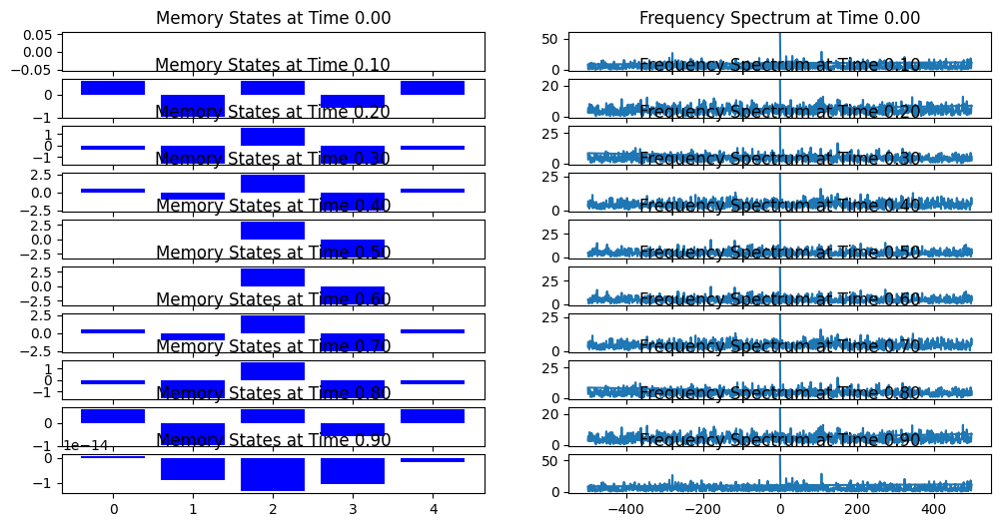

Combinación que suma al objetivo: No se encontró ninguna combinación


In [ ]:
# Modificando el código para visualizar la evolución de los estados de memoria y la relación con el espacio de frecuencias g(t)

import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

def calculate_collective_state_random_set(g_set, f0, time_points, mem_states):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for i, a_j in enumerate(g_set):
        w_j = 2 * np.pi * a_j * f0
        for t_idx, t in enumerate(time_points):
            current_state = mem_states[i]
            mem_state = mem_state_dynamics(a_j, current_state, calculate_collective_state(mem_states), target_sum, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def find_combinations_for_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto
num_elements = 5
element_range = 100
f0 = 1.0  # Frecuencia fundamental
target_sum = 50  # Suma objetivo

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Visualización de la evolución de los estados de memoria y el espectro de frecuencias
num_time_points = 1000
time_points = np.linspace(0, 1, num_time_points, endpoint=False)
step_display = 100  # Intervalo de visualización
fig, axes = plt.subplots(nrows=num_time_points // step_display, ncols=2, figsize=(12, 6))

for i, time_step in enumerate(time_points):
    if i % step_display == 0:
        for j, element in enumerate(G_random):
            mem_states[j] = mem_state_dynamics(element, mem_states[j], calculate_collective_state(mem_states), target_sum, time_step)

        g_t = calculate_collective_state_random_set(G_random, f0, time_points, mem_states)
        frequencies, spectrum = frequency_spectrum(g_t, time_points)

        row = i // step_display
        axes[row, 0].bar(range(num_elements), mem_states, color='blue')
        axes[row, 0].set_title(f'Memory States at Time {time_step:.2f}')
        axes[row, 1].plot(frequencies, np.abs(spectrum))
        axes[row, 1].set_title(f'Frequency Spectrum at Time {time_step:.2f}')

plt.tight_layout()
plt.show()

# Verificar y mostrar el subconjunto que suma al objetivo
combination = find_combinations_for_sum(G_random, target_sum)
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")


Conjunto Aleatorio Generado: [-59  84  53 -28  91]


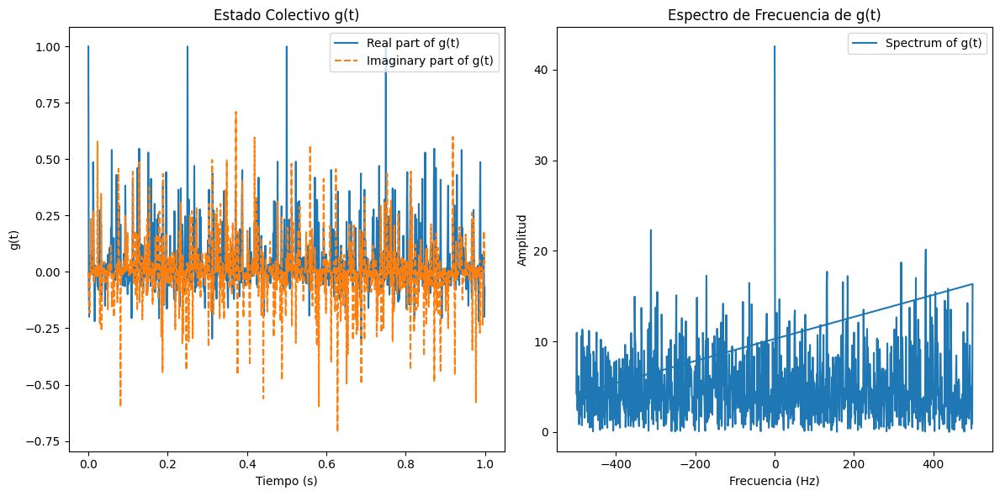

Combinación que suma al objetivo: (-59, 84, 53, -28)
Estados de Memoria en el momento del colapso de onda: [0. 0. 0. 0. 0.]


In [ ]:
# Reejecutando el código modificado

import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

def calculate_collective_state_random_set(g_set, f0, time_points, mem_states):
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for i, a_j in enumerate(g_set):
        w_j = 2 * np.pi * a_j * f0
        for t_idx, t in enumerate(time_points):
            current_state = mem_states[i]
            mem_state = mem_state_dynamics(a_j, current_state, calculate_collective_state(mem_states), target_sum, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
    g_t *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

def find_combinations_for_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto
num_elements = 5
element_range = 100
f0 = 1.0  # Frecuencia fundamental
target_sum = 50  # Suma objetivo

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador y seguimiento de la evolución
mem_states = np.zeros(num_elements)
time_points = np.linspace(0, 1, 1000, endpoint=False)
found_combination = False
mem_states_at_collapse = None

for time_step in time_points:
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], calculate_collective_state(mem_states), target_sum, time_step)

    if not found_combination:
        combination = find_combinations_for_sum(G_random, target_sum)
        if combination:
            found_combination = True
            mem_states_at_collapse = mem_states.copy()

# Visualización de g(t) y su espectro de frecuencias
g_t = calculate_collective_state_random_set(G_random, f0, time_points, mem_states)
frequencies, spectrum = frequency_spectrum(g_t, time_points)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()

# Mostrar el subconjunto que suma al objetivo y los estados de memoria en el momento del colapso de onda
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")
if mem_states_at_collapse is not None:
    print("Estados de Memoria en el momento del colapso de onda:", mem_states_at_collapse)


Conjunto Aleatorio Generado: [  1 -66   0  59  55 -75   5  -5  49  17]


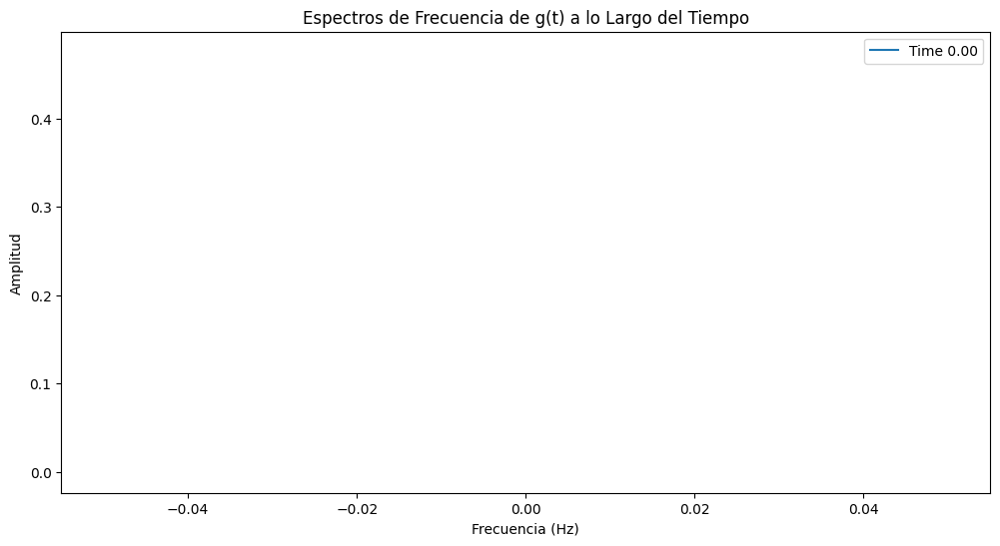

No se detectó colapso de onda


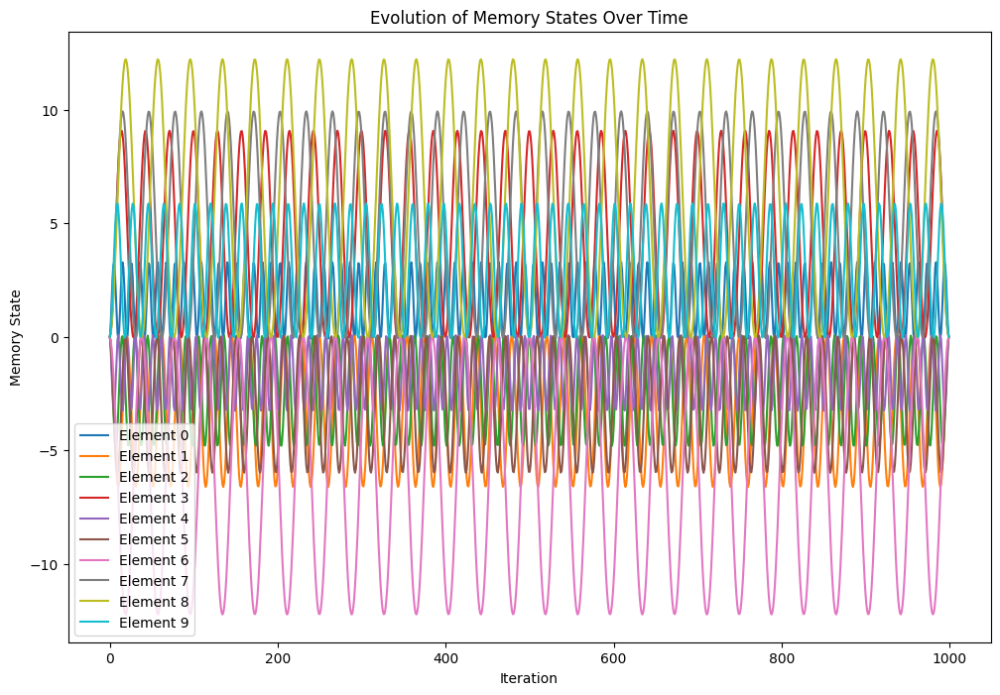

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
target_sum = 50
num_steps = 1000

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Historial de los estados de memoria
mem_states_history = np.zeros((num_steps, num_elements))

# Actualizar los estados de memoria durante la simulación
for step in range(num_steps):
    time_step = step / num_steps
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], calculate_collective_state(mem_states), target_sum, time_step)
    mem_states_history[step] = mem_states

# Visualización de la evolución de los estados de memoria
plt.figure(figsize=(12, 8))
for i in range(num_elements):
    plt.plot(mem_states_history[:, i], label=f'Element {i}')

plt.xlabel('Iteration')
plt.ylabel('Memory State')
plt.title('Evolution of Memory States Over Time')
plt.legend()
plt.show()



Conjunto Aleatorio Generado: [-72  21 -26 -91  39  98  81  96  37  17]
Combinación que suma al objetivo: (-26, 39, 37)


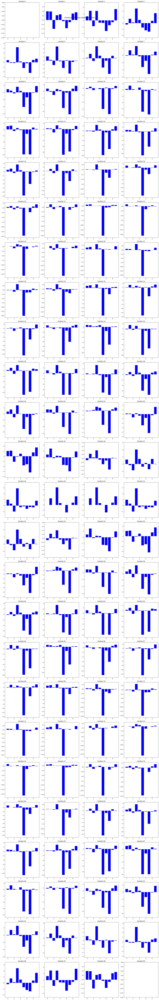

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

def find_combinations_for_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
target_sum = 50
num_steps = 100  # Número de pasos

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Encontrar el subconjunto que suma al objetivo desde el principio
combination = find_combinations_for_sum(G_random, target_sum)
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")

# Crear gráficos de barras para mostrar la evolución de los estados de memoria
num_cols = 4
num_rows = int(np.ceil(num_steps / num_cols))
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows))
fig.suptitle('Evolution of Memory States Over Time', fontsize=14)

for step in range(num_steps):
    time_step = step / num_steps
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], calculate_collective_state(mem_states), target_sum, time_step)

    row_idx = step // num_cols
    col_idx = step % num_cols
    ax = axes[row_idx, col_idx]
    colors = ['green' if step == num_steps - 1 else 'blue' for _ in range(num_elements)]
    ax.bar(range(num_elements), mem_states, color=colors)
    ax.set_title(f'Iteration {step}')
    ax.set_ylim([min(mem_states) - 1, max(mem_states) + 1])

plt.tight_layout()
plt.show()







Conjunto Aleatorio Generado: [ 76  28  86 -29  41 -34 -13 -28 -48 -84]
Combinación que suma al objetivo: (76, 86, -28, -84)


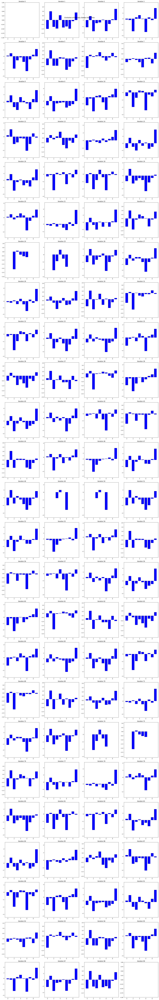

Combinación encontrada en la iteración: 0


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

def generate_random_set(num_elements, element_range):
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, current_state, collective_state, target_sum, time_step):
    contribution = np.sin(2 * np.pi * element * time_step)
    return current_state + contribution

def calculate_collective_state(mem_states):
    return np.sum(mem_states)

def find_combinations_for_sum(g_set, target_sum):
    for r in range(1, len(g_set) + 1):
        for subset in combinations(g_set, r):
            if sum(subset) == target_sum:
                return subset
    return None

# Parámetros para la generación del conjunto
num_elements = 10
element_range = 100
target_sum = 50
num_steps = 100  # Número de pasos

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)
print("Conjunto Aleatorio Generado:", G_random)

# Estado inicial de cada memprocesador
mem_states = np.zeros(num_elements)

# Encontrar el subconjunto que suma al objetivo desde el principio
combination = find_combinations_for_sum(G_random, target_sum)
print("Combinación que suma al objetivo:", combination if combination else "No se encontró ninguna combinación")

# Crear gráficos de barras para mostrar la evolución de los estados de memoria
num_cols = 4
num_rows = int(np.ceil(num_steps / num_cols))
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows))
fig.suptitle('Evolution of Memory States Over Time', fontsize=14)

# Variable para almacenar la iteración en la que se encuentra la combinación
combination_iteration = -1

for step in range(num_steps):
    time_step = step / num_steps
    for i, element in enumerate(G_random):
        mem_states[i] = mem_state_dynamics(element, mem_states[i], calculate_collective_state(mem_states), target_sum, time_step)

    # Verificar si se encuentra la combinación en esta iteración
    if combination and combination_iteration == -1:
        if all(item in G_random for item in combination):
            combination_iteration = step

    row_idx = step // num_cols
    col_idx = step % num_cols
    ax = axes[row_idx, col_idx]
    color = 'green' if step == combination_iteration else 'blue'
    ax.bar(range(num_elements), mem_states, color=color)
    ax.set_title(f'Iteration {step}')
    ax.set_ylim([min(mem_states) - 1, max(mem_states) + 1])

plt.tight_layout()
plt.show()

# Mostrar en qué iteración se encontró la combinación
if combination_iteration != -1:
    print(f"Combinación encontrada en la iteración: {combination_iteration}")
else:
    print("La combinación no se encontró en ninguna iteración.")



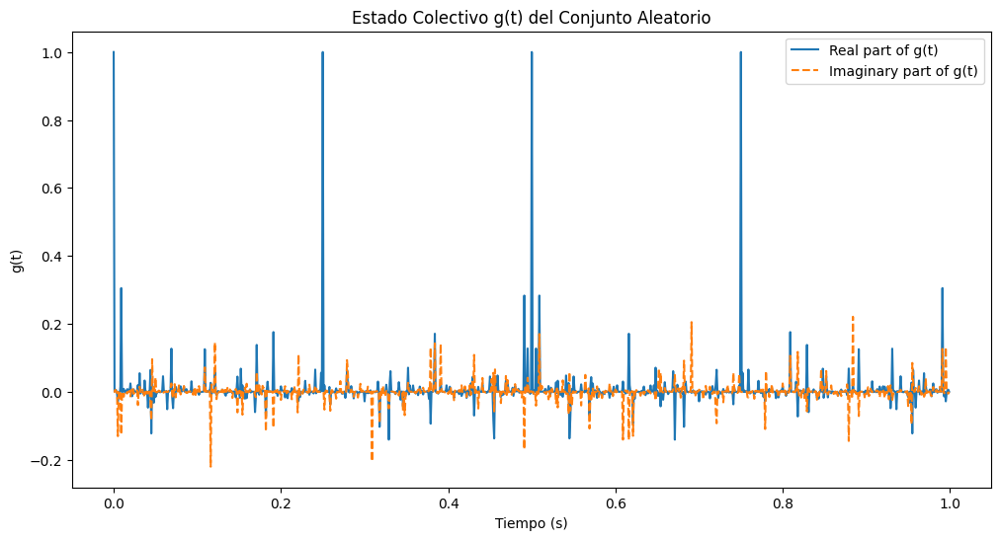

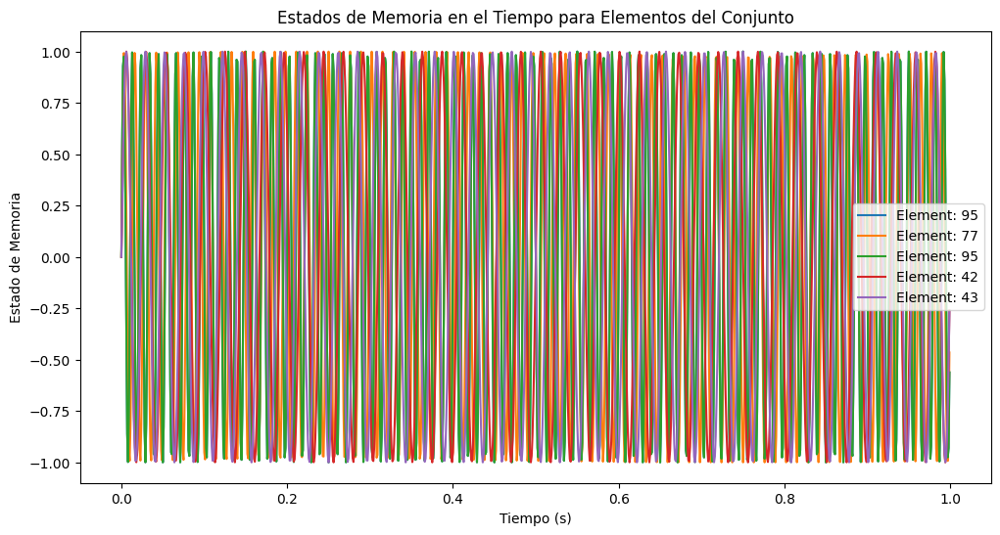

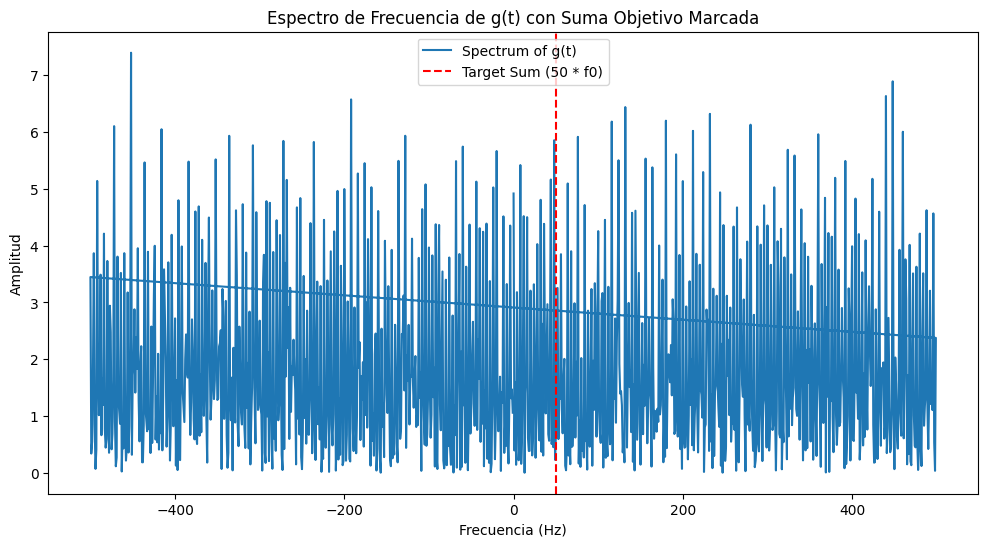

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, time):
    """Función hipotética que define cómo cambian los estados de memoria."""
    return np.sin(2 * np.pi * element * time)

def calculate_collective_state_memprocesador(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for t_idx, t in enumerate(time_points):
        for a_j in g_set:
            w_j = 2 * np.pi * a_j * f0
            mem_state = mem_state_dynamics(a_j, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
        g_t[t_idx] *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

# Parámetros para la generación del conjunto
num_elements = 10  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
f0 = 1.0  # Frecuencia fundamental

# Generar un conjunto aleatorio de elementos
G_random = generate_random_set(num_elements, element_range)

# Calcular el estado colectivo g(t) para el conjunto G_random
time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
g_t = calculate_collective_state_memprocesador(G_random, f0, time_points)

# Visualización del estado colectivo g(t)
plt.figure(figsize=(12, 6))
plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t) del Conjunto Aleatorio')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()
plt.show()

# Visualización de los estados de memoria para algunos elementos seleccionados del conjunto
plt.figure(figsize=(12, 6))
for a_j in G_random[:5]:  # Seleccionar solo los primeros 5 elementos para la visualización
    mem_states = mem_state_dynamics(a_j, time_points)
    plt.plot(time_points, mem_states, label=f'Element: {a_j}')

plt.title('Estados de Memoria en el Tiempo para Elementos del Conjunto')
plt.xlabel('Tiempo (s)')
plt.ylabel('Estado de Memoria')
plt.legend()
plt.show()

# Visualización del espectro de frecuencia y marca de la suma objetivo
plt.figure(figsize=(12, 6))
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.axvline(x=target_sum * f0, color='r', linestyle='--', label=f'Target Sum ({target_sum} * f0)')
plt.title('Espectro de Frecuencia de g(t) con Suma Objetivo Marcada')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()
plt.show()

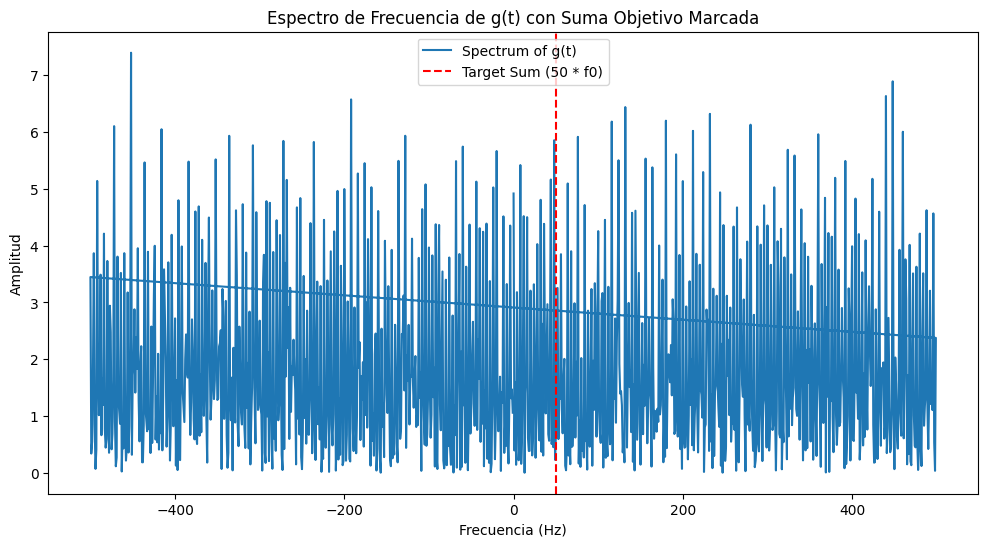

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def mem_state_dynamics(element, time):
    """Función hipotética que define cómo cambian los estados de memoria."""
    return np.sin(2 * np.pi * element * time)

def calculate_collective_state_memprocesador(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for t_idx, t in enumerate(time_points):
        for a_j in g_set:
            w_j = 2 * np.pi * a_j * f0
            mem_state = mem_state_dynamics(a_j, t)
            g_t[t_idx] *= (1 + np.exp(1j * w_j * mem_state))
        g_t[t_idx] *= 2**(-n)
    return g_t

def frequency_spectrum(g_t, time_points):
    """Calcula el espectro de frecuencia del estado colectivo."""
    spectrum = np.fft.fft(g_t)
    frequencies = np.fft.fftfreq(len(time_points), d=time_points[1] - time_points[0])
    return frequencies, spectrum

# Parámetros para la generación del conjunto y la suma objetivo
num_elements = 10
element_range = 100
f0 = 1.0
target_sum = 50  # Suma objetivo

# Generar un conjunto aleatorio y calcular el estado colectivo
G_random = generate_random_set(num_elements, element_range)
time_points = np.linspace(0, 1, 1000, endpoint=False)
g_t = calculate_collective_state_memprocesador(G_random, f0, time_points)

# Calcular el espectro de frecuencia
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Visualización del espectro de frecuencia y marca de la suma objetivo
plt.figure(figsize=(12, 6))
plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
plt.axvline(x=target_sum * f0, color='r', linestyle='--', label=f'Target Sum ({target_sum} * f0)')
plt.title('Espectro de Frecuencia de g(t) con Suma Objetivo Marcada')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()
plt.show()


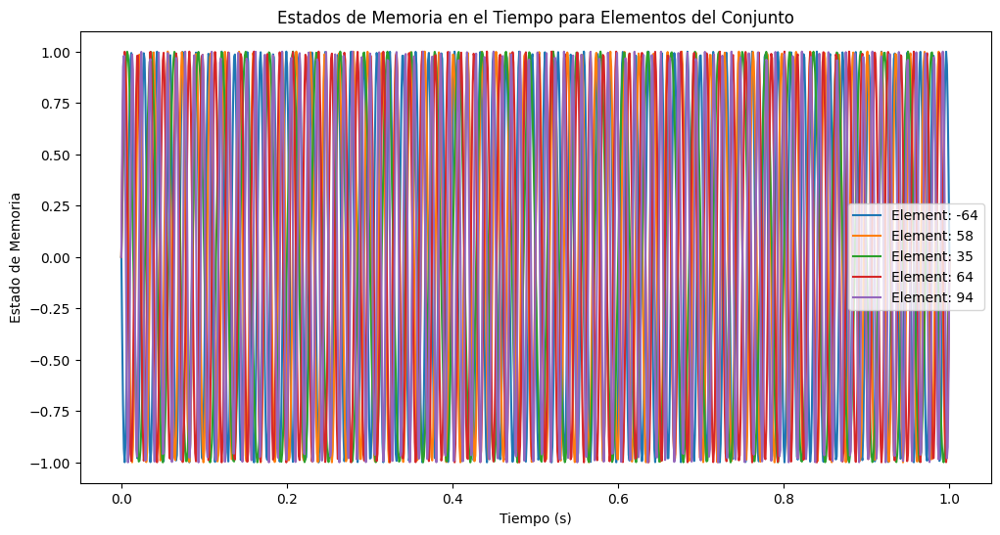

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# La misma función mem_state_dynamics del código anterior
def mem_state_dynamics(element, time):
    return np.sin(2 * np.pi * element * time)

# Generar un conjunto aleatorio de elementos
num_elements = 10  # Número de elementos en el conjunto
element_range = 100  # Rango de valores para los elementos
G_random = generate_random_set(num_elements, element_range)

# Tiempos para la visualización
time_points = np.linspace(0, 1, 1000)

# Visualización de los estados de memoria para algunos elementos seleccionados del conjunto
plt.figure(figsize=(12, 6))
for a_j in G_random[:5]:  # Seleccionar solo los primeros 5 elementos para la visualización
    mem_states = mem_state_dynamics(a_j, time_points)
    plt.plot(time_points, mem_states, label=f'Element: {a_j}')

plt.title('Estados de Memoria en el Tiempo para Elementos del Conjunto')
plt.xlabel('Tiempo (s)')
plt.ylabel('Estado de Memoria')
plt.legend()
plt.show()


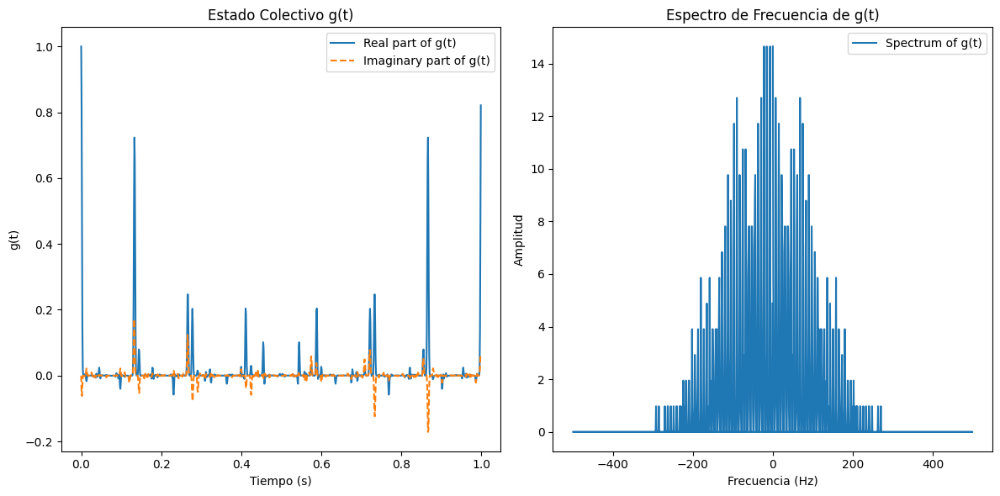

(array([ 61, -83, -68,  82, -44,  90, -75, -22,   7,  30]),
 {0: 14.64843750000005,
  1: 5.859375000000103,
  2: 2.929687499999945,
  6: 1.9531249999998985,
  7: 12.695312499999979,
  8: 8.789062500000139,
  9: 3.9062500000000284,
  10: 0.9765624999999128,
  14: 7.812499999999925,
  15: 11.718750000000078,
  16: 6.8359375000000835,
  17: 2.9296874999999725,
  21: 2.9296874999999223,
  22: 9.765625000000028,
  23: 8.789062500000107,
  24: 6.835937500000013,
  25: 0.9765624999999362,
  28: 0.97656249999994,
  29: 6.835937499999974,
  30: 7.812500000000111,
  31: 7.8125000000000675,
  32: 3.9062499999999947,
  36: 2.9296874999999325,
  37: 7.812500000000031,
  38: 7.81250000000006,
  39: 6.835937500000068,
  40: 0.9765624999999702,
  44: 5.8593749999999964,
  45: 6.835937500000022,
  46: 10.742187500000071,
  47: 2.9296875000000573,
  51: 2.9296875000000098,
  52: 2.929687500000011,
  53: 10.742187500000025,
  54: 6.835937500000111,
  58: 0.9765624999999909,
  59: 1.9531249999999847,
  60

In [ ]:



import numpy as np
import matplotlib.pyplot as plt

def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def interpret_spectrum(frequencies, spectrum, element_range):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    # Normalizar las frecuencias y buscar frecuencias enteras dentro del rango posible
    normalized_frequencies = np.round(frequencies * f0).astype(int)
    possible_sums = {}

    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            # Considerar solo frecuencias con amplitud significativa
            if amp > 1e-5:
                possible_sums[freq] = amp

    return possible_sums

# Modificar la función analyze_subset_sum para incluir la interpretación del espectro
def analyze_subset_sum(g_set, f0, element_range):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Interpretar el espectro de frecuencia
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums

# Realizar la simulación con interpretación del espectro
generated_set, interpreted_sums = analyze_subset_sum(G_random, f0, element_range)
generated_set, interpreted_sums



<ipython-input-23-ccb20ab3785e>:51: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(sums.numpy(), amplitudes.numpy(), use_line_collection=True)


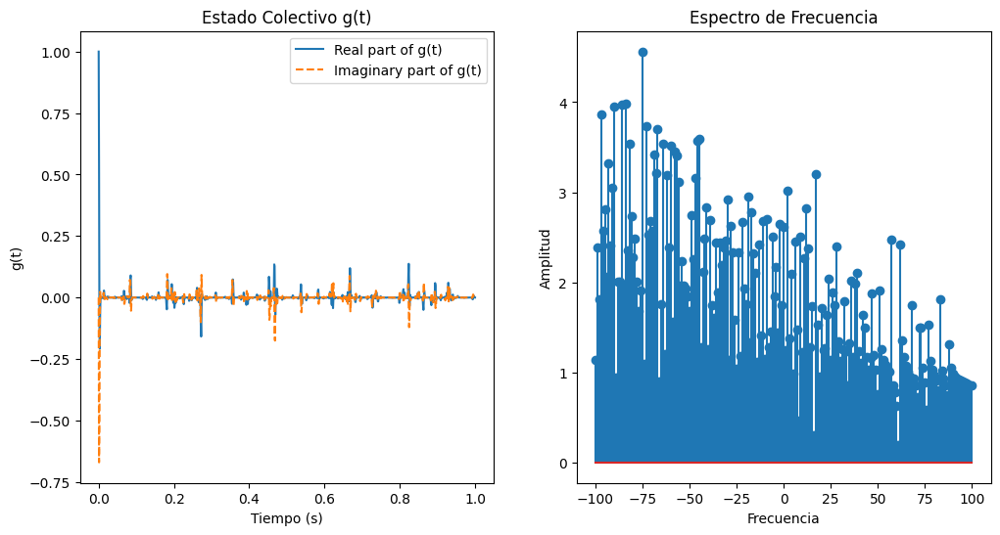

Conjunto Aleatorio Generado: [-14.884254 -70.38786   61.53862  -48.466896  25.782204 -92.50174
  -4.558853 -10.905838 -83.61044  -44.977715]
Sumas Posibles y Amplitudes: [   0    1    2    3    4    5    6    7    8    9   10   11   12   13
   14   15   16   17   18   19   20   21   22   23   24   25   26   27
   28   29   30   31   32   33   34   35   36   37   38   39   40   41
   42   43   44   45   46   47   48   49   50   51   52   53   54   55
   56   57   58   59   60   61   62   63   64   65   66   67   68   69
   70   71   72   73   74   75   76   77   78   79   80   81   82   83
   84   85   86   87   88   89   90   91   92   93   94   95   96   97
   98   99  100 -100  -99  -98  -97  -96  -95  -94  -93  -92  -91  -90
  -89  -88  -87  -86  -85  -84  -83  -82  -81  -80  -79  -78  -77  -76
  -75  -74  -73  -72  -71  -70  -69  -68  -67  -66  -65  -64  -63  -62
  -61  -60  -59  -58  -57  -56  -55  -54  -53  -52  -51  -50  -49  -48
  -47  -46  -45  -44  -43  -42  -41  -40  -39  -3

In [ ]:

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Configurar TensorFlow
if not tf.test.is_built_with_cuda():
    print("TensorFlow no tiene soporte para GPU en este entorno, lo que puede afectar el rendimiento.")

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    frequencies_float = tf.cast(frequencies, dtype=tf.float32)
    normalized_frequencies = tf.cast(tf.round(frequencies_float / f0), dtype=tf.int32)
    amplitudes = tf.abs(spectrum)
    significant_indices = tf.where((amplitudes > 1e-3) &
                                   (normalized_frequencies >= -element_range) &
                                   (normalized_frequencies <= element_range))
    significant_frequencies = tf.gather_nd(normalized_frequencies, significant_indices)
    significant_amplitudes = tf.gather_nd(amplitudes, significant_indices)
    return significant_frequencies, significant_amplitudes

# Generar un conjunto aleatorio usando TensorFlow
num_elements = 10
element_range = 100
G_random = tf.random.uniform(shape=[num_elements], minval=-element_range, maxval=element_range, dtype=tf.float32)

# Calcular el estado colectivo g(t)
f0 = 1.0
time_points = tf.linspace(0.0, 1.0, 1000)
g_t = tf.cast(tf.ones_like(time_points), dtype=tf.complex128)
G_random_complex = tf.cast(G_random, dtype=tf.complex128)

for a_j in G_random_complex:
    w_j = 2 * np.pi * a_j * f0
    exponent = 1j * w_j * tf.cast(time_points, dtype=tf.complex128)
    g_t *= (1 + tf.exp(exponent))

g_t *= 2**(-num_elements)

# Calcular el espectro de frecuencia usando FFT de TensorFlow
spectrum = tf.signal.fft(g_t)
frequencies = tf.signal.fftshift(tf.range(-500, 500))

# Convertir f0 a tf.float32 para la operación de división
f0_tensor = tf.constant(f0, dtype=tf.float32)

# Interpretar el espectro de frecuencia
sums, amplitudes = interpret_spectrum(frequencies, spectrum, element_range, f0_tensor)

# Visualizar los resultados
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points.numpy(), tf.math.real(g_t).numpy(), label='Real part of g(t)')
plt.plot(time_points.numpy(), tf.math.imag(g_t).numpy(), label='Imaginary part of g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.stem(sums.numpy(), amplitudes.numpy(), use_line_collection=True)
plt.title('Espectro de Frecuencia')
plt.xlabel('Frecuencia')
plt.ylabel('Amplitud')
plt.show()

# Imprimir el conjunto aleatorio y las sumas posibles
print("Conjunto Aleatorio Generado:", G_random.numpy())
print("Sumas Posibles y Amplitudes:", sums.numpy(), amplitudes.numpy())


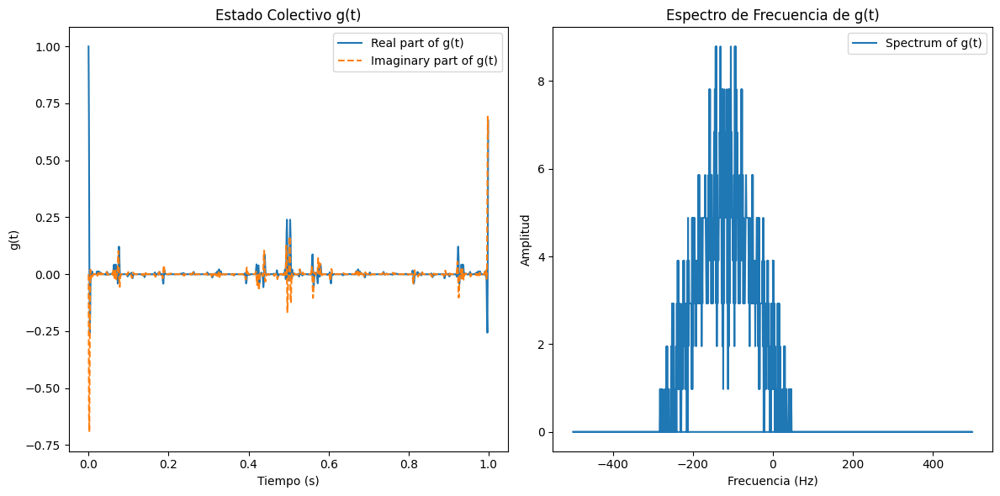

Conjunto Aleatorio Generado: [-30 -43  28 -16  12 -64   2 -91 -38   4]
Sumas Posibles y Amplitudes:
0 3.9062499999999765 ,False
1 0.9765624999999528 ,False
Primo: 3.906249999999973 ,True
Primo: 0.9765624999999576 ,True
4 2.9296874999999685 ,False
6 1.9531249999999667 ,False
8 0.9765624999999716 ,False
10 0.9765624999999805 ,False
12 2.929687499999983 ,False
14 2.929687499999978 ,False
16 2.9296874999999645 ,False
18 1.9531249999999596 ,False
24 0.9765624999999767 ,False
26 0.9765624999999734 ,False
28 1.95312499999997 ,False
30 1.9531249999999603 ,False
32 0.976562499999952 ,False
34 0.9765624999999565 ,False
40 0.976562499999974 ,False
42 0.9765624999999636 ,False
44 0.9765624999999523 ,False
46 0.9765624999999477 ,False
-100 3.906249999999934 ,False
-99 4.88281249999996 ,False
-98 2.9296874999999503 ,False
-97 5.859374999999937 ,False
-96 1.9531249999999496 ,False
-95 8.789062499999917 ,False
-94 2.929687499999957 ,False
-93 8.789062499999929 ,False
-92 3.906249999999952 ,False
-91 7

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Importar pandas


def is_prime(n):
    """Comprueba si un número es primo."""
    if n <= 1:
        return False
    if n <= 3:
        return True
    if n % 2 == 0 or n % 3 == 0:
        return False
    i = 5
    while i * i <= n:
        if n % i == 0 or n % (i + 2) == 0:
            return False
        i += 6
    return True


def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    # Normalizar las frecuencias y buscar frecuencias enteras dentro del rango posible
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}

    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            # Considerar solo frecuencias con amplitud significativa
            if amp > 1e-5:
                possible_sums[freq] = amp

    return possible_sums

def analyze_subset_sum(g_set, f0, element_range):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

    # Interpretar el espectro de frecuencia
    possible_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

    # Visualización
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(time_points, np.real(g_t), label='Real part of g(t)')
    plt.plot(time_points, np.imag(g_t), label='Imaginary part of g(t)', linestyle='--')
    plt.title('Estado Colectivo g(t)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('g(t)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(frequencies, np.abs(spectrum), label='Spectrum of g(t)')
    plt.title('Espectro de Frecuencia de g(t)')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return g_set, possible_sums

# Generar un conjunto aleatorio de elementos y realizar la simulación
G_random = generate_random_set(num_elements, element_range)
generated_set, interpreted_sums = analyze_subset_sum(G_random, f0, element_range)

# Identificar y marcar en negrita los números primos en las sumas posibles
print("Conjunto Aleatorio Generado:", generated_set)
print("Sumas Posibles y Amplitudes:")
for suma, amplitud in interpreted_sums.items():
    if is_prime(suma):
        print("\033[1mPrimo:\033[0m", amplitud,",False")
    else:
        print(suma, amplitud,",true")


/usr/local/lib/python3.10/dist-packages/tensorflow/python/framework/constant_op.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return ops.EagerTensor(value, ctx.device_name, dtype)


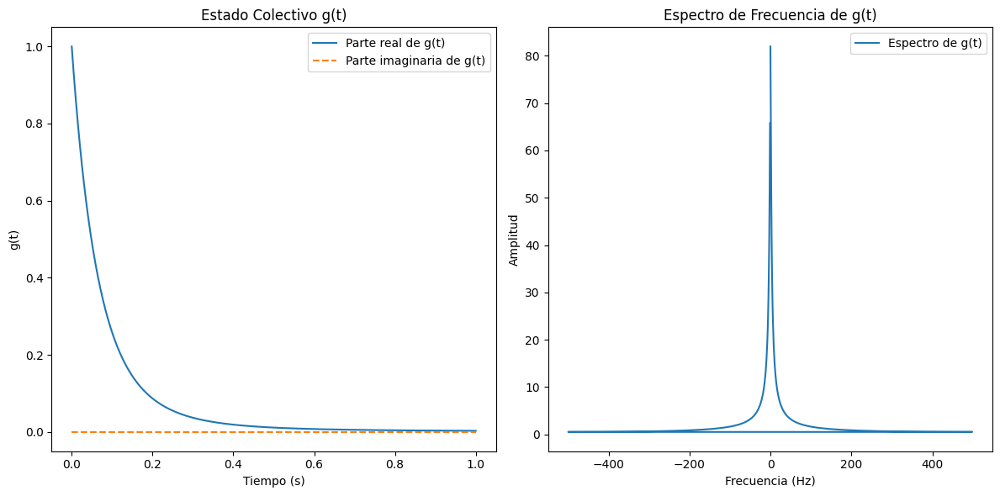

Conjunto Específico Generado: [0.17781694+0.09166577j 0.65167212+0.24191666j 0.12249407+0.23213358j
 0.30994115+0.52293118j 0.96908711+0.86347317j 0.9277663 +0.59053384j
 0.07263416+0.3401694j  0.04099935+0.83899152j 0.92864595+0.49783166j
 0.44499245+0.53612265j]
Sumas Posibles y Amplitudes:
Suma: 0 , Frecuencia: 81.97573884347639
Suma: 1 , Frecuencia: 65.74972219821835
Primo: 2 , Frecuencia: 51.434355519081514
Primo: 3 , Frecuencia: 41.10554263070051
Suma: 4 , Frecuencia: 33.76713123391608
Primo: 5 , Frecuencia: 28.439930905984596
Suma: 6 , Frecuencia: 24.45989580034032
Primo: 7 , Frecuencia: 21.40193240872374
Suma: 8 , Frecuencia: 18.992849907778027
Suma: 9 , Frecuencia: 17.053216296117206
Suma: 10 , Frecuencia: 15.462011897088452
Primo: 11 , Frecuencia: 14.1354098828697
Suma: 12 , Frecuencia: 13.013873692092522
Primo: 13 , Frecuencia: 12.05413989614069
Suma: 14 , Frecuencia: 11.224113583551032
Suma: 15 , Frecuencia: 10.499539476627497
Suma: 16 , Frecuencia: 9.861777269581768
Primo:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def is_prime(n):
    """Comprueba si un número es primo."""
    if n <= 1:
        return False
    if n <= 3:
        return True
    if n % 2 == 0 or n % 3 == 0:
        return False
    i = 5
    while i * i <= n:
        if n % i == 0 or n % (i + 2) == 0:
            return False
        i += 6
    return True


def generate_random_set(num_elements, element_range):
    """Genera un conjunto aleatorio de números enteros."""
    return np.random.randint(-element_range, element_range, num_elements)

def calculate_collective_state_random_set(g_set, f0, time_points):
    """Calcula el estado colectivo g(t) para un conjunto G aleatorio y los puntos de tiempo dados."""
    n = len(g_set)
    g_t = np.ones_like(time_points, dtype=np.complex128)
    for a_j in g_set:
        w_j = 2 * np.pi * a_j * f0
        g_t *= (1 + np.exp(1j * w_j * time_points))
    g_t *= 2**(-n)
    return g_t

def interpret_spectrum(frequencies, spectrum, element_range, f0):
    """Interpreta el espectro de frecuencia para identificar posibles sumas de subconjuntos."""
    # Normalizar las frecuencias y buscar frecuencias enteras dentro del rango posible
    normalized_frequencies = np.round(frequencies / f0).astype(int)
    possible_sums = {}

    for freq, amp in zip(normalized_frequencies, np.abs(spectrum)):
        if -element_range <= freq <= element_range:
            # Considerar solo frecuencias con amplitud significativa
            if amp > 1e-5:
                possible_sums[freq] = amp

    return possible_sums

def analyze_subset_sum(g_set, f0, element_range):
    """Realiza la simulación del SSP para un conjunto G aleatorio y analiza los resultados."""
    time_points = np.linspace(0, 1, 1000, endpoint=False)  # 1 segundo de simulación
    g_t = calculate_collective_state_random_set(g_set, f0, time_points)
    frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Exploración con un conjunto específico de números
conjunto_especifico = np.random.random(num_elements) + 1j * np.random.random(num_elements)  # Números complejos aleatorios
g_t = calculate_collective_state_random_set(conjunto_especifico, f0, time_points)
frequencies, spectrum = frequency_spectrum(g_t, time_points)

# Interpretar el espectro de frecuencia
interpreted_sums = interpret_spectrum(frequencies, spectrum, element_range, f0)

# Visualización
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(time_points, np.real(g_t), label='Parte real de g(t)')
plt.plot(time_points, np.imag(g_t), label='Parte imaginaria de g(t)', linestyle='--')
plt.title('Estado Colectivo g(t)')
plt.xlabel('Tiempo (s)')
plt.ylabel('g(t)')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(frequencies, np.abs(spectrum), label='Espectro de g(t)')
plt.title('Espectro de Frecuencia de g(t)')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()

# Identificar y marcar en negrita los números primos en las sumas posibles
print("Conjunto Específico Generado:", conjunto_especifico)
print("Sumas Posibles y Amplitudes:")
for suma, amplitud in interpreted_sums.items():
    if is_prime(suma):
        print("\033[1mPrimo:\033[0m", suma, ", Frecuencia:", amplitud)
    else:
        print("Suma:", suma, ", Frecuencia:", amplitud)
